# Studienarbeit MachineLearning WS 2020/2021

<a id="top"></a>
# Inhaltsverzeichnis

## Aufgabe 2 

### Data Preprocessing
* <a href="#loadDfs">Dataframes laden</a>
* <a href="#cutDfsMovement">Dfs auf Bewegungsdauer zuschneiden</a>
* <a href="#cutDfsTime">Dfs auf Zeitbereich zuschneiden</a>
* <a href="#trainTestSplit">Train-Test-Split</a>

### Baseline etablieren
* <a href="#generateBaseData">Basisdaten generieren</a>
* <a href="#cvBaseData">Cross-Validation mit diesen Daten</a>
* <a href="#baseDataResult">Resultat</a>

### Feature Engineering
* <a href="#featureGeneration">Feature Generierung</a>
* <a href="#standardize">Standardisieren</a>
* <a href="#featureSelection">Feature Selection / Dimensionsreduktion</a>

### Pickle: (De-)Serialisierung
* <a href="#pickle">(De-)Serialisierung der vorverarbeiten Daten</a>

### Klassifizierung
* <a href="#classifierSelection">Auswahl der Klassifizierer</a>
* <a href="#compareDefault">Vergleich mit Default-Parametern</a>
* <a href="#hyperparamTuning">Hyperparameter-Tuning</a>

### Klassifizierer auf Testdaten evaluieren
* <a href="#evalTestData">Klassifizierer auf Testdaten evaluieren</a>

### Unbekannte Daten
* <a href="#unbekannteDaten">Auswertung mit unbekannten (fremden) Daten</a>

## Aufgabe 3
### Preambel
* <a href="#3_preamble">Hinweis zur Ausführung</a>

### Festlegen der Clusteranzahl
* <a href="#3_cluster_sel">Clusteranzahl festlegen</a>

### Ground truth: Label <--> Aktivität
* <a href="#3_groundTruth">Ground Truth: Zuordnung Label - Aktivität</a>

### Auswertung Label --> Cluster
* <a href="#3_clusterexcemption">Auswertung der Zuordnung Label - Cluster</a>

### Auswertung Cluster --> Label
* <a href="#3_clusterexcemption">Auswertung der Zuordnung Cluster - Label</a>

### Gesamtergebnis
* <a href="#3_results">Auswertung der Ergebnisse</a>

### Metriken zur Clustering-Güte
* <a href="#3_clustermetrics">Bewertung der Clustering-Güte anhand ausgewählter Metriken</a>

### Clustering mit 3 Dimensionen
* <a href="#3_3dPlot">3D-Visualisierung der Label</a>

### Clustering-Ergebnis als zusätzliches Feature 
* <a href="#3_clusteringAAF">SVC aus Aufgabe 2 mit Clustern als zusätzliches Feature</a>




## Aufgabe 4
### Data Preprocessing
* <a href="#personLoadDfs">Dataframes laden</a>

### Gehen
* <a href="#4_gehen">Gehen</a>
* <a href="#4_gehen_pca">Featurereduktion</a>
* <a href="#4_gehen_hyper">Hyperparametertuning</a>

### Laufen
* <a href="#4_laufen">Laufen</a>
* <a href="#4_laufen_pca">Featurereduktion</a>
* <a href="#4_laufen_hyper">Hyperparametertuning</a>

Zusätzlich benötigte Pakete: 
* pywt: Wird etwas weiter unten automatisch installiert falls nicht vorhanden
* plotly: Wird etwas weiter unten automatisch installiert falls nicht vorhanden
* scipy

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score, f1_score,confusion_matrix,classification_report,precision_score, recall_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.feature_selection import SelectKBest, chi2
import datetime
from scipy.stats import pearsonr
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer
from scipy.spatial.distance import euclidean
import itertools

In [2]:
try:
    import pywt
except ModuleNotFoundError:
    print("ModuleNotFound pywt, trying to install")
    !pip install pywavelets
    import pywt
    
try:
    import plotly.express as px
except ModuleNotFoundError:
    print("ModuleNotFound plotly, trying to install")
    !pip install plotly
    import plotly.express as px

In [3]:
from utils import generateBaseDataset

Wir haben verschiedene Möglichkeiten zur Featuregenerierung ausprobiert. Diese Funktionen finden sich noch in der utils Datei.

* generateBaseDataset: Ohne Featureengineering, nur die Sensordaten
* generateWaveletDataset: Verwendet nur die Wavelet Transformation, genauer das Ergebnis der Transformation, also die Koeffizienten selbst und nicht deren Summe
* generateOverlappingDataset: Verwendet auch ein Window, allerdings ein Hopping Window, bei dem es 50% Überlappung gibt.
* generateExperimentalDataset: War die ursprüngliche Funktion, die auf den Papern beruht. Findet sich mit Modifikation in der hier verwendeten generateBestDataset wieder.

## Konstanten / Konfigurationsparameter

wir fixieren den random_state um reproduzierbare Ergebnisse zu erhalten

In [4]:
# konstante für random_state
RND_STATE = 42

In [5]:
WINDOW_SIZE = 50 # Fenstergröße für das SlidingWindow
# obere und untere (*-1) Grenze für den np.random.uniform Aufruf
NOISE = 0.2
test_size = 0.3 # prozentualer Anteil der Testdaten
plt.rcParams['figure.figsize'] = (20, 15) # Plotgröße fixieren

Funktionen für Plots / Ergebnissinterpretation

In [76]:
# angepasst, original: https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True,
                          fileName=None):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(
        accuracy, misclass))
    
    if (fileName):
        plt.savefig(fileName, bbox_inches = 'tight') 
    
    plt.show()

    
    
# Plotted die Vorhersage als Scatterplot, jede Klasse als eigene Farbe
def plotPrediction(y_hat, targetNames, fileName=None, xAxis=None, clfName=None):
    df_vis = pd.DataFrame()
    df_vis["y_hat"] = y_hat
    
    if(xAxis is not None):
        df_vis.index=xAxis
    
    for i in range(len(targetNames)):
        temp = df_vis.copy()
        temp["y_hat_vis"] = None
        # zu jedem targetName setzen wir die Werte, bei denen die Vorhersage übereinstimmt
        temp.loc[temp.y_hat == i, "y_hat_vis"] = i 
        plt.scatter(x=temp.index, y=temp.y_hat_vis, label=targetNames[i])
    title = "Vorhersage "
    if clfName != None:
        title += clfName
    plt.title(title)
    ylabels = ["", *targetNames,""]
    plt.yticks(plt.yticks()[0], ylabels)
    plt.legend(loc=0)
    if fileName:
        plt.savefig(fileName)
    plt.show()
    
"""
Gibt eine Textinterpretation der Vorhersage basierend auf dem timeIndex aus:
Der Zeitrahmen jedes Bewegungsabschnitts (dessen Ende durch das Wechsel des Labels gekennzeichnet wird), wird
inkl. dessen Labels geprinted
"""
def printTextInterpretation(y_hat, timeIndex, targetNames=None):
    df = pd.DataFrame()
    df["y_hat"] = y_hat
    df["time"] = timeIndex
    df["switch"] = df["y_hat"].diff()
    indices = df[df.switch != 0].index
    indices= pd.Series([*indices], dtype="int")
    bounds = list(zip(indices, indices.shift(-1, fill_value=len(df)).astype("int")))
    
    for b in bounds:
        print("--"*50)
        label = targetNames[int(df.loc[b[0]].y_hat)] if targetNames != None else df.loc[b[0]].y_hat
        print("start: ", df.loc[b[0]].time)
        print("end: ", df.loc[b[1]-1].time)
        print("label:", label)

In [7]:
"""
SlidingWindow Klasse. Nimmt windowSize Felder entgegen und gibt über getFeatureVector() einen Featurevektor zurück. 
"""
class SlidingWindow():
    def __init__(self, windowSize=5, buffer=[1, 2, 3, 4, 5]):
        self.windowSize = windowSize
        # takes the last n=windowSize elements
        self.buffer = np.array(buffer[len(buffer) - windowSize: len(buffer)])

    # Wert hinzufügen und ältesten entfernen
    def add(self, value):
        if (len(self.buffer) == self.windowSize):
            self.buffer = np.delete(self.buffer, [0])
        self.buffer = np.append(self.buffer, value)

    """
    Gibt einen Featurevektor zurück der auf dem Window-Inhalt berechnet wird und folgende Werte enthält:
    Mittel, Standardabweichung, Median, Summe der Absolutbeträge, Varianz, Minimum, Maximum, Null-Durchläufe
    """    
    def getFeatureVector(self):
        return (self.getMean(), self.getStd(), self.getMedian(), self.getNormAbsSum(), self.getVariance(), self.getMin(), self.getMax(), self.countZeroRunThroughs())

    def getMean(self):
        return np.mean(self.buffer)

    def getMedian(self):
        return np.median(self.buffer)

    def getVariance(self):
        return np.var(self.buffer)
    
    def getNormAbsSum(self):
        return (np.sum(np.abs(self.buffer)) / len(self.buffer))

    def getStd(self):
        return np.std(self.buffer)

    def getMax(self):
        return np.max(self.buffer)

    def getMin(self):
        return np.min(self.buffer)

    # zählt die Null-Durchläufe anhand der Vorzeichenwechsel
    def countZeroRunThroughs(self):
        lastSign = None
        runThroughs = 0
        for v in self.buffer:
            if lastSign == None:
                if v < 0:
                    lastSign = "neg"
                else:
                    lastSign = "pos"
            else:
                if lastSign == "neg":
                    if v > 0:
                        runThroughs += 1
                        lastSign = "pos"
                elif lastSign == "pos":
                    if v < 0:
                        runThroughs += 1
                        lastSign = "neg"
        return runThroughs

    def clear(self):
        self.buffer = np.empty(self.windowSize)


In [8]:
# Pearson Correlation Coefficient zwischen v1 und v2, Wertebereich [-1;1], 1 positive Korrelation, -1 neg. Korr., 0 keine Korr
def getPearsonCorrCoef(v1, v2):
    return pearsonr(v1, v2)[0]

# RootMeanSquare/Quadratisches Mittel
def getRMS(ndarr):
    summe = np.sum(ndarr**2)
    n = ndarr.shape[0]
    return np.sqrt(summe/n)

# Summe der Daubechie 4 Wavelet Koeffizienten
def getWaveletCoeffSum(ndarr):
    (cA, cD) = pywt.dwt(ndarr, "db4")
    return cA.sum() + cD.sum()

# Euklidischer Abstand
def getEuclidDist(ndarr1, ndarr2):
    return euclidean(ndarr1, ndarr2)

Wir haben vestgestellt, dass die Daten unterschiedliche Frequenzen haben und vermutet, dass die Erkennungsrate verbessert wird, wenn man die Sliding-Window-Größe dementsprechend anpasst.  
Wir haben angenommen, dass die meisten Bewegungen sich am besten erkennen lassen, wenn für das Sliding-Window c.a. 0,5s verwendet werden.  
Mittels dieser Funktion schätzen wir die Anzahl der Datenzeilen ab, die für eine ideale Breite benötigt werden und geben diese zurück.

In [9]:
def getWindowSize(df, upperBound):
    df["time"]=df["time"].astype("float32")
    timeForOne = (df.loc[upperBound,"time"]-df.loc[0,"time"])/upperBound
    timeWindow = 0.5
    return np.floor(timeWindow/timeForOne).astype("int")

<a id="loadDfs"></a>

## Dataframes laden

In [10]:
df_gehen = pd.read_csv("data/gehen.csv", sep=";", decimal=",")
df_gehen["time"] = df_gehen["time"].astype("float64")

df_trampolin = pd.read_csv("data/trampolin.csv", sep=",")

df_laufen = pd.read_csv("data/laufen.csv", sep=",")

df_seilspringen = pd.read_csv("data/seilspringen.csv", sep=",")

df_hampelmann = pd.read_csv("data/hampelmann.csv", sep=",")

# Leichter Hopserlauf
df_hopser = pd.read_csv("data/hopserlauf.csv", sep=",")

df_schnee = pd.read_csv("data/schneeraeumen.csv", sep=",")

In [11]:
freqTest = [df_gehen, df_trampolin, df_laufen, df_seilspringen, df_hampelmann, df_hopser, df_schnee]

In [12]:
df_gehen.head()

,time,gFx,gFy,gFz,ax,ay,az,wx,wy,wz,P
0,0.010,-0.44,0.21,0.88,0.30,-0.09,0.28,0.05,-0.12,-0.03,0.0
1,0.028,-0.44,0.21,0.88,0.20,-0.00,0.15,0.05,-0.12,-0.03,0.0
2,0.051,-0.44,0.21,0.88,0.20,-0.00,0.15,0.12,-0.04,-0.10,0.0
3,0.052,-0.44,0.21,0.88,0.06,0.06,0.06,0.12,-0.04,-0.10,0.0
4,0.053,-0.47,0.25,0.83,0.06,0.06,0.06,0.12,-0.04,-0.10,0.0


Im Laufe des Projekts haben wir festgestellt, dass die Aufnahmefrequenzen stark vom Gerät abhängen. Die App lässt in der Gratisversion nicht zu, die Abtastrate festzusetzen. Man kann nur zwischen Minimal (1Hz) und Maximal (Je nach Handy unserer Erfahrung nach entweder 200 Hz oder 400 Hz) entscheiden

In [13]:
for df_test in freqTest:
    frequencies = df_test.time.shift(-1, fill_value=0) - df_test.time
    frequencies = frequencies[:-1]
    print(getWindowSize(df_test, len(df_test)-1))
    #plt.plot(frequencies)
    print(np.std(frequencies), np.mean(frequencies))

40
0.007264569979668459 0.012380996068152031
31
0.01749868474616028 0.016031315887386828
31
0.02025472820579573 0.016032873109796186
31
0.01732964951060517 0.016029316894846247
29
0.0836559373744109 0.016776843682370566
31
0.015442715583847392 0.0160292385210418
31
0.018696978450694707 0.01603178055282728


Hier sieht man, dass der erste Datensatz (Gehen) mit einem anderen Gerät aufgezeichnet wurde. Die Mittlere Frequenz ist niedriger, dafür schwankt sie nicht so stark, da die Standardabweichung geringer ist.

Wie man sieht, unterscheidet sich der Dataframe Gehen von den anderen in der Abtastfrequenz. Das liegt daran, dass er mit einem anderen Handy aufgezeichnet wurde.  
Auch bei den unbekannten Daten später kann das auftreten.  

Wir hatten also die Idee die WindowSize für jeden Datensatz, bzw. jedes Gerät extra zu berechnen. Dafür verwenden die Annahme, dass ein Window 0.5 Sekunden lang sein sollte, und in diesem Zeitintervall eine gut erkennbare Bewegung stattfindet.
In diesem Fall würden wir als WindowSize also 31 verwenden und damit leben, dass sie für Gehen nicht ideal ist.

In [14]:
# WINDOW_SIZE = getWindowSize(df_laufen, len(df_laufen)-1)
# print(WINDOW_SIZE)

Allerdings haben wir auf den Daten von zwei anderen Gruppen festgestellt, dass der Effekt stark vom gewählten Klassifizierer abhängt (siehe unten) und letztendlich nicht immer zu einer Verbesserung der Vorhersage führt. Daher verwenden wir für alle Datensätze eine pauschale WINDOW_SIZE von 50, die sich als gut erwiesen hat.

<a id="cutDfsMovement"></a>
## Zuschneiden der Dataframes auf Bewegung

Bei der Aufzeichnung der Daten gibt es am Anfang und am Ende des Datensatzes unerwünschte Datenpunkte, da zum Starten und Beenden der Aufzeichnung der Arm gebeugt wird. Diese Bewegung sollte bei allen Datensätzen ähnlich vorkommen und beinhaltet keine relevanten Informationen für die Klassifikation.
Die Grenzen der Aufzeichnung beziehungsweise der Bewegung sind leicht an den gFy und gFz Werten zu erkennen
Daher werden die Datensätze nun so beschnitten, dass sie weder die Anfangs- noch die Endbewegung enthalten und, falls der übrige Teil noch länger als 180 Sekunden ist, wird dieser auf diesen Bereich gekürzt.

Beispiel wie das anhand von gFy, gFz erkannt werden kann

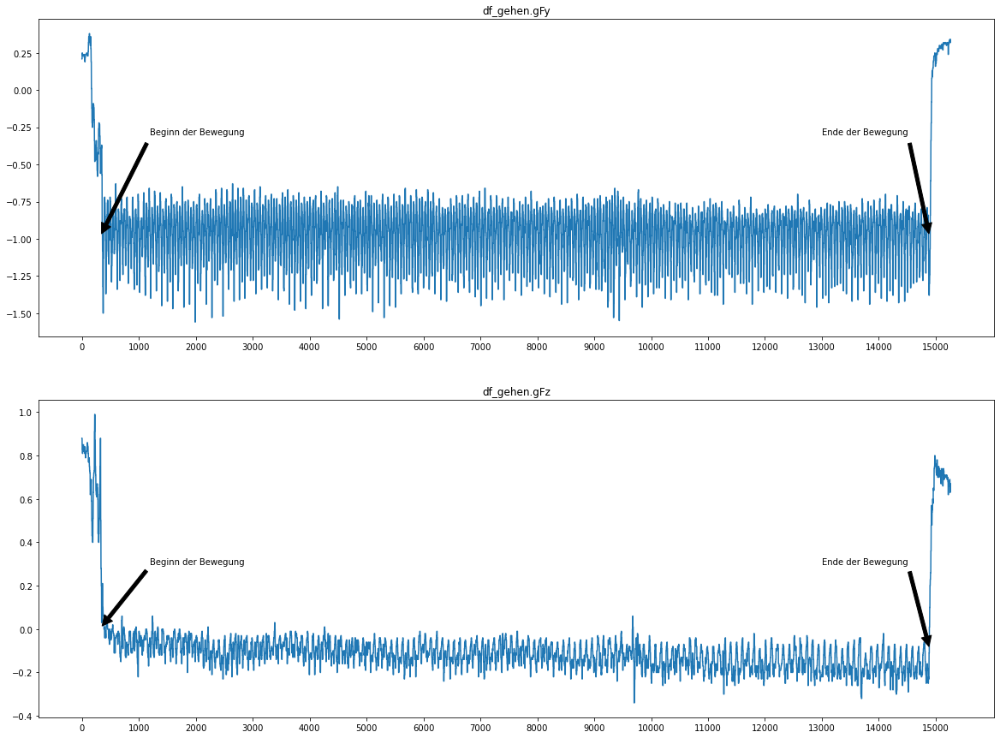

In [15]:
fig, (ax, ax2) = plt.subplots(2, 1)
ax.plot(df_gehen.gFy)
ax.annotate("Beginn der Bewegung", xy=(300,-1),
            xytext=(1200,-0.3),arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate("Ende der Bewegung", xy=(14900,-1), xytext=(13000,-0.3),arrowprops=dict(facecolor='black', shrink=0.05))
ax.set_title("df_gehen.gFy")
ax.set_xticks(np.arange(0, len(df_gehen.gFy), 1000))

ax2.set_title("df_gehen.gFz")
ax2.plot(df_gehen.gFz)
ax2.annotate("Beginn der Bewegung", xy=(310,0),
            xytext=(1200,0.3),arrowprops=dict(facecolor='black', shrink=0.05))
ax2.annotate("Ende der Bewegung", xy=(14900,-0.1), xytext=(13000,0.3),arrowprops=dict(facecolor='black', shrink=0.05))
ax2.set_xticks(np.arange(0, len(df_gehen.gFy), 1000))
plt.show()

Beginn und Ende der Bewegung für die jeweiligen DataFrames finden. 
Wurde für die jeweiligen Dataframes je einzeln ausgeführt und die Grenzen in der Zelle unterhalb festgehalten. Um das Notebook nicht unnötig aufzublähen, sind hier nicht mehr alle Plots vorhanden. Allgemeine explorative Plots zu den Daten befinden sich im zweiten Notebook. 

In [16]:
bounds_df_gehen = (400,14850)
bounds_df_laufen = (450,13350)
bounds_df_hampelmann = (450,11500)
bounds_df_hopser = (350,13500)
bounds_df_seilpringen = (350,13700)
bounds_df_trampolin = (120,15700)
bounds_df_schnee = (500,13900)

Zuschneiden der DataFrames auf den Zeitraum der Bewegung

In [17]:
df_gehen.shape, df_gehen.iloc[0:10].shape

((15261, 11), (10, 11))

In [18]:
df_gehen = df_gehen.iloc[bounds_df_gehen[0]: bounds_df_gehen[1]]
df_laufen = df_laufen.iloc[bounds_df_laufen[0]: bounds_df_laufen[1]]
df_hampelmann = df_hampelmann.iloc[bounds_df_hampelmann[0]: bounds_df_hampelmann[1]]
df_hopser = df_hopser.iloc[bounds_df_hopser[0]: bounds_df_hopser[1]]
df_seilspringen = df_seilspringen.iloc[bounds_df_seilpringen[0]: bounds_df_seilpringen[1]]
df_trampolin = df_trampolin.iloc[bounds_df_trampolin[0]: bounds_df_trampolin[1]]
df_schnee = df_schnee.iloc[bounds_df_schnee[0]: bounds_df_schnee[1]]

In [19]:
df_gehen.shape, df_laufen.shape, df_hampelmann.shape, df_hopser.shape, df_seilspringen.shape, df_trampolin.shape, df_schnee.shape

((14450, 11),
 (12900, 11),
 (11050, 11),
 (13150, 11),
 (13350, 11),
 (15580, 11),
 (13400, 11))

<a id="cutDfsTime"></a>
## Zuschneiden der Dfs auf Zeitbereich
Jetzt schauen wir uns die Dauer der Bewegung an, da nicht immer exakt 3 Minuten aufgezeichnet wurden.

In [20]:
df_gehen.time.max() - df_gehen.time.min()

178.90599298477173

In [21]:
df_laufen.time.max() - df_laufen.time.min() 

206.85000371932983

Man sieht hier wieder, dass df_gehen und df_laufen nicht auf dem gleichen Gerät aufgezeichnet wurden. df_laufen enthält knapp 1500 Datenpunkte (Zeilen) weniger, beschreibt aber einen längeren Zeitraum. Die Abtastfrequenz ist auf dem Gerät, mit dem df_laufen erzeugt wurde demnach niedriger.

In [22]:
df_hampelmann.time.max() - df_hampelmann.time.min() 

186.10699653625488

In [23]:
df_hopser.time.max() - df_hopser.time.min() 

210.8080005645752

In [24]:
df_seilspringen.time.max() - df_seilspringen.time.min() 

214.02399826049805

In [25]:
df_trampolin.time.max() - df_trampolin.time.min() 

249.80300402641296

In [26]:
df_schnee.time.max() - df_schnee.time.min() 

214.83299827575684

Wir müssen die Datensätze also noch auf maximal 3 Minuten zuschneiden, um "Fairness" gegenüber den anderen zu erlangen, bzw. der Aufgabenstellung zu entsprechen. Da in den folgenden Schritten alle DataFrames gleich behandelt werden, fassen wir sie in einer Liste zusammen, um sie komfortabler handhaben zu können.

In [27]:
dataList = [df_gehen, df_laufen, df_hampelmann, df_hopser, df_seilspringen, df_trampolin, df_schnee]

Die targetNames sind unsere Klassenlabel und entsprechen der Reihenfolge der DataFrames in der DataList

In [38]:
targetNames = ["Gehen", "Laufen", "Hampelmann", "Hopserlauf", "Seilspringen", "Trampolin", "Schneeschippen"]

In [20]:
def cutToMaxSeconds(dataList, maxSeconds=180):
    for idx, df in enumerate(dataList):
        df.time = df.time.astype(np.float64)
        upperTimeBound = 180 + df.time.min()
        dataList[idx] = df[df.time <= upperTimeBound]
        print(dataList[idx].shape)

In [30]:
cutToMaxSeconds(dataList)

(14450, 11)
(11226, 11)
(10668, 11)
(11227, 11)
(11228, 11)
(11227, 11)
(11227, 11)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

<a href="#top">Nach oben </a>
<a id="trainTestSplit"></a>
## Train-Test Split
Wir splitten die Daten in Train und Test. Test ist dabei unser Holdout-Set, das erst am Ende verwendet wird um das Modell zu bewerten. Dies machen wir vor der Datensatz-Generierung, da wir dabei eine Sliding-Window Technik verwenden. Wenn wir erst nach dem SlidingWindow splitten würden (und dabei einen normalen sklearn-Train-Test-Split machen würden), gäbe es eine Vermischung der Daten zwischen Trainings- und Testdaten.


Außerdem entfernen wir die Luftdrucksspalte "P", da diese Werte nicht von jedem Handy aufgezeichnet werden und der Wert maßgeblich beeinflusst wird durch den Aufnahmeort und den Druck, mit dem das Handy am Handgelenk angebracht wurde und vergleichsweise wenig durch die tatsächliche Bewegung (siehe auch Plotting-Notebook).

Um die Zeitliche Abhängigkeit der Daten zu berücksichtigen ziehen wir die Testdaten nicht zufällig, sondern nehmen die letzten 30%, also bei 3 Minuten trainieren wir auf 2 davon und nehmen die Letzte als Testdaten.

In [21]:
def customTrainTestSplit(dataList):
    data_Train, data_Test = pd.DataFrame(), pd.DataFrame()
    data_Train["label"] = -1
    data_Test["label"] = -1
    for index, data in enumerate(dataList):
        if ("P" in data.columns):
            data.drop(columns=["P"], inplace=True)

        testIndexBound = int(np.floor(len(data)*test_size))
        train = data.iloc[:len(data)-testIndexBound,:]
        test = data.iloc[-testIndexBound:,:]
        train.loc[:,"label"] = index
        test.loc[:,"label"] = index
        data_Train = data_Train.append(train, ignore_index=True)
        data_Test = data_Test.append(test, ignore_index=True)
        print("Done with index ", index)    
    return data_Train, data_Test

In [32]:
data_Train, data_Test = customTrainTestSplit(dataList)

Done with index  0
Done with index  1
Done with index  2
Done with index  3
Done with index  4
Done with index  5
Done with index  6


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1783: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

In [33]:
dataList[0].shape, data_Train.shape, data_Test.shape

((14450, 10), (56879, 11), (24374, 11))

Überprüfen ob alle Zeilen auf die Subsets verteilt wurden

In [34]:
totalLen = 0
for i in dataList:
    totalLen +=i.shape[0]

In [35]:
totalLen - data_Train.shape[0] - data_Test.shape[0]

0

# Baseline etablieren

In [27]:
# Der sklearn SimpleImputer kann nicht mit np.inf / np.NINF umgehen, daher ersetzen wir diese zuerst 
# mit np.nan und nutzen dann den SimpleImputer mit der mean-Strategie
def impute(X):
    X[X==np.inf]=np.nan
    X[X==np.NINF]=np.nan
    imp = SimpleImputer(missing_values=np.nan, strategy="mean")
    if (len(X.shape) == 1): 
        # array is 1d
        X = X.reshape(-1,1)
    return imp.fit_transform(X).astype(np.float32)

In [28]:
def standardize(dataset_train, dataset_test):
    stdscaler = StandardScaler()
    dataset_train_scaled = np.copy(dataset_train)
    dataset_test_scaled =  np.copy(dataset_test)
    
    stdscaler.fit(dataset_train[:,:-1])
    
    dataset_train_scaled[:,:-1] = stdscaler.transform(dataset_train[:,:-1])
    dataset_test_scaled[:,:-1] = stdscaler.transform(dataset_test[:,:-1])
    
    return dataset_train_scaled, dataset_test_scaled, stdscaler

In [29]:
def kFoldCrossVal(x_train, y_train, classifiers, k=5):
    kfld = StratifiedKFold(n_splits=k)
    current_fold = 1
    train_scores, val_scores = [],[]
    for train_index, test_index in kfld.split(x_train, y_train):
        fold_x_train, fold_x_test = x_train[train_index], x_train[test_index]
        fold_y_train, fold_y_test = y_train[train_index], y_train[test_index]
        print("fold: ", current_fold)
        current_fold += 1
        for clf in classifiers:
            print("clf: ", clf)
            clf.fit(fold_x_train, fold_y_train)
            print("fitted")
            train_y_hat = clf.predict(fold_x_train)
            test_y_hat = clf.predict(fold_x_test)
            # we use average="macro" because there shouldnt be a class-imbalance since we stratified the fold
            score_train = {"clf": clf,
                           "acc": accuracy_score(y_true=fold_y_train, y_pred=train_y_hat),
                           "f1": f1_score(y_true=fold_y_train, y_pred=train_y_hat, average="macro")
                          }
            score_test = {"clf": clf,
                   "acc": accuracy_score(y_true=fold_y_test, y_pred=test_y_hat),
                   "f1": f1_score(y_true=fold_y_test, y_pred=test_y_hat, average="macro")
                  }
            train_scores.append(score_train)
            val_scores.append(score_test)
            print("--"*50)
            print("TRAIN")
            print(classification_report(y_true=fold_y_train, y_pred=train_y_hat, target_names=targetNames))
            print("--"*50)
            print("Validation")
            print(classification_report(y_true=fold_y_test, y_pred=test_y_hat, target_names=targetNames))
            
    return train_scores, val_scores

In [30]:
def evaluateTest(classifiers, x_train, y_train, x_test, y_test, fileName=None):
    for clf in classifiers:
        print("clf: ", clf)
        print("fitting")
        clf.fit(x_train, y_train)
        print("done")
        test_y_hat = clf.predict(x_test)
        cm = confusion_matrix(y_test, test_y_hat)
        
        fileNameCM = None
        fileNamePlot = None
        if fileName:
            fileNameCM = "CM_" + str(clf) + fileName
            fileNamePlot = "Plot_" + str(clf) + fileName
        
        plot_confusion_matrix(cm, target_names=targetNames, normalize=False,
                              title="Confusion Matrix " + str(clf), fileName=fileNameCM)
        plotPrediction(test_y_hat,targetNames=targetNames, fileName=fileNamePlot, clfName=str(clf))
        print(classification_report(y_true=y_test, y_pred=test_y_hat, target_names=targetNames))

In [31]:
def scoreMeanStd(score, svc, rndforest, lr):
    svc_accs, svc_f1s = [], []
    forest_accs, forest_f1s = [], []
    lr_accs, lr_f1s = [], []
    for score in score:
        clf = score.get("clf")
        if (clf == svc):
            svc_accs.append(score.get("acc"))
            svc_f1s.append(score.get("f1"))
        elif (clf == rndforest):
            forest_accs.append(score.get("acc"))
            forest_f1s.append(score.get("f1"))
        elif (clf == lr):
            lr_accs.append(score.get("acc"))
            lr_f1s.append(score.get("f1"))
            
    if (svc!=None):
        print("SVC accuracy mean und std: {} , {}".format(np.mean(svc_accs), np.std(svc_accs)))
        print("SVC f1 mean und std: {} , {}".format(np.mean(svc_f1s), np.std(svc_f1s)))
        print("--"*50)
    if (rndforest!=None):
        print("RandomForest accuracy mean und std: {} , {}".format(np.mean(forest_accs), np.std(forest_accs)))
        print("RandomForest f1 mean und std: {} , {}".format(np.mean(forest_f1s), np.std(forest_f1s)))
        print("--"*50)
    if (lr!=None):
        print("LR accuracy mean und std: {} , {}".format(np.mean(lr_accs), np.std(lr_accs)))
        print("LR f1 mean und std: {} , {}".format(np.mean(lr_f1s), np.std(lr_f1s)))

<a id="generateBaseData"></a>
## Baseline Daten generieren

In [41]:
dataset_train = generateBaseDataset(data_Train)
dataset_test = generateBaseDataset(data_Test)

In [42]:
dataset_train = impute(dataset_train)
dataset_test = impute(dataset_test)

In [43]:
dataset_train_scaled, dataset_test_scaled, stdScalerTrainData = standardize(dataset_train, dataset_test)

In [44]:
x_train = dataset_train_scaled[:, :-1].astype("float32")
y_train = dataset_train_scaled[:,-1].astype("int")

In [45]:
x_test = dataset_test_scaled[:,:-1].astype("float32")
y_test = dataset_test_scaled[:,-1].astype("int")

In [46]:
classifiers = [RandomForestClassifier(random_state=RND_STATE), SVC(cache_size=25000, random_state=RND_STATE), LogisticRegression(random_state=RND_STATE)]

<a id="cvBaseData"></a>
## Baseline Daten Cross Validation

In [47]:
train_scores, val_scores = kFoldCrossVal(x_train=x_train,y_train=y_train,classifiers=classifiers,k=5)

fold:  1
clf:  RandomForestClassifier(random_state=42)
fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8092
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6288
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45503
     macro avg       1.00      1.00      1.00     45503
  weighted avg       1.00      1.00      1.00     45503

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       0.99      0.99      0.

fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8092
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5975
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45503
     macro avg       1.00      1.00      1.00     45503
  weighted avg       1.00      1.00      1.00     45503

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      0.99      1.00      2023
        Laufen       0.99      1.00      1

fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8092
        Laufen       1.00      1.00      1.00      6288
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6288

      accuracy                           1.00     45504
     macro avg       1.00      1.00      1.00     45504
  weighted avg       1.00      1.00      1.00     45504

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      0.84      0.91      2023
        Laufen       0.97      1.00      0

In [48]:
scoreMeanStd(train_scores, svc=classifiers[1], rndforest=classifiers[0], lr=classifiers[2])

SVC accuracy mean und std: 0.9912973143870547 , 0.0013364275380362072
SVC f1 mean und std: 0.9912261318241411 , 0.0013446818395822723
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 1.0 , 0.0
RandomForest f1 mean und std: 1.0 , 0.0
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.7242610946263632 , 0.014225821609829083
LR f1 mean und std: 0.7158503494227612 , 0.015028070388802505


In [49]:
scoreMeanStd(val_scores, svc=classifiers[1], rndforest=classifiers[0], lr=classifiers[2])

SVC accuracy mean und std: 0.9616374090044977 , 0.03149781118670258
SVC f1 mean und std: 0.9601544202663076 , 0.03277216104537299
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 0.9572594426670376 , 0.03233424311340642
RandomForest f1 mean und std: 0.9565173925210093 , 0.03252530623474255
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.7050226410720082 , 0.062284110323233687
LR f1 mean und std: 0.6942913016495686 , 0.06535528434199957


clf:  RandomForestClassifier(random_state=42)
fitting
done


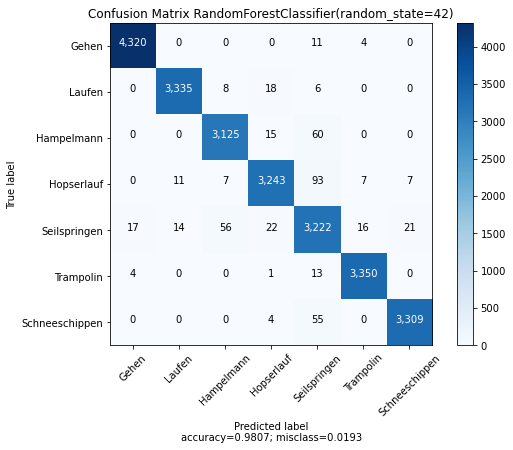

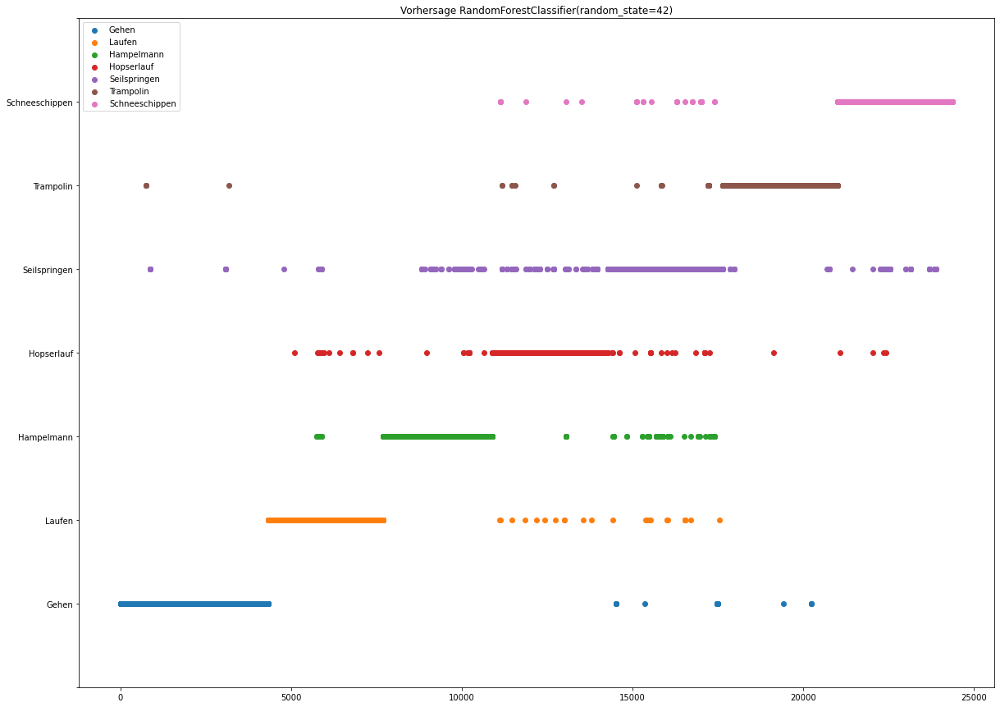

                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      4335
        Laufen       0.99      0.99      0.99      3367
    Hampelmann       0.98      0.98      0.98      3200
    Hopserlauf       0.98      0.96      0.97      3368
  Seilspringen       0.93      0.96      0.94      3368
     Trampolin       0.99      0.99      0.99      3368
Schneeschippen       0.99      0.98      0.99      3368

      accuracy                           0.98     24374
     macro avg       0.98      0.98      0.98     24374
  weighted avg       0.98      0.98      0.98     24374

clf:  SVC(cache_size=25000, random_state=42)
fitting
done


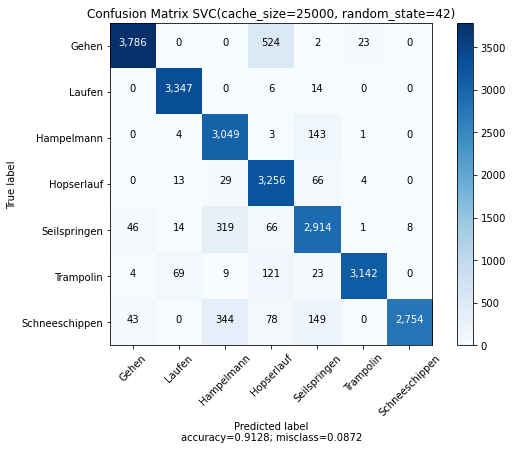

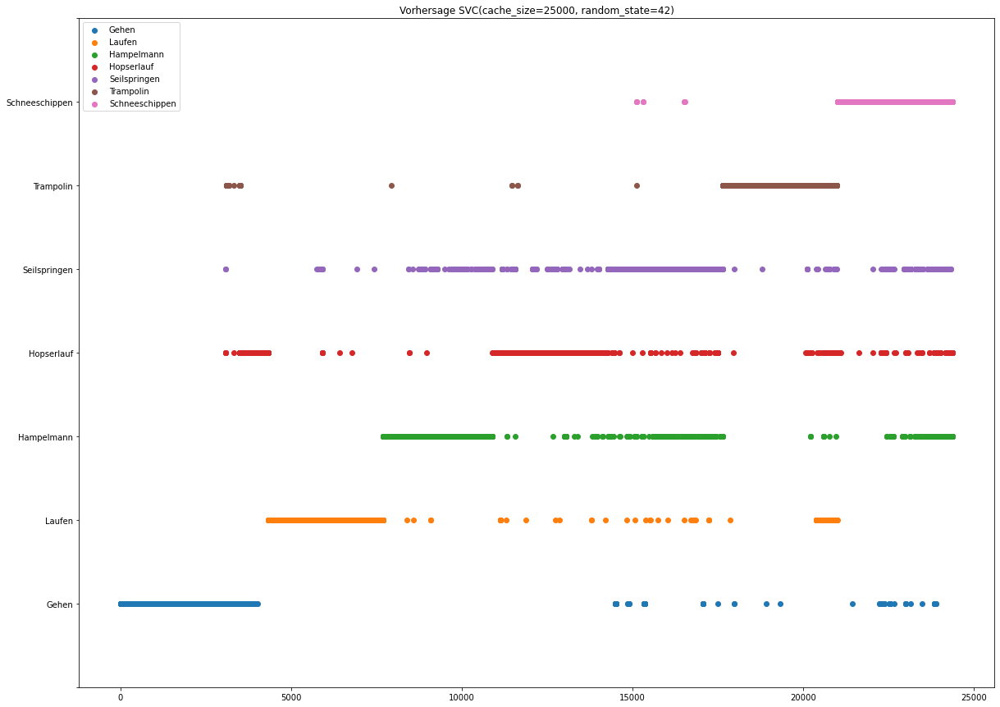

                precision    recall  f1-score   support

         Gehen       0.98      0.87      0.92      4335
        Laufen       0.97      0.99      0.98      3367
    Hampelmann       0.81      0.95      0.88      3200
    Hopserlauf       0.80      0.97      0.88      3368
  Seilspringen       0.88      0.87      0.87      3368
     Trampolin       0.99      0.93      0.96      3368
Schneeschippen       1.00      0.82      0.90      3368

      accuracy                           0.91     24374
     macro avg       0.92      0.91      0.91     24374
  weighted avg       0.92      0.91      0.91     24374

clf:  LogisticRegression(random_state=42)
fitting
done


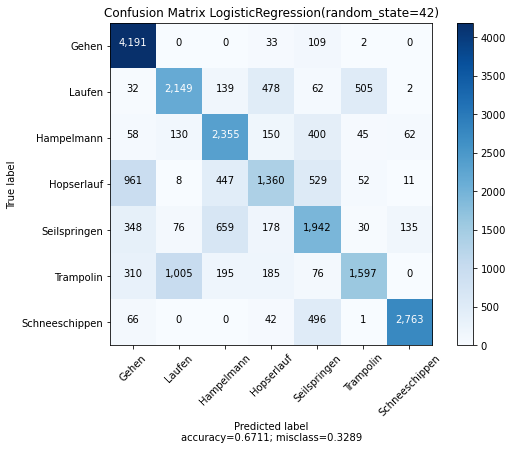

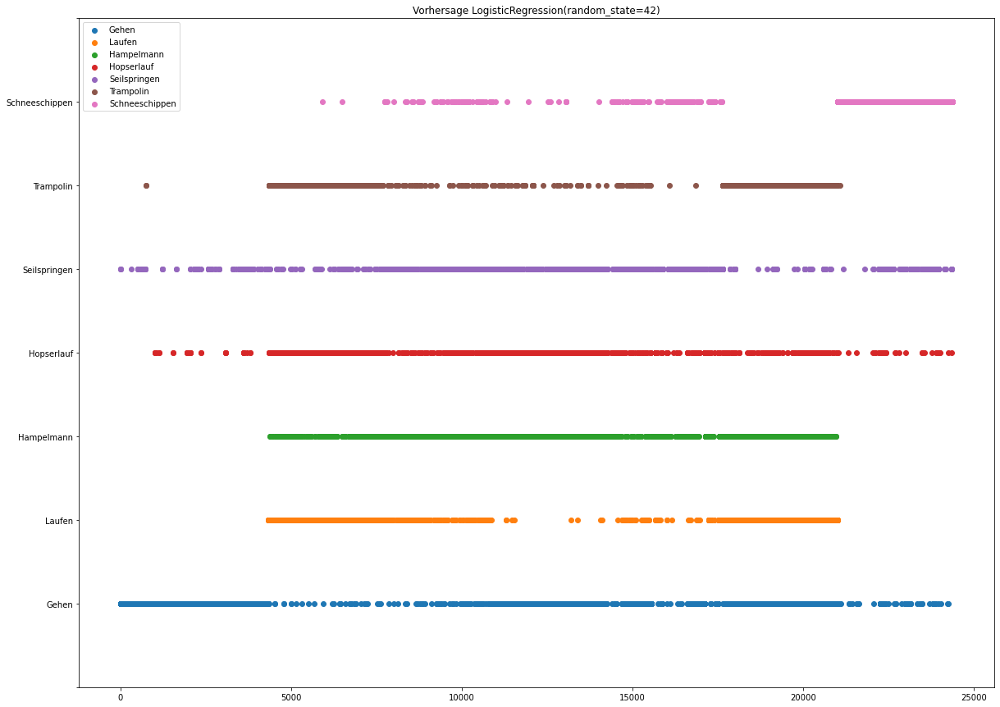

                precision    recall  f1-score   support

         Gehen       0.70      0.97      0.81      4335
        Laufen       0.64      0.64      0.64      3367
    Hampelmann       0.62      0.74      0.67      3200
    Hopserlauf       0.56      0.40      0.47      3368
  Seilspringen       0.54      0.58      0.56      3368
     Trampolin       0.72      0.47      0.57      3368
Schneeschippen       0.93      0.82      0.87      3368

      accuracy                           0.67     24374
     macro avg       0.67      0.66      0.66     24374
  weighted avg       0.67      0.67      0.66     24374



In [50]:
evaluateTest(classifiers, x_train, y_train, x_test, y_test, fileName="baseline.png")

<a href="#top">Nach oben</a>
<a id="baseDataResult"></a>
## Resultat des Vergleichs ohne Featureengineering

Das Ergebnis hängt stark vom Klassifizierer ab. Während der Random-Forest auch mit den Basisdaten schon sehr gute und die SVM etwas schlechtere, dennoch gute Genauigkeiten erzielen, ist die LogisticRegression deutlich schlechter.

Um die Verallgemeinerungsfähigkeit unserer Klassifizierer in einem pseudo-realen Szenario besser beurteilen zu können haben wir mit zwei anderen Gruppen die Daten ausgetauscht und Vergleichen das nun.

### Vergleich Gruppe 1

In [51]:
df_unbekannt_gruppe1 = pd.read_csv("data/vergleich/combined.csv", sep=";", decimal=",")

In [52]:
df_unbekannt_gruppe1["label"] = -1
df_unbekannt_gruppe1.loc[0:10948, "label"] = 0
df_unbekannt_gruppe1.loc[10949:24975, "label"] = 1
df_unbekannt_gruppe1.loc[24975:35421, "label"] = 2
df_unbekannt_gruppe1.loc[35421:50946, "label"] = 3
df_unbekannt_gruppe1.loc[50946:, "label"] = 4

In [53]:
#Wird in den Orginaldaten durch den Train-Test-Split erledigt, der allerdings an dieser Stelle nicht notwendig ist.
if ("P" in df_unbekannt_gruppe1.columns):
    df_unbekannt_gruppe1.drop(columns=["P"], inplace=True)

In [54]:
dataset_Test_unknown_gruppe1 = generateBaseDataset(df_unbekannt_gruppe1)

In [55]:
dataset_Test_unknown_gruppe1 = impute(dataset_Test_unknown_gruppe1)

In [56]:
x_test_unknown_gruppe1 = dataset_Test_unknown_gruppe1[:,:-1].astype("float32")
y_test_unknown_gruppe1 = dataset_Test_unknown_gruppe1[:,-1].astype("int")

In [57]:
#Diese Operation wird normalerweise von der standardize-Funktion durchgeführt. 
x_test_unknown_gruppe1 = StandardScaler().fit_transform(x_test_unknown_gruppe1)

In [58]:
x_test_unknown_gruppe1.shape

(60927, 10)

clf:  RandomForestClassifier(random_state=42)
fitting
done


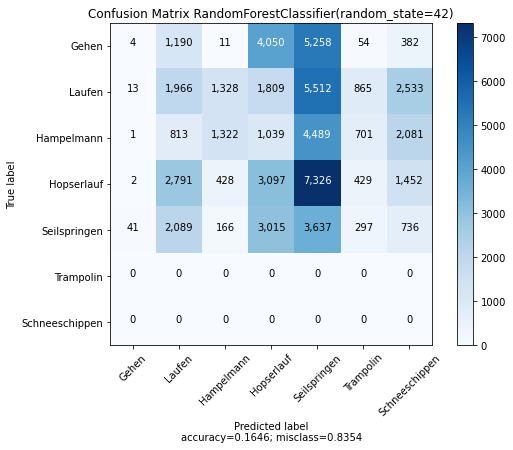

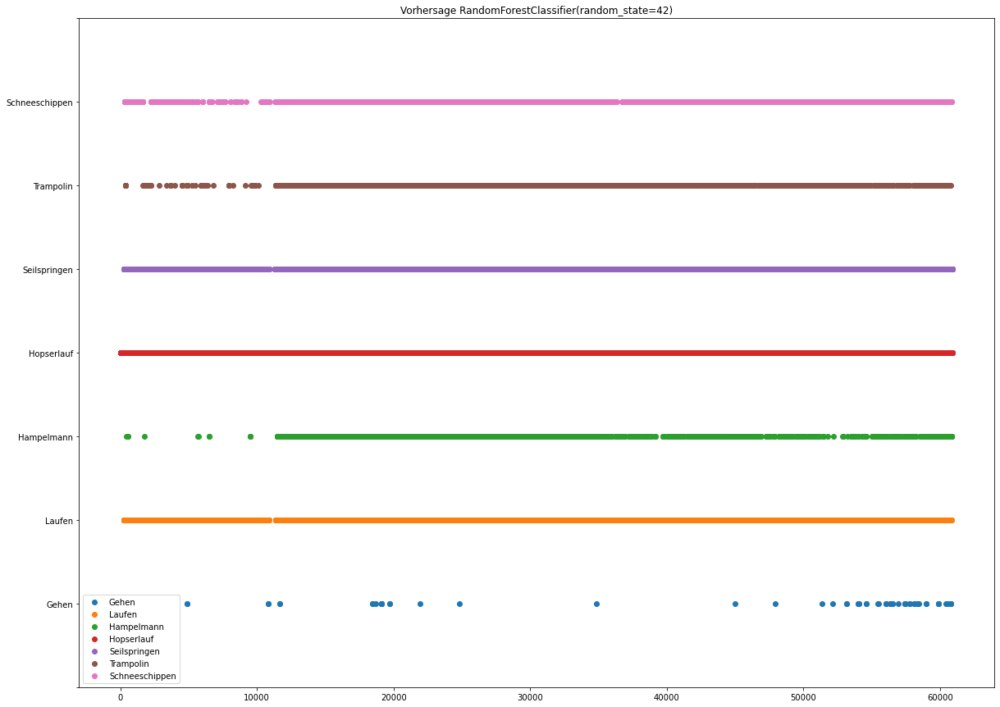

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       0.07      0.00      0.00     10949
        Laufen       0.22      0.14      0.17     14026
    Hampelmann       0.41      0.13      0.19     10446
    Hopserlauf       0.24      0.20      0.22     15525
  Seilspringen       0.14      0.36      0.20      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.16     60927
     macro avg       0.15      0.12      0.11     60927
  weighted avg       0.22      0.16      0.16     60927

clf:  SVC(cache_size=25000, random_state=42)
fitting
done


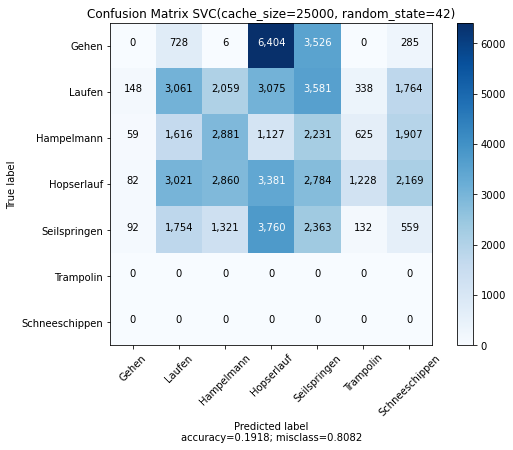

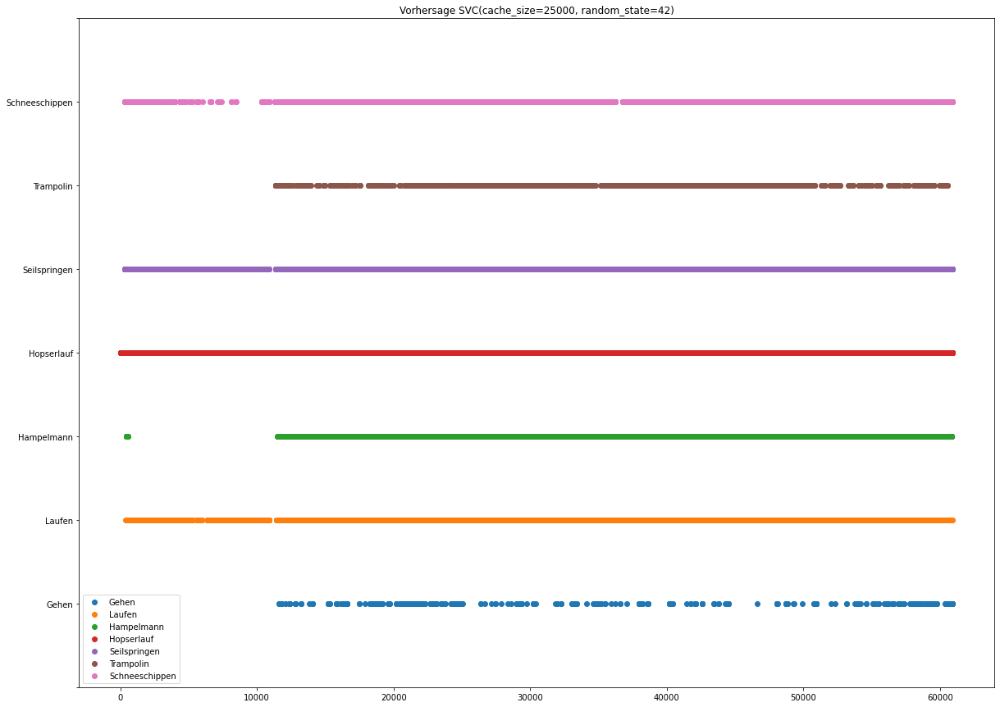

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       0.00      0.00      0.00     10949
        Laufen       0.30      0.22      0.25     14026
    Hampelmann       0.32      0.28      0.29     10446
    Hopserlauf       0.19      0.22      0.20     15525
  Seilspringen       0.16      0.24      0.19      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.19     60927
     macro avg       0.14      0.14      0.13     60927
  weighted avg       0.20      0.19      0.19     60927

clf:  LogisticRegression(random_state=42)
fitting
done


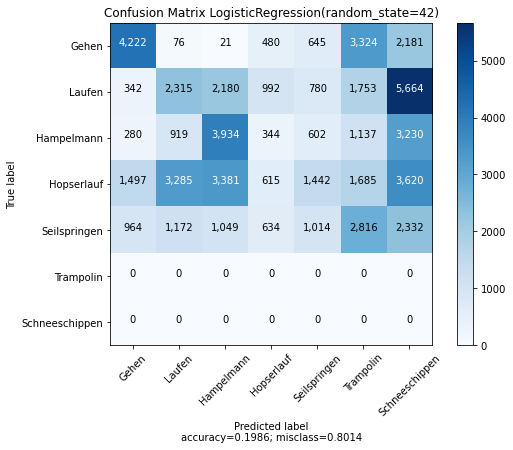

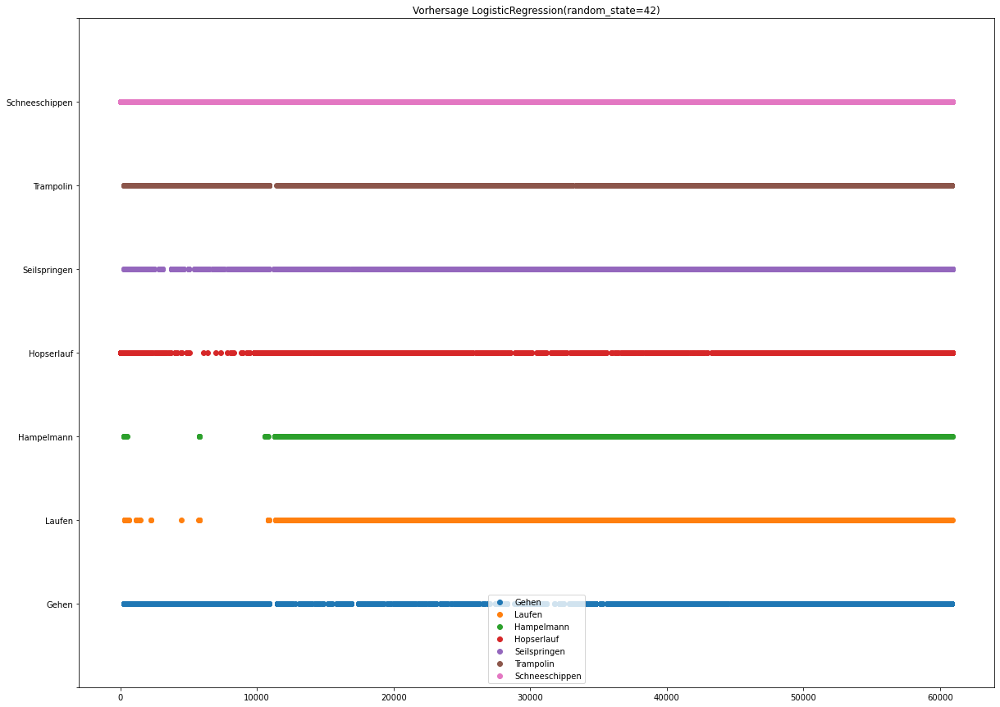

                precision    recall  f1-score   support

         Gehen       0.58      0.39      0.46     10949
        Laufen       0.30      0.17      0.21     14026
    Hampelmann       0.37      0.38      0.37     10446
    Hopserlauf       0.20      0.04      0.07     15525
  Seilspringen       0.23      0.10      0.14      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.20     60927
     macro avg       0.24      0.15      0.18     60927
  weighted avg       0.32      0.20      0.24     60927



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [59]:
evaluateTest(classifiers, x_train, y_train, x_test_unknown_gruppe1, y_test_unknown_gruppe1, fileName="baseline_grp1.png")

### Vergleich Gruppe 2

In [61]:
df_unbekannt_gruppe2 = pd.read_csv("data/vergleich/gruppe2/combined_gruppe2.csv", sep=";", decimal=",")

In [62]:
df_unbekannt_gruppe2["label"]=-1
df_unbekannt_gruppe2.loc[0:17351, "label"] = 0
df_unbekannt_gruppe2.loc[17351:34064, "label"] = 1
df_unbekannt_gruppe2.loc[34064:45613, "label"] = 2
df_unbekannt_gruppe2.loc[45613:62791, "label"] = 3
df_unbekannt_gruppe2.loc[62791:, "label"] = 4

In [63]:
#Wird in den Orginaldaten durch den Train-Test-Split erledigt, der allerdings an dieser Stelle nicht notwendig ist.
if ("P" in df_unbekannt_gruppe2.columns):
    df_unbekannt_gruppe2.drop(columns=["P"], inplace=True)

In [64]:
dataset_Test_unknown_gruppe2 = generateBaseDataset(df_unbekannt_gruppe2)

In [65]:
dataset_Test_unknown_gruppe2 = impute(dataset_Test_unknown_gruppe2)

In [66]:
x_test_unknown_gruppe2 = dataset_Test_unknown_gruppe2[:,:-1].astype("float32")
y_test_unknown_gruppe2 = dataset_Test_unknown_gruppe2[:,-1].astype("int")

In [67]:
x_test_unknown_gruppe2 = StandardScaler().fit_transform(x_test_unknown_gruppe2)

In [68]:
x_test_unknown_gruppe2.shape

(74191, 10)

clf:  RandomForestClassifier(random_state=42)
fitting
done


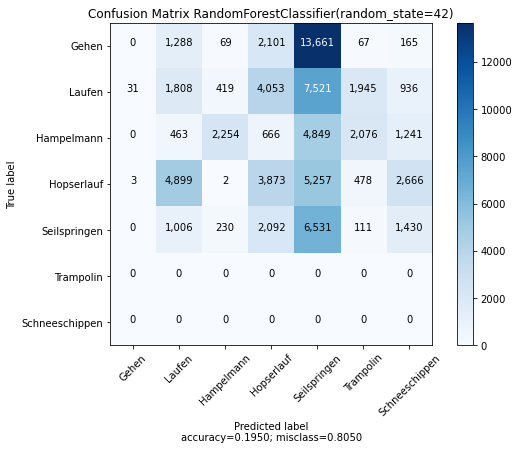

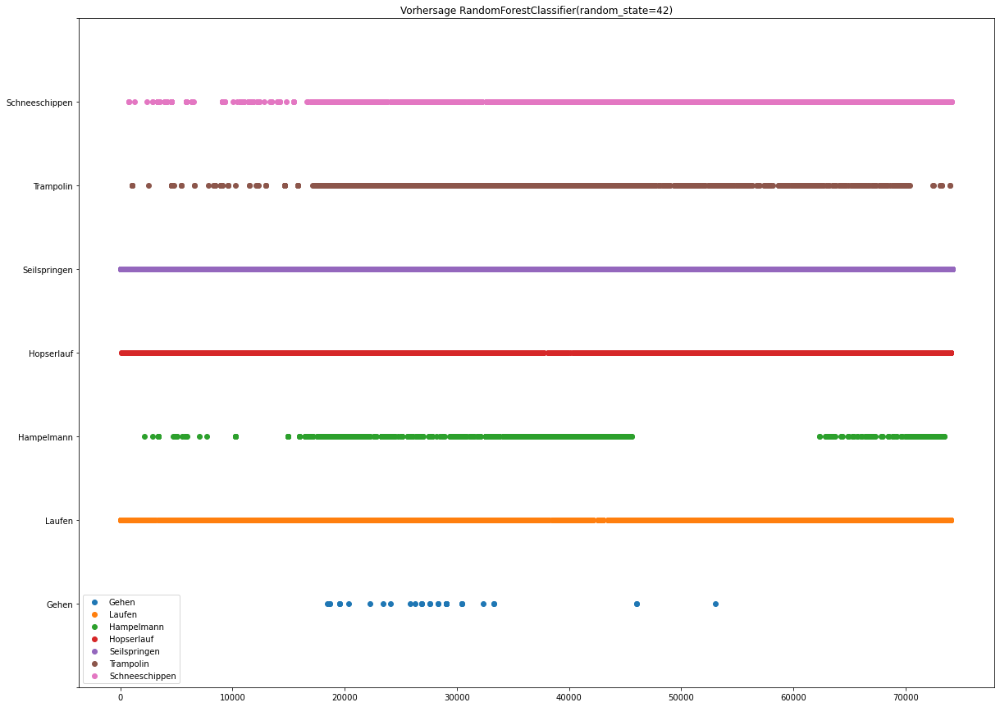

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       0.00      0.00      0.00     17351
        Laufen       0.19      0.11      0.14     16713
    Hampelmann       0.76      0.20      0.31     11549
    Hopserlauf       0.30      0.23      0.26     17178
  Seilspringen       0.17      0.57      0.27     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.19     74191
     macro avg       0.20      0.16      0.14     74191
  weighted avg       0.26      0.19      0.18     74191

clf:  SVC(cache_size=25000, random_state=42)
fitting
done


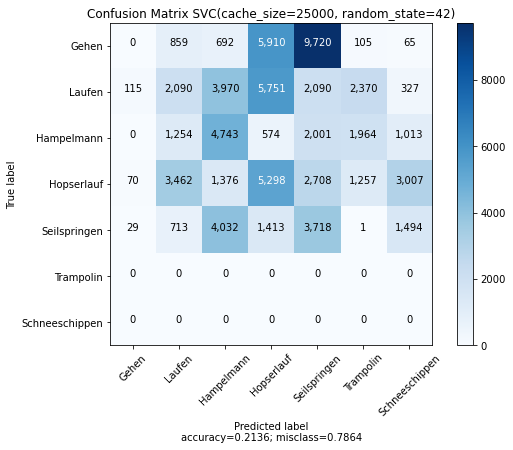

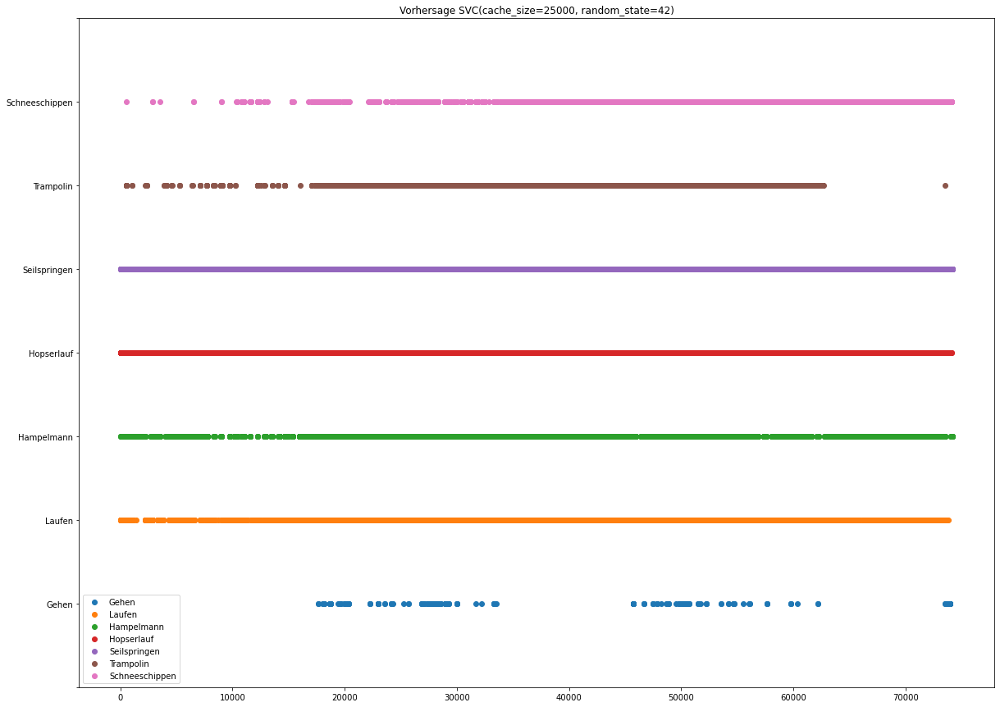

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       0.00      0.00      0.00     17351
        Laufen       0.25      0.13      0.17     16713
    Hampelmann       0.32      0.41      0.36     11549
    Hopserlauf       0.28      0.31      0.29     17178
  Seilspringen       0.18      0.33      0.24     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.21     74191
     macro avg       0.15      0.17      0.15     74191
  weighted avg       0.20      0.21      0.20     74191

clf:  LogisticRegression(random_state=42)
fitting
done


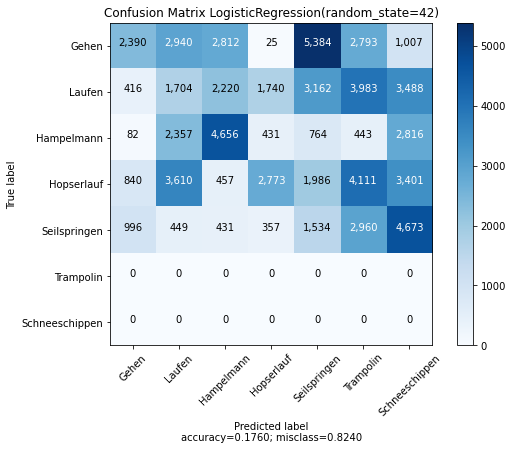

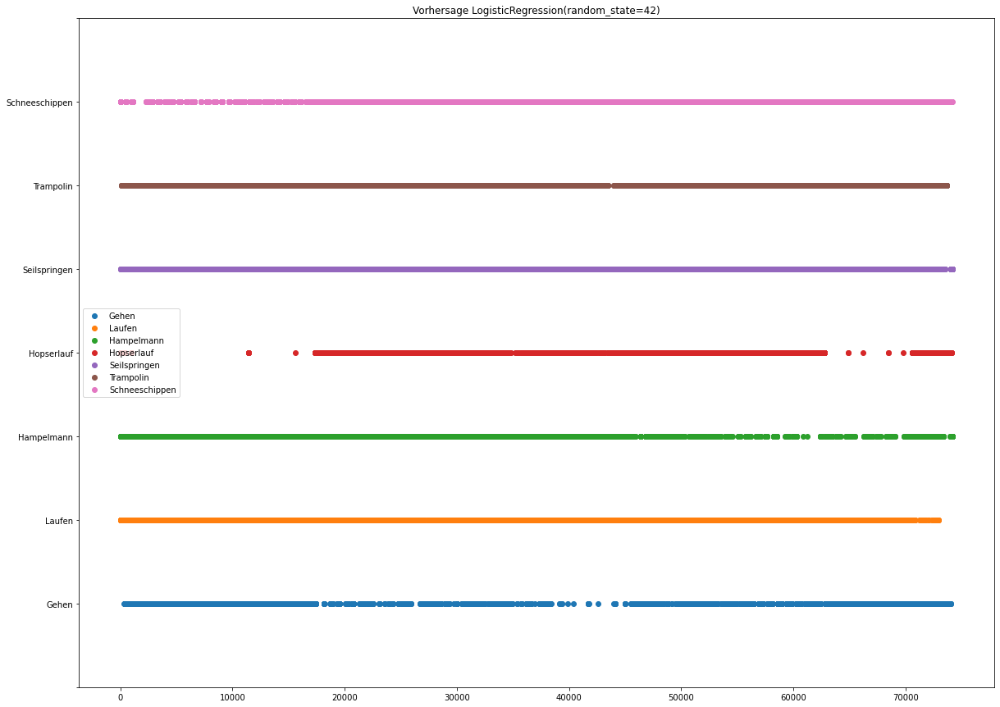

                precision    recall  f1-score   support

         Gehen       0.51      0.14      0.22     17351
        Laufen       0.15      0.10      0.12     16713
    Hampelmann       0.44      0.40      0.42     11549
    Hopserlauf       0.52      0.16      0.25     17178
  Seilspringen       0.12      0.13      0.13     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.18     74191
     macro avg       0.25      0.13      0.16     74191
  weighted avg       0.36      0.18      0.22     74191



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [69]:
evaluateTest(classifiers, x_train, y_train, x_test_unknown_gruppe2, y_test_unknown_gruppe2, fileName="baseline_grp2.png")

## Ergebnis Basisdaten, andere Gruppen

Die Klassifizierer versagen bei beiden Gruppen. Während der RandomForest auf unseren Daten 98% Genauigkeit erreicht, schafft er bei Gruppe 1 lediglich 16% und bei Gruppe 2 20%. Ein ähnliches Bild zeigt sich bei den anderen Klassifizieren.

Sehr interessant ist, dass die SVM bei beiden Gruppen besser performt als der RandomForest, obwohl der RandomForest auf unseren Testdaten der beste war. Das spricht dafür, dass der RandomForest die Daten so trennt, dass es für unsere Daten gut passt, bei anderen Gruppen allerdings nicht mehr. Die SVM scheint robuster zu sein, wenn auch nur geringfügig. 

# Wichtige Erkenntnis

Bis auf den Datensatz Gehen wurden alle anderen Datensätze auf einem Smartphone aufgenommen, dessen Sprache auf Englisch eingestellt ist. Es sieht alles danach aus, das dabei die Orientierung der Achsen genau vertauscht ist. 
Daher ist es keine große Überraschung, dass die Klassifikation mit den Basisdaten nur sehr schlecht funktioniert.
Glücklicherweise fängt unsere Feature-Generierung das zum Teil ab. Beispielsweise sind die Achsenverhältnisse davon nicht betroffen, da das Vorzeichen beim Quotienten gleich bleibt, wenn die Vorzeichen von Zähler und Nenner vertauscht sind.

# Feature Engineering

<a id="featureGeneration"></a>
## Feature Generation / Extraction

In [10]:
# https://stackoverflow.com/a/35696047
# returned 0 statt +/-inf bei Teilen durch 0
def saveDivide(a, b):
    """ ignore / 0, div0( [-1, 0, 1], 0 ) -> [0, 0, 0] """
    with np.errstate(divide='ignore', invalid='ignore'):
        c = np.true_divide( a, b )
        c[ ~ np.isfinite( c )] = 0  # -inf inf NaN
    return c

In [11]:
def generateBestDataset(data):
    print("windowsize: ", WINDOW_SIZE)
    dataset = []
    # wir berechnen die Magnituden (L2-Norm) der Sensordaten
    gF_magnitude = "gF_magnitude"
    a_magnitude = "a_magnitude"
    w_magnitude = "w_magnitude"
    data.loc[:,gF_magnitude] = np.sqrt(
        data["gFx"]**2 + data["gFy"]**2 + data["gFz"]**2)
    data.loc[:,a_magnitude] = np.sqrt(
        data["ax"]**2 + data["ay"]**2 + data["az"]**2)
    data.loc[:,w_magnitude] = np.sqrt(
        data["wx"]**2 + data["wy"]**2 + data["wz"]**2)

    # init sliding window mittels der ersten 10 Werte
    sldWinGforce = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE][gF_magnitude].to_numpy())
    sldwinA = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE][a_magnitude].to_numpy())
    sldwinW = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE][w_magnitude].to_numpy())
    
    # Ratios
    
    data.loc[:,"x_ratio_gF_a"] = saveDivide(data.loc[:,"gFx"], data.loc[:,"ax"])
    data.loc[:,"y_ratio_gF_a"] = saveDivide(data.loc[:,"gFy"], data.loc[:,"ay"])
    data.loc[:,"z_ratio_gF_a"] = saveDivide(data.loc[:,"gFz"], data.loc[:,"az"])

    data.loc[:,"x_ratio_gF_w"] =  saveDivide(data.loc[:,"gFx"], data.loc[:,"wx"])
    data.loc[:,"y_ratio_gF_w"] =  saveDivide(data.loc[:,"gFy"], data.loc[:,"wy"])
    data.loc[:,"z_ratio_gF_w"] =  saveDivide(data.loc[:,"gFz"], data.loc[:,"wz"])

    data.loc[:,"x_ratio_a_w"] =  saveDivide(data.loc[:,"ax"], data.loc[:,"wx"])
    data.loc[:,"y_ratio_a_w"] =  saveDivide(data.loc[:,"ay"], data.loc[:,"wy"])
    data.loc[:,"z_ratio_a_w"] =  saveDivide(data.loc[:,"az"], data.loc[:,"wz"])
    
    sldWinRatioX_gFa = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["x_ratio_gF_a"].to_numpy())
    sldWinRatioY_gFa = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["y_ratio_gF_a"].to_numpy())
    sldWinRatioZ_gFa = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["z_ratio_gF_a"].to_numpy())    
    
    sldWinRatioX_gFw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["x_ratio_gF_w"].to_numpy())
    sldWinRatioY_gFw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["y_ratio_gF_w"].to_numpy())
    sldWinRatioZ_gFw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["z_ratio_gF_w"].to_numpy())    
    
    sldWinRatioX_aw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["x_ratio_a_w"].to_numpy())
    sldWinRatioY_aw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["y_ratio_a_w"].to_numpy())
    sldWinRatioZ_aw = SlidingWindow(
        WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["z_ratio_a_w"].to_numpy())
    
    lagForAxis = 4

    data.loc[:,"gFx_lagged"] = data["gFx"].shift(
        lagForAxis).fillna(value=data.gFx.mean())
    data.loc[:,"gFy_lagged"] = data["gFy"].shift(
        lagForAxis).fillna(value=data.gFy.mean())
    data.loc[:,"gFz_lagged"] = data["gFz"].shift(
        lagForAxis).fillna(value=data.gFz.mean())

    data.loc[:,"ax_lagged"] = data["ax"].shift(
        lagForAxis).fillna(value=data.ax.mean())
    data.loc[:,"ay_lagged"] = data["ay"].shift(
        lagForAxis).fillna(value=data.ay.mean())
    data.loc[:,"az_lagged"] = data["az"].shift(
        lagForAxis).fillna(value=data.az.mean())

    data.loc[:,"wx_lagged"] = data["wx"].shift(
        lagForAxis).fillna(value=data.wx.mean())
    data.loc[:,"wy_lagged"] = data["wy"].shift(
        lagForAxis).fillna(value=data.wy.mean())
    data.loc[:,"wz_lagged"] = data["wz"].shift(
        lagForAxis).fillna(value=data.wz.mean())
    
    
    sldWinLagged_gFx =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["gFx_lagged"].to_numpy())
    sldWinLagged_gFy =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["gFy_lagged"].to_numpy())
    sldWinLagged_gFz =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["gFz_lagged"].to_numpy())
    
    sldWinLagged_ax =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["ax_lagged"].to_numpy())
    sldWinLagged_ay =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["ay_lagged"].to_numpy())
    sldWinLagged_az =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["az_lagged"].to_numpy())
    
    sldWinLagged_wx =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["wx_lagged"].to_numpy())
    sldWinLagged_wy =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["wy_lagged"].to_numpy())
    sldWinLagged_wz =  SlidingWindow(WINDOW_SIZE, data.iloc[0:WINDOW_SIZE]["wz_lagged"].to_numpy())
  

    # We dont use the initial buffer, but this only results in the loss of 1 data point
    # iterate over the remaining rows
    for i in range(WINDOW_SIZE, len(data)):
        if (i%5000==0):
            print("at index ", i)
            
        sldWinGforce.add(data.iloc[i][gF_magnitude])
        sldwinA.add(data.iloc[i][a_magnitude])
        sldwinW.add(data.iloc[i][w_magnitude])
        
        sldWinRatioX_gFa.add(data.iloc[i]["x_ratio_gF_a"])        
        sldWinRatioY_gFa.add(data.iloc[i]["y_ratio_gF_a"])        
        sldWinRatioZ_gFa.add(data.iloc[i]["z_ratio_gF_a"])    
        
        sldWinRatioX_gFw.add(data.iloc[i]["x_ratio_gF_w"])        
        sldWinRatioY_gFw.add(data.iloc[i]["y_ratio_gF_w"])        
        sldWinRatioZ_gFw.add(data.iloc[i]["z_ratio_gF_w"])
                
        sldWinRatioX_aw.add(data.iloc[i]["x_ratio_a_w"])        
        sldWinRatioY_aw.add(data.iloc[i]["y_ratio_a_w"])        
        sldWinRatioZ_aw.add(data.iloc[i]["z_ratio_a_w"])
        
        
        sldWinLagged_gFx.add(data.iloc[i]["gFx_lagged"])        
        sldWinLagged_gFy.add(data.iloc[i]["gFy_lagged"])        
        sldWinLagged_gFz.add(data.iloc[i]["gFz_lagged"])  
        
        sldWinLagged_ax.add(data.iloc[i]["ax_lagged"])        
        sldWinLagged_ay.add(data.iloc[i]["ay_lagged"])        
        sldWinLagged_az.add(data.iloc[i]["az_lagged"])
        
        sldWinLagged_wx.add(data.iloc[i]["wx_lagged"])        
        sldWinLagged_wy.add(data.iloc[i]["wy_lagged"])        
        sldWinLagged_wz.add(data.iloc[i]["wz_lagged"])   
        
        
        wind_gFx = data.iloc[i-WINDOW_SIZE:i]["gFx"].to_numpy()
        wind_ax = data.iloc[i-WINDOW_SIZE:i]["ax"].to_numpy()
        wind_wx = data.iloc[i-WINDOW_SIZE:i]["wx"].to_numpy()
        wind_gFy = data.iloc[i-WINDOW_SIZE:i]["gFy"].to_numpy()
        wind_ay = data.iloc[i-WINDOW_SIZE:i]["ay"].to_numpy()
        wind_wy = data.iloc[i-WINDOW_SIZE:i]["wy"].to_numpy()
        wind_gFz = data.iloc[i-WINDOW_SIZE:i]["gFz"].to_numpy()
        wind_az = data.iloc[i-WINDOW_SIZE:i]["az"].to_numpy()
        wind_wz = data.iloc[i-WINDOW_SIZE:i]["wz"].to_numpy()

        # x coord
        pearson_gFx_ax = getPearsonCorrCoef(wind_gFx, wind_ax)
        pearson_gFx_wx = getPearsonCorrCoef(wind_gFx, wind_wx)
        pearson_ax_wx = getPearsonCorrCoef(wind_ax, wind_wx)

        rms_gFx = getRMS(wind_gFx)
        rms_ax = getRMS(wind_ax)
        rms_wx = getRMS(wind_wx)

        waveletSum_gFx = getWaveletCoeffSum(wind_gFx)
        waveletSum_ax = getWaveletCoeffSum(wind_ax)
        waveletSum_wx = getWaveletCoeffSum(wind_wx)

        dist_gFx_ax = getEuclidDist(wind_gFx, wind_ax)
        dist_gFx_wx = getEuclidDist(wind_gFx, wind_wx)
        dist_wx_ax = getEuclidDist(wind_wx, wind_ax)

        # y coord
        pearson_gFy_ay = getPearsonCorrCoef(wind_gFy, wind_ay)
        pearson_gFy_wy = getPearsonCorrCoef(wind_gFy, wind_wy)
        pearson_ay_wy = getPearsonCorrCoef(wind_ay, wind_wy)

        rms_gFy = getRMS(wind_gFy)
        rms_ay = getRMS(wind_ay)
        rms_wy = getRMS(wind_wy)

        waveletSum_gFy = getWaveletCoeffSum(wind_gFy)
        waveletSum_ay = getWaveletCoeffSum(wind_ay)
        waveletSum_wy = getWaveletCoeffSum(wind_wy)

        dist_gFy_ay = getEuclidDist(wind_gFy, wind_ay)
        dist_gFy_wy = getEuclidDist(wind_gFy, wind_wy)
        dist_wy_ay = getEuclidDist(wind_wy, wind_ay)

        # z coord
        pearson_gFz_az = getPearsonCorrCoef(wind_gFz, wind_az)
        pearson_gFz_wz = getPearsonCorrCoef(wind_gFz, wind_wz)
        pearson_az_wz = getPearsonCorrCoef(wind_az, wind_wz)

        rms_gFz = getRMS(wind_gFz)
        rms_az = getRMS(wind_az)
        rms_wz = getRMS(wind_wz)

        waveletSum_gFz = getWaveletCoeffSum(wind_gFz)
        waveletSum_az = getWaveletCoeffSum(wind_az)
        waveletSum_wz = getWaveletCoeffSum(wind_wz)

        dist_gFz_az = getEuclidDist(wind_gFz, wind_az)
        dist_gFz_wz = getEuclidDist(wind_gFz, wind_wz)
        dist_wz_az = getEuclidDist(wind_wz, wind_az)

        featureVector = [
            # magnitudes
            *sldWinGforce.getFeatureVector(), *sldwinA.getFeatureVector(), *
            sldwinW.getFeatureVector(),
            
            #ratios
            *sldWinRatioX_gFa.getFeatureVector(),*sldWinRatioY_gFa.getFeatureVector(),*sldWinRatioZ_gFa.getFeatureVector(),
            *sldWinRatioX_gFw.getFeatureVector(),*sldWinRatioY_gFw.getFeatureVector(),*sldWinRatioZ_gFw.getFeatureVector(),
            *sldWinRatioX_aw.getFeatureVector(),*sldWinRatioY_aw.getFeatureVector(),*sldWinRatioZ_aw.getFeatureVector(),
            
            #lagged
            *sldWinLagged_gFx.getFeatureVector(),*sldWinLagged_gFy.getFeatureVector(),*sldWinLagged_gFz.getFeatureVector(),
            *sldWinLagged_ax.getFeatureVector(),*sldWinLagged_ay.getFeatureVector(),*sldWinLagged_az.getFeatureVector(),
            *sldWinLagged_wx.getFeatureVector(),*sldWinLagged_wy.getFeatureVector(),*sldWinLagged_wz.getFeatureVector(),
            
            # now the features from the paper
            # x axis
            pearson_gFx_ax, pearson_gFx_wx, pearson_ax_wx,
            rms_gFx, rms_ax, rms_wx,
            waveletSum_gFx, waveletSum_ax, waveletSum_wx,
            dist_gFx_ax, dist_gFx_wx, dist_wx_ax,
            # y axis
            pearson_gFy_ay, pearson_gFy_wy, pearson_ay_wy,
            rms_gFy, rms_ay, rms_wy,
            waveletSum_gFy, waveletSum_ay, waveletSum_wy,
            dist_gFy_ay, dist_gFy_wy, dist_wy_ay,
            # z axis
            pearson_gFz_az, pearson_gFz_wz, pearson_az_wz,
            rms_gFz, rms_az, rms_wz,
            waveletSum_gFz, waveletSum_az, waveletSum_wz,
            dist_gFz_az, dist_gFz_wz, dist_wz_az,
            data.iloc[i]["label"]  # finally, the label
        ]
        dataset.append(np.array(featureVector))

    return np.array(dataset)

In [72]:
dataset_train = generateBestDataset(data_Train)
dataset_test = generateBestDataset(data_Test)

windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000


Tritt eine PearsonRConstantInputWarning() kann diese aus unserer Sicht mehr oder weniger ignoriert werden, sie tritt auf wenn man versucht den PearsonRCoefficient zu berechnen und ein Input konstant ist, also immer den gleichen Wert hat. Bspw. [0,0,0,0]
Deswegen Imputen wir einfach. 
### Beispiel

In [73]:
getPearsonCorrCoef(np.array([0,0,0,0]), np.array([1,2,3,4]))

/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


nan

Überprüfen ob alle Werte finit und nicht-nan sind

In [74]:
dataset_train.shape

(56829, 205)

In [75]:
np.where(~np.isfinite(dataset_train))[0].shape

(0,)

In [76]:
np.where(np.isnan(dataset_train))[0].shape

(0,)

In [77]:
dataset_train = impute(dataset_train)
dataset_test = impute(dataset_test)

In [78]:
np.where(~np.isfinite(dataset_train))[0].shape

(0,)

In [79]:
np.where(np.isnan(dataset_train))[0].shape

(0,)

In [80]:
dataset_train.shape, dataset_test.shape

((56829, 205), (24324, 205))

<a href="#top">Nach oben</a>
<a id="standardize"></a>
## Standardisieren

Skalieren der Daten auf mean = 0, std = 1. Dabei wird der StandardScaler nur auf die Trainingsdaten gefittet damit sowohl Validierungs (indirekt durch die CrossValidierung) als auch Testdaten skaliert, um die saubere Trennung beizubehalten.
Es gibt auch noch andere Möglichkeiten die Daten zu normalisieren, bspw. durch eine MinMaxSkalierung.
Das Standardisieren ist generell eine gute Idee. Da wir hier verschiedene Klassifizierer vergleichen und nicht jeder gleich gut mit unterschiedlichen Wertebereichen bei den Features umgehen kann ist es definitiv zu empfehlen. Besonders wenn Distanzbasierte Optimierer verwendet werden ist es sinnvoll. Gerade für die SVM macht dies Sinn: https://towardsdatascience.com/effect-of-feature-standardization-on-linear-support-vector-machines-13213765b812  
Außerdem verwenden wir später auch noch PCA, auch dafür sollte man standardisieren.  
https://stats.stackexchange.com/questions/29781/when-conducting-multiple-regression-when-should-you-center-your-predictor-varia

Sowohl in

Sebastian Raschka. Machine learning mit Python und Scikit-learn und TensorFlow.
2., aktualisierte und erweiterte Auflage. Frechen: mitp, 2018. 577 Seiten. isbn:
978-3-95845-733-1.

als auch in

Nikhil Ketkar. Deep Learning with Python. Berkeley, CA: Apress, 2017. isbn:
978-1-4842-2765-7 978-1-4842-2766-4

wird empfohlen die Standardisierung statt Normalisierung anzuwenden. Auch wenn sich die Autoren dabei auf andere Fälle beziehen verwenden wir die Standardisierung. Die Unterschiede dürften insgesamt aber nur marginal sein.

In [81]:
dataset_train_scaled, dataset_test_scaled, stdScalerTrainData = standardize(dataset_train, dataset_test)

Label abspalten

In [82]:
np.where(~np.isfinite(dataset_train_scaled))[0].shape

(0,)

In [83]:
np.where(np.isnan(dataset_train_scaled))[0].shape

(0,)

In [84]:
x_train = dataset_train_scaled[:, :-1].astype("float32")
y_train = dataset_train_scaled[:,-1].astype("int")

x_test = dataset_test_scaled[:,:-1].astype("float32")
y_test = dataset_test_scaled[:,-1].astype("int")

<a href="#top">Nach oben</a>
<a id="featureSelection"></a>
## Feature Selection

In unseren Daten befinden sich viele Features, wie sich an der Dimension sehen lässt:

In [85]:
x_train.shape

(56829, 204)

Bei 90 Features und durch unsere Art der Erzeugung, bei der wir eher mehr als wenig Features generiert haben und damit die Dimension aufgebläht haben, wird sicherlich einiges vorkommen, was für die Klassifizierer von wenig Bedeutung ist. Das ist unerwünscht, da es nicht nur Speicher- und Zeiteffizienter ist, weniger Features zu haben, sondern auch Overfitting mit mehr Featuren wahrscheinlicher werden kann und der Klassifizierer mehr Trainingsdaten benötigen würde um die Beziehungen zwischen der größeren Featureanzahl zu erkennen. Daher möchten wir im folgenden die Dimension reduzieren:  

Es gibt unterschiedliche Arten die Dimension zu reduzieren. z.B.:

* PCA als unsupervised Methode um automatisch die Dimensionen zu reduzieren. Dabei werden allerdings die Feature-Vektoren transformiert auf die n Hauptkomponenten und es bleiben daher nicht die original-Features vorhaben. 

* SelectKBest, das univariat die wichtigsten/besten Features bestimmt und diese dann zusammensetzt. Die Feature werden also einzeln verglichen und dann die k besten ausgewählt. Hier bleiben also die original-Features bestehen.

* Recursive Feature Elemination verfolgt eine etwas andere Strategie, bei der rekursiv die Features mit der geringsten feature importance (z.B. bei RandomForests direkt über die Eigenschaft) entfernt werden. Das geschieht solange, bis die übergebene Zahl an features erreicht wurde 

* "Regelbasiert", indem z.B. alle Features unter einer Varianz-Grenze verworfen werden

In [86]:
pca = PCA()

In [87]:
pca.fit(x_train)

PCA()

In [88]:
np.sum(pca.explained_variance_ratio_[:10])

0.66713864

Mit den ersten 10 HauptKomponenten der PCA lassen sich bereits knapp 66% der Varianz (also Informationen) erklären

In [89]:
np.sum(pca.explained_variance_ratio_[:20])

0.8070021

In [90]:
np.sum(pca.explained_variance_ratio_[:30])

0.8790309

Mit 30 Komponenten bleiben knapp 88% der Varianz erhalten. Wir reduzieren die Dimension also fast auf knapp 1/7, verlieren aber nur 12% der Information. Das ist aus unserer Sicht schon ein sehr gutes Verhältnis.

In [91]:
np.sum(pca.explained_variance_ratio_[:35])

0.90291595

In [92]:
np.sum(pca.explained_variance_ratio_[:55])

0.95862794

Wenn wir nochmal 5 Komponenten mehr verwenden, erreichen wir 90% der Varianz. 
Um 95% zu erreichen müssten wir schon 55 Komponenten verwenden.

Daher verwenden wir die PCA zukünftig mit 35 komponenten

Wenden wir die pca mit 35 komponenten an und berechnen den cv_score

In [93]:
PCA_N_COMPONENTS = 35

In [94]:
pca = PCA(n_components=PCA_N_COMPONENTS)
pca_x_train = pca.fit_transform(x_train)

In [95]:
pca_x_train.shape

(56829, 35)

In [96]:
cross_val_score(SVC(cache_size=20000, random_state=RND_STATE), x_train, y_train, cv=5)

array([0.9562731 , 0.98099595, 0.99392926, 0.99920816, 0.96621205])

In [97]:
pca_score = cross_val_score(SVC(cache_size=20000, random_state=RND_STATE), pca_x_train, y_train, cv=5)

In [98]:
print(pca_score)

[0.96084814 0.97967623 0.99436917 0.99859229 0.96357237]


<a href="#top">Nach oben</a>
### Resultat:
Auch mit nur 35 Features ein sehr gutes (und wie wir später sehen werden nahezu gleichgutes) Ergebnis bei 5-facher CV

Alternative: SelectKBest

In [99]:
x_train.shape, y_train.shape

((56829, 204), (56829,))

Für chi2 müssen wir die Werte noch MinMax-Skalieren

In [100]:
norm_x_train = MinMaxScaler().fit_transform(x_train, y_train)

In [101]:
kBest_x_train  = SelectKBest(chi2, k=30).fit_transform(norm_x_train, y_train)
thirtyFeaturesSelect = cross_val_score(SVC(cache_size=20000), kBest_x_train, y_train, cv=5)

In [102]:
print(thirtyFeaturesSelect)

[0.96243181 0.99199367 0.99533697 0.99876826 0.96075671]


Fazit: Auch SelectKBest mit k=30 führt zu ähnlich guten Ergebnissen wie die PCA. Welches Feature gewählt wird ist für uns irrelevant, genauso dass die Features transformiert werden und nicht mehr in ihrer "Rohform" verwendet werden. Daher: PCA

Auf den Test von RFE verzichten wir an dieser Stelle, da wir PCA verwenden werden.

<a href="#top">Nach oben</a>
## Transformation von x_train und x_test mit der PCA

In [103]:
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

In [104]:
x_train.shape, x_test.shape

((56829, 35), (24324, 35))

Betrachten wir die Varianz der übrigen Feature

In [105]:
variances = []
for i in range(pca_x_train.shape[-1]):
    print(pca_x_train[:,i].var())
    variances.append(pca_x_train[:,i].var())
variances = np.array(variances)

61.63223
17.089405
12.493808
10.502299
7.5120263
6.1115727
5.546245
4.7379694
4.2946334
4.1744347
3.9639893
3.3553298
3.1818497
2.9996195
2.8773837
2.7180445
2.4962847
2.3765078
2.231895
1.9117388
1.8634473
1.7119269
1.6287929
1.5800961
1.4795088
1.4040072
1.3324414
1.1914558
1.164705
1.1159997
1.0600479
1.0237038
0.94832516
0.90342534
0.85976565


In [106]:
variances.mean(), np.median(variances), variances.std()

(5.1849976, 2.3765078, 10.291882)

<a id="pickle"></a>
<a href="#top">Nach oben </a>
# Pickle
Das Modul pickle erlaubt es, beliebige Python-Objekte zu (de-)serialisieren. Dies nutzen wir um die Ergebnisse der Datenvorverarbeitung zu speichern bzw. zu späteren Zeitpunkten zu laden, sodass die Vorverarbeitung nicht jedes mal erneut ausgeführt werden muss.

## Sichern mit Pickle
Um die Daten abzuspeichern werden sie mit pickle serialisiert. So ist es möglich, sie zu laden, ohne den Datensatz erzeugen zu müssen

In [107]:
with open("combined_train_test.pkl", "wb") as f:
    pickle.dump((x_train, y_train, x_test, y_test), f)

In [108]:
with open("stdScalerFittedTrain.pkl", "wb") as f:
    pickle.dump(stdScalerTrainData, f)
    
with open("PCAFittedTrain.pkl", "wb") as f:
    pickle.dump(pca, f)

## Auslesen aus pickle

In [109]:
with open("stdScalerFittedTrain.pkl", "rb") as f:
    stdScalerTrainData = pickle.load(f)
    
with open("PCAFittedTrain.pkl", "rb") as f:
    pca = pickle.load(f)

In [110]:
with open("combined_train_test.pkl", "rb") as f:
    x_train, y_train, x_test, y_test = pickle.load(f)

In [111]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((56829, 35), (56829,), (24324, 35), (24324,))

<a id="classifierSelection"></a>
<a href="#top">Nach oben</a>
## Wahl der Klassifizerer:
 
* Ensemble-Learning: RandomForest
* Nicht-Parametrisiert: SupportVectorMachine
* Parametrisiert: LogisticRegression

Diese Wahl ist auch gestützt auf die Literatur (s.u.). Diese tendiert bei den aktuelleren Papern zu SVMs.
Die kNN-Methode wäre auch eine gute Option als nicht-parametrisiertes Verfahren und führte sowohl in unseren vorherigen Tests als auch in einigen Papern zu guten Ergebnissen, allerdings ist sie ein LazyLearner was unserer Meinung nach in einem etwaigen tatsächlichen BusinessCase mit Anwendung in einer Fitness-App unvorteilhaft wäre. Da DecisionTrees auch gute Ergebnisse erzielten, setzen wir sie - indirekt - durch den RandomForestClassifier ein. Durch das Ensemble-Learning werden außerdem einige Probleme des DecisionTrees, wie die Anfälligkeit für Overfitting gemildert, wenngleich der Ressourcenbedarf steigt und die Interpretierbarkeit sinkt. 
Die LogisticRegression ist eine sehr einfache Methode zur Klassifikation, die zunächst nur für binäre Klassifikation geeignet ist. Statt OvR / OvA nutzen wir sie multinomial um die Multiclass-Klassifikation zu ermöglichen. Aufgrund ihrer Einfachheit kann man sie innerhalb unserer Klassifizierer als Baseline betrachten. Man würde erwarten, dass RandomForest und SVM nicht schlechter sind als die LogisticRegression.

https://www.researchgate.net/profile/Sambit_Bhattacharya2/publication/261036145_Gesture_classification_with_machine_learning_using_Kinect_sensor_data/links/58600ac608ae8fce4902a11e/Gesture-classification-with-machine-learning-using-Kinect-sensor-data.pdf

https://research-information.bris.ac.uk/ws/portalfiles/portal/67056500/Jess_McIntosh_EMPress.pdf

https://link.springer.com/content/pdf/10.1007/BF02347551.pdf

<a href="#top">Nach oben</a>
<a id="compareDefault"></a>
## Zunächst der Vergleich mit den Default-Parametern

In [112]:
rndforest = RandomForestClassifier(random_state=RND_STATE)
svc = SVC(cache_size=20000,random_state=RND_STATE)
lr = LogisticRegression(random_state=RND_STATE)

classifiers =  [rndforest, svc, lr]

In [113]:
train_scores, val_scores = kFoldCrossVal(x_train=x_train,y_train=y_train,classifiers=classifiers,k=5)

fold:  1
clf:  RandomForestClassifier(random_state=42)
fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6288
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6288
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       0.99      1.00      1.00      2013
        Laufen       0.98      0.89      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6288
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       0.98      1.00      0.99      2013
        Laufen       1.00      0.99      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5975
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      2013
        Laufen       1.00      1.00      1

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5975
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      2013
        Laufen       0.99      1.00      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Man sieht auf den ersten Blick, dass das Fitting an die Trainingsddaten mit quasi perfekter Genauigkeit funktioniert

Auch für die Validierungsdaten sind die Ergebnise sehr gut, schauen wir uns pro Klassifizierer die mittlere accuracy und f1 score sowie deren standardabweichung an:

In [114]:
scoreMeanStd(train_scores, svc=svc, rndforest=rndforest, lr=lr)

SVC accuracy mean und std: 0.9993489239067695 , 0.0003386513951323187
SVC f1 mean und std: 0.99933400511534 , 0.0003461828604790316
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 1.0 , 0.0
RandomForest f1 mean und std: 1.0 , 0.0
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.9992785363214013 , 0.00042728834228820777
LR f1 mean und std: 0.9992479974980121 , 0.00044614502417361787


In [115]:
scoreMeanStd(val_scores, svc=svc, rndforest=rndforest, lr=lr)

SVC accuracy mean und std: 0.9794116397040625 , 0.01554262007087507
SVC f1 mean und std: 0.978273926091027 , 0.016501209662777343
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 0.9745374659211226 , 0.023276294034845785
RandomForest f1 mean und std: 0.9731787588095514 , 0.024284501370495714
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.963398521334575 , 0.019968080422930187
LR f1 mean und std: 0.9616728674939139 , 0.02120326219675121


Die Ergebnisse sind dank dem Feature-Engineering schon sehr gut. Dennoch versuchen wir ob sie mittels Hyperparameter-Tuning durch GridSearchCV verbessert werden können.

<a href="#top">Nach oben</a>
<a id="hyperparamTuning"></a>
## Hyperparameter-Tuning

### RandomForest

In [116]:
params = {"n_estimators": [5, 25, 50, 100, 150], "criterion": ["gini", "entropy"], "max_depth": [15,25,50], "min_samples_leaf": [1, 3, 10],"class_weight":["balanced"]}
gridForest = GridSearchCV(rndforest, params, cv=5)
gridForest.fit(x_train,y_train)
print(gridForest.best_params_, gridForest.best_score_)
print(gridForest.cv_results_)

{'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 3, 'n_estimators': 50} 0.9749949723084083
{'mean_fit_time': array([ 0.6802382 ,  3.29500542,  6.53142581, 13.05449228, 19.57961783,
        0.64463902,  3.22867064,  6.45723486, 12.89582191, 19.37611599,
        0.63652682,  3.16498485,  6.32774034, 12.65027847, 18.96052094,
        0.66935863,  3.33646512,  6.60782008, 13.24748645, 19.87824769,
        0.66684737,  3.28016272,  6.52360082, 13.13578544, 19.75089178,
        0.64781795,  3.19795074,  6.40655584, 12.82410789, 19.19263744,
        0.66981478,  3.33706021,  6.60793452, 13.25035191, 19.86162152,
        0.66770263,  3.27826891,  6.53036385, 13.13680639, 19.67636909,
        0.64803243,  3.20183325,  6.41447244, 12.81578579, 19.20292363,
        0.93910465,  4.69497571,  9.412008  , 19.09302907, 28.68127871,
        0.9530292 ,  4.69107337,  9.45717735, 19.0016037 , 28.51164346,
        0.93932471,  4.68110275,  9.35129204, 18.82471128,

Beim RandomForest konnte das Ergebnis nicht wirklich verbessert werden. Wenn man sich die CV-Results genauer ansieht, erkennt man, dass die Accuracy innerhalb eines Splits zwischen den verschiedneen Parametern sehr ähnlich ist und sich nur um etwa 1-2 Prozent unterscheidet.

<a href="#top">Nach oben</a>
### SVC

In [117]:
params = {"C": [1.0,3.0,5.0], "kernel": ["rbf", "poly"], "degree": [1,3,7], "class_weight":["balanced"], "cache_size":[25000]}
gridSVC = GridSearchCV(svc, params, cv=5)
gridSVC.fit(x_train,y_train)
print(gridSVC.best_params_, gridSVC.best_score_)
print(gridSVC.cv_results_)

{'C': 1.0, 'cache_size': 25000, 'class_weight': 'balanced', 'degree': 1, 'kernel': 'rbf'} 0.9792884637760414
{'mean_fit_time': array([ 1.20156355,  0.75951471,  1.20016088,  1.45713038,  1.19975147,
       11.95588269,  1.092943  ,  0.57052097,  1.09318233,  0.92498169,
        1.09237423,  7.62043567,  1.07294359,  0.53460746,  1.07257352,
        0.8006042 ,  1.07278438,  6.07836757]), 'std_fit_time': array([0.06691531, 0.13372918, 0.06602096, 0.16964343, 0.06590682,
       0.64730392, 0.04146013, 0.10440336, 0.04127589, 0.09815546,
       0.0416388 , 0.57043512, 0.03714273, 0.0914958 , 0.03698458,
       0.07558502, 0.03692863, 0.4956461 ]), 'mean_score_time': array([0.48052678, 0.39686675, 0.48059812, 0.60942817, 0.48067164,
       3.89758005, 0.41435056, 0.25470309, 0.41404333, 0.38628483,
       0.41398306, 2.64934502, 0.40220437, 0.21476278, 0.40249004,
       0.32710619, 0.40250983, 2.19810696]), 'std_score_time': array([0.04795449, 0.07286995, 0.04797807, 0.06776445, 0.0478377

Bei der SVC war die rbf die beste kernel-Wahl. Das entspricht dem, was die Autoren hier beschreiben:
https://research-information.bris.ac.uk/ws/portalfiles/portal/67056500/Jess_McIntosh_EMPress.pdf.
Der lineare Kernel stand nicht zur Auswahl, da man sonst argumentieren kann, dass die SVM parametrisiert ist. Die Parameter beeinflussen die Ergebnisse hier stärker als beim RandomForest. Besonders der Kernel is natürlich ein wichtiger Hyperparameter da er die Datentransformation bestimmt: https://towardsdatascience.com/svm-and-kernel-svm-fed02bef1200 
Und man sieht, dass der "rbf" Kernel besser funktioniert als der polynomiale.

<a href="#top">Nach oben</a>
### LogisticRegression

In [118]:
params = {"C":[1.0, 3.0, 5.0], "max_iter":[100, 250, 300], "class_weight":["balanced"]}
gridLR = GridSearchCV(lr, params, cv=5)
gridLR.fit(x_train,y_train)
print(gridLR.best_params_, gridLR.best_score_)
print(gridLR.cv_results_)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'C': 1.0, 'class_weight': 'balanced', 'max_iter': 250} 0.9647711395871278
{'mean_fit_time': array([1.23991518, 3.22133727, 3.85371695, 1.27111721, 3.19372745,
       3.79368372, 1.27946639, 3.17339396, 3.81213579]), 'std_fit_time': array([0.02086168, 0.06835745, 0.06865259, 0.01861938, 0.04263053,
       0.05155978, 0.01509801, 0.05604476, 0.07569179]), 'mean_score_time': array([0.001088  , 0.00108614, 0.00105824, 0.00109057, 0.00109324,
       0.00111623, 0.00109396, 0.001087  , 0.00108967]), 'std_score_time': array([3.21165313e-05, 1.33417299e-05, 1.17717951e-05, 1.26495830e-05,
       2.96420940e-05, 1.04048884e-05, 1.64909842e-05, 9.18750256e-06,
       1.91713445e-05]), 'param_C': masked_array(data=[1.0, 1.0, 1.0, 3.0, 3.0, 3.0, 5.0, 5.0, 5.0],
             mask=[False, False, False, False, False, False, False, False,
                   False],
       fill_value='?',
            dtype=object), 'param_class_weight': masked_array(data=['balanced', 'balanced', 'balanced', 'balanced'

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Bei der LogisticRegression sieht man, dass die Unterschiede zwischen den Splits größer sind als die Unterschiede zwischen den Parametern. Eine relevante Verbesserung der Ergebnisse konnte nicht erzielt werden. Die Konvergenzwarnungen durch das Erreichen der MaxIterations kann man zunächst aus unserer Sicht ignorieren, da die Ergebnisse nicht maßgeblich davon abzuhängen scheinen.

### Zusammenfassung Hyperparameter-Tuning

Nach unserem Featureengineering haben die Klassifizierer mit den (leicht angepassten) Defaultparametern bereits so gute Ergebnisse, dass sie sich durch Hyperparameter-Tuning nicht mehr wirklich verbessern lassen. Dennoch verwenden wir für die Testdaten die getuneten Hyperparameter, da das dem üblichen Vorgehen entspricht.
Die Zeit zum Fitten spielt aus unserer Sicht zunächst nur eine sehr untergeordnete Rolle. Dabei lässt sich aber natürlich sagen, dass die LR mit mehr Iterationen länger braucht, der RandomForest mit mehr Bäumen (n_estimators) und bei der SVC der Polynomiale Kernel mit einem Degree >= 3 länger benötigt als der rbf-Kernel.

In [ ]:
# Kann verwendet werden wenn man nicht auf das Hyperparam-Tuning warten möchte.

# best_rndforest = RandomForestClassifier(n_estimators=150, max_depth=25, min_samples_leaf=1, criterion="entropy", class_weight="balanced",random_state=RND_STATE)
# best_svc = SVC(C=1.0, kernel="rbf",class_weight="balanced", random_state=RND_STATE, cache_size=25e3)
# best_lr = LogisticRegression(C=1.0, max_iter=250, class_weight="balanced", random_state=RND_STATE)

In [119]:
best_rndforest = RandomForestClassifier(**gridForest.best_params_, random_state=RND_STATE)
best_svc = SVC(**gridSVC.best_params_, random_state=RND_STATE)
best_lr = LogisticRegression(**gridLR.best_params_, random_state=RND_STATE)

Und führen erneut die 5-fache CV durch

In [120]:
classifiers = [best_rndforest, best_svc, best_lr]

In [121]:
for clf in classifiers:
    print(clf)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, min_samples_leaf=3, n_estimators=50,
                       random_state=42)
SVC(cache_size=25000, class_weight='balanced', degree=1, random_state=42)
LogisticRegression(class_weight='balanced', max_iter=250, random_state=42)


In [122]:
train_scores, val_scores = kFoldCrossVal(x_train=x_train,y_train=y_train,classifiers=classifiers,k=5)

fold:  1
clf:  RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, min_samples_leaf=3, n_estimators=50,
                       random_state=42)
fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6288
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

---------------------------------------------------------------------

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6288
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      2013
        Laufen       0.98      0.90      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5974
    Hopserlauf       1.00      1.00      1.00      6288
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       0.98      1.00      0.99      2013
        Laufen       1.00      0.99      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5975
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      2013
        Laufen       1.00      1.00      1

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitted
----------------------------------------------------------------------------------------------------
TRAIN
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      8052
        Laufen       1.00      1.00      1.00      6287
    Hampelmann       1.00      1.00      1.00      5975
    Hopserlauf       1.00      1.00      1.00      6287
  Seilspringen       1.00      1.00      1.00      6288
     Trampolin       1.00      1.00      1.00      6287
Schneeschippen       1.00      1.00      1.00      6287

      accuracy                           1.00     45463
     macro avg       1.00      1.00      1.00     45463
  weighted avg       1.00      1.00      1.00     45463

----------------------------------------------------------------------------------------------------
Validation
                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      2013
        Laufen       0.99      1.00      0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Man sieht auf den ersten Blick, dass das Fitting an die Trainingsddaten erneut mit quasi perfekter Genauigkeit funktioniert

In [123]:
scoreMeanStd(train_scores, svc=best_svc, rndforest=best_rndforest, lr=best_lr)

SVC accuracy mean und std: 0.9993401255432651 , 0.0003441500545116508
SVC f1 mean und std: 0.9993246765988305 , 0.00035199613196550426
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 0.9999472100124975 , 2.9836759368615626e-05
RandomForest f1 mean und std: 0.9999464863727276 , 3.0567141618884216e-05
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.9993181288604092 , 0.00040439096760514387
LR f1 mean und std: 0.9992894991581656 , 0.0004222017613989819


In [124]:
scoreMeanStd(val_scores, svc=best_svc, rndforest=best_rndforest, lr=best_lr)

SVC accuracy mean und std: 0.9792884637760414 , 0.01547479913976446
SVC f1 mean und std: 0.9781452399167566 , 0.016431590957461033
----------------------------------------------------------------------------------------------------
RandomForest accuracy mean und std: 0.9749949723084083 , 0.02028605037498842
RandomForest f1 mean und std: 0.9736965963426126 , 0.021254263469241582
----------------------------------------------------------------------------------------------------
LR accuracy mean und std: 0.9647711395871278 , 0.01795912658196907
LR f1 mean und std: 0.9630432794893423 , 0.019084448633995922


Wie erwartet sind auch die getuneten Klassifizierer auf den Validierungsdaten im Durchschnitt nicht besser als davor.

<a href="#top">Nach oben</a>
<a id="evalTestData"></a>
## Bewertung der Modelle auf Testdaten

In [125]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((56829, 35), (56829,), (24324, 35), (24324,))

clf:  RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, min_samples_leaf=3, n_estimators=50,
                       random_state=42)
fitting
done


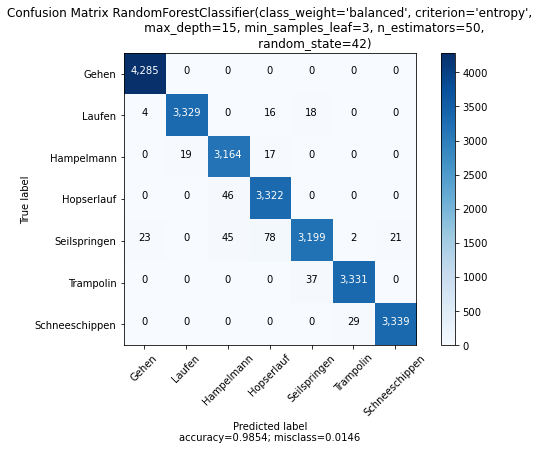

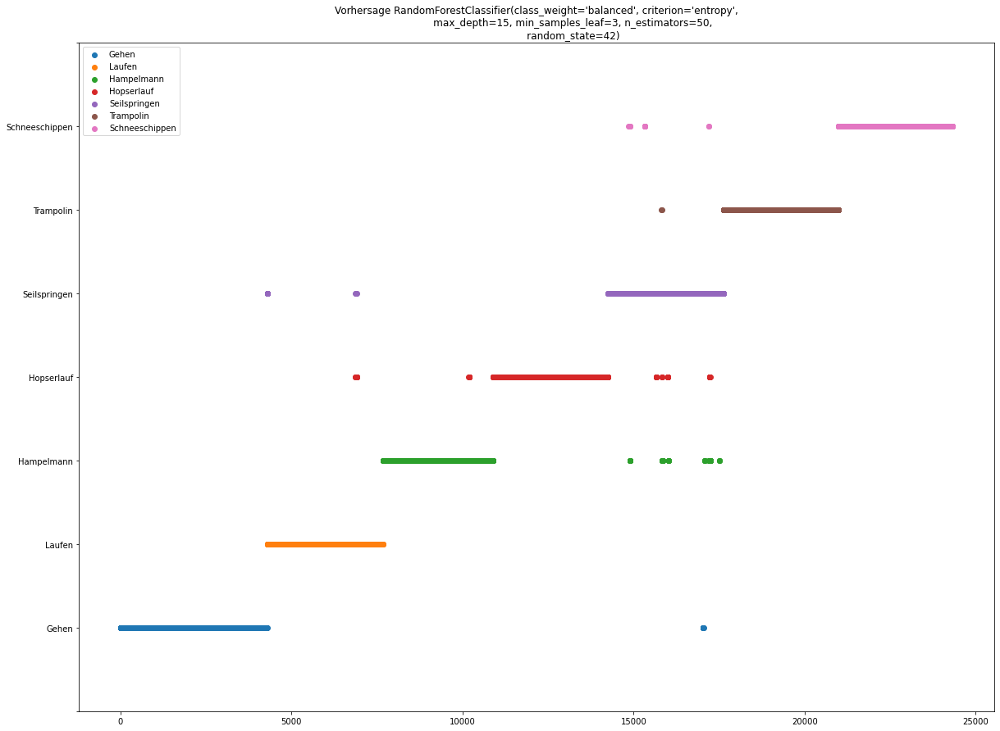

                precision    recall  f1-score   support

         Gehen       0.99      1.00      1.00      4285
        Laufen       0.99      0.99      0.99      3367
    Hampelmann       0.97      0.99      0.98      3200
    Hopserlauf       0.97      0.99      0.98      3368
  Seilspringen       0.98      0.95      0.97      3368
     Trampolin       0.99      0.99      0.99      3368
Schneeschippen       0.99      0.99      0.99      3368

      accuracy                           0.99     24324
     macro avg       0.99      0.98      0.98     24324
  weighted avg       0.99      0.99      0.99     24324

clf:  SVC(cache_size=25000, class_weight='balanced', degree=1, random_state=42)
fitting
done


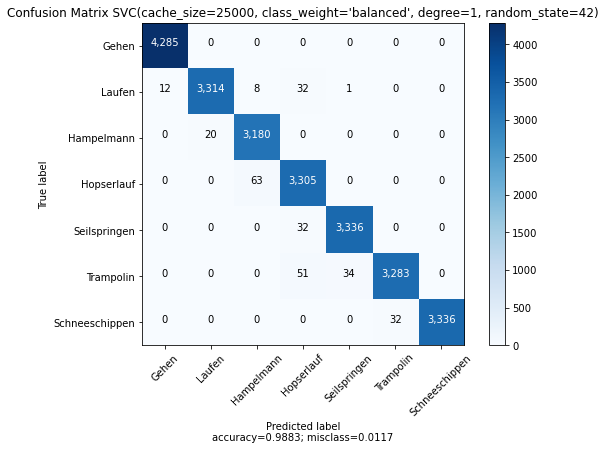

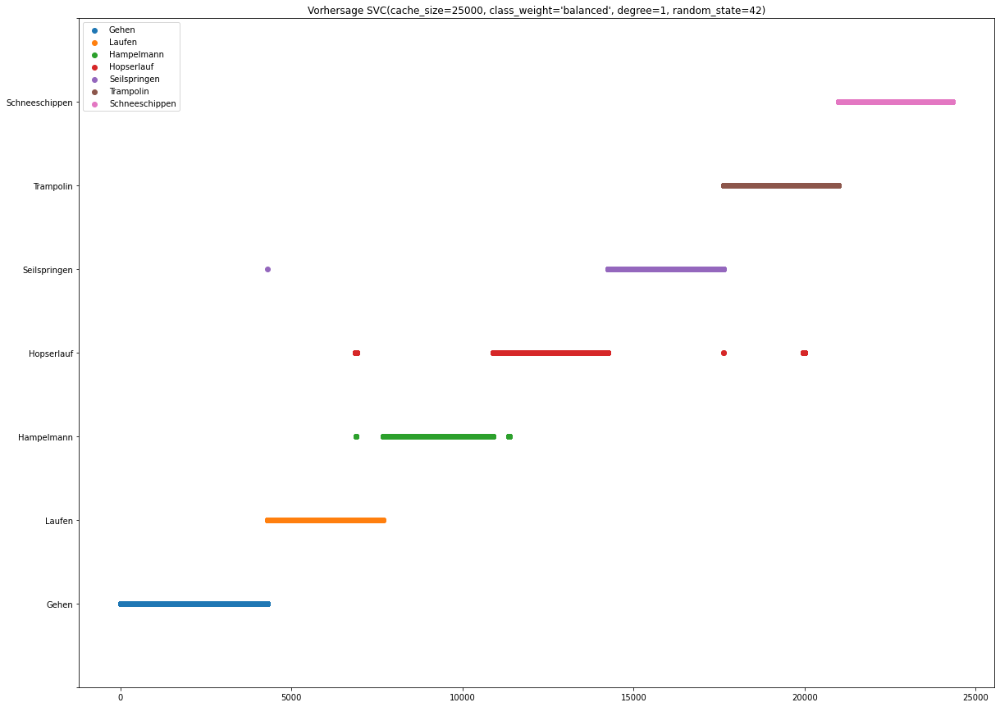

                precision    recall  f1-score   support

         Gehen       1.00      1.00      1.00      4285
        Laufen       0.99      0.98      0.99      3367
    Hampelmann       0.98      0.99      0.99      3200
    Hopserlauf       0.97      0.98      0.97      3368
  Seilspringen       0.99      0.99      0.99      3368
     Trampolin       0.99      0.97      0.98      3368
Schneeschippen       1.00      0.99      1.00      3368

      accuracy                           0.99     24324
     macro avg       0.99      0.99      0.99     24324
  weighted avg       0.99      0.99      0.99     24324

clf:  LogisticRegression(class_weight='balanced', max_iter=250, random_state=42)
fitting


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


done


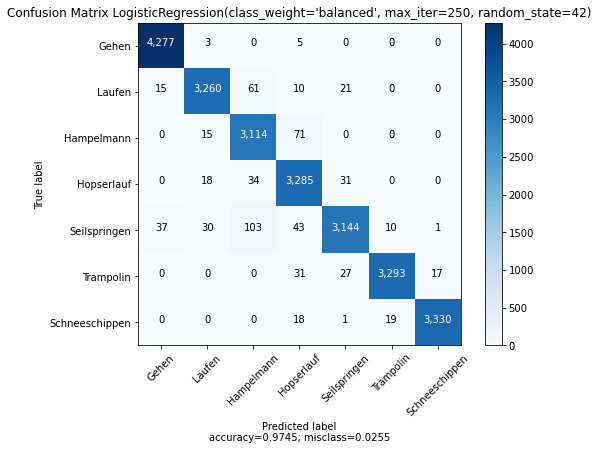

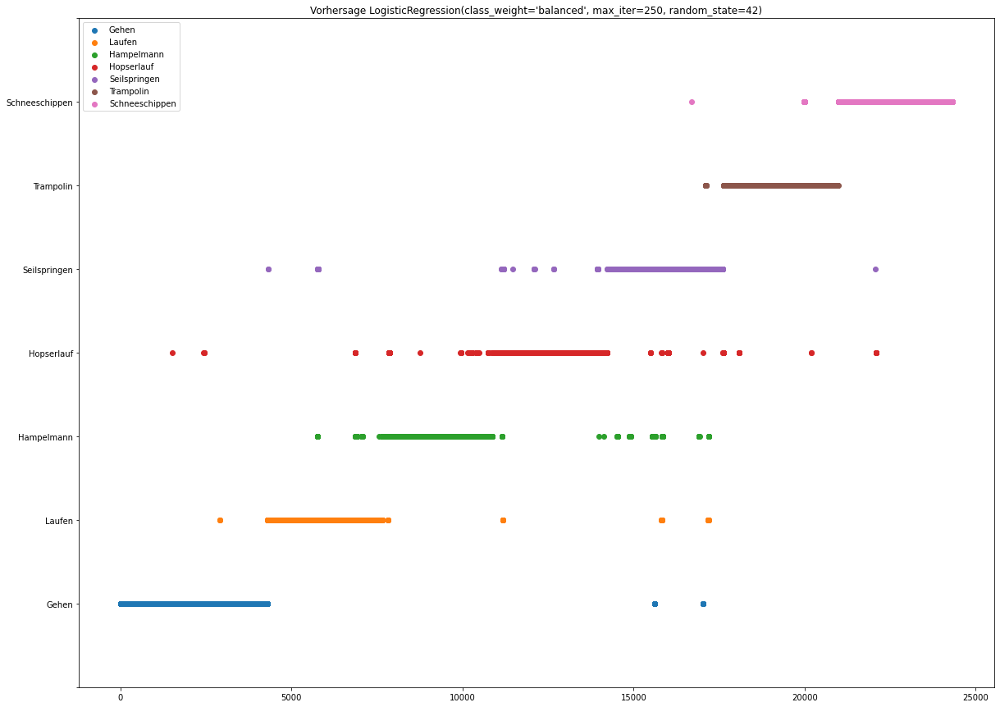

                precision    recall  f1-score   support

         Gehen       0.99      1.00      0.99      4285
        Laufen       0.98      0.97      0.97      3367
    Hampelmann       0.94      0.97      0.96      3200
    Hopserlauf       0.95      0.98      0.96      3368
  Seilspringen       0.98      0.93      0.95      3368
     Trampolin       0.99      0.98      0.98      3368
Schneeschippen       0.99      0.99      0.99      3368

      accuracy                           0.97     24324
     macro avg       0.97      0.97      0.97     24324
  weighted avg       0.97      0.97      0.97     24324



In [126]:
evaluateTest(classifiers, x_train, y_train, x_test, y_test, "unsereTestdaten.png")

### Analyse der Ergebnisse

Wir erreichen mit allen 3 Klassifizierern erfreuliche Ergebnisse:

* RandomForest: Accuracy: 98.6%, F1 (Avg.): 99%
* SVC: Accuracy: 98.8%, F1 (Avg.): 99%
* LR: Accuracy: 97.5%, F1 (Avg.): 97%

Wie bei der Wahl der Klassifizierer als Erwartung beschrieben sind SVC und RandomForest besser als die LR. Auch sie ist dank dem Featureengineering allerdings deutlich besser als auf den Basisdaten. 

Das stützt die Thesen/Empfehlungen aus 

Andreas Wierse und Till Riedel. Smart Data Analytics, Mit Hilfe von Big Data Zusammenhänge erkennen und Potentiale nutzen. Berlin, Boston: De Gruyter
Oldenbourg, 2017. isbn: 978-3-11-046184-8. doi: 10.1515/9783110463958

und 

Pedro Domingos. „A Few Useful Things to Know About Machine Learning“. In: Commun. ACM 55.10 (Okt. 2012), S. 78–87. doi: 10.1145/2347736.2347755

die beide formulieren, wie wichtig das Featureengineering bei MachineLearning-Projekten ist. Domingos sagt sogar, dass das Featureengineering der Faktor ist, der über den Erfolg eines solchen Projekts entscheidet. 

Aufgrund der Erfahrungen bei den Basisdaten werden wir aber auch noch die Klassifizierer auf den Testdaten der anderen Gruppe evaluieren.

Wir können uns beim RandomForest noch die Feature-Importance ansehen. Auch wenn durch die PCA die Feature im Datensatz nicht mehr direkt den ursprünglich engineerten Featuren entsprechen, lässt sich sehen, ob für den Tree nur einige wenige Feature wichtig sind oder nicht:

In [127]:
rndforest.feature_importances_

array([0.20686669, 0.17824423, 0.13285919, 0.09253507, 0.09560088,
       0.01672514, 0.02726884, 0.02948745, 0.05217389, 0.01123934,
       0.020404  , 0.01105289, 0.00662868, 0.00906608, 0.00399024,
       0.0084089 , 0.01029863, 0.01259233, 0.00780955, 0.00459279,
       0.00661334, 0.00518368, 0.00306072, 0.0082795 , 0.00235739,
       0.00517973, 0.00277291, 0.00317416, 0.00284035, 0.00339896,
       0.00600396, 0.00212206, 0.00517032, 0.00262423, 0.00337392])

In [128]:
best_rndforest.feature_importances_

array([0.1970955 , 0.16957845, 0.14964239, 0.10526144, 0.1058437 ,
       0.01836161, 0.0256029 , 0.02872059, 0.05136965, 0.01162166,
       0.01708859, 0.00851538, 0.00574217, 0.00803875, 0.0032896 ,
       0.00679415, 0.01053733, 0.01079441, 0.0053208 , 0.00653791,
       0.00527136, 0.00524302, 0.00249876, 0.00654519, 0.00240116,
       0.00509751, 0.00251948, 0.00296161, 0.00268366, 0.00327854,
       0.0056742 , 0.0017013 , 0.00448126, 0.00186171, 0.00202424])

Wie man sieht hat der RandomForest dennoch einige Feature nur sehr schwach verwendet. Man könnte die Feature also eventuell weiter reduzieren, allerdings steigt dadurch aus unserer Sicht immer mehr das Risiko, dass die Klassifizierung auf Daten einer anderen Person schlechter wird. Die Features die bei uns zu einer eindeutigen Klassifizierung führen können, müssen das nicht auch bei anderen Personen tun, wie wir festgestellt haben. Das Tuning der Hyperparameter hatte keinen signifikanten Einfluss auf die Feature Importance

<a href="#top">Nach oben</a>
<a id="unbekannteDaten"></a>
## Unbekannte Daten (andere Person)

Wir haben mit zwei weiteren Gruppen die Daten getauscht und dann je Gruppe zu einem kombinierten Datensatz vereint um den später verwendeten unbekannten, ungelabelten Datensatz besser zu simulieren. Dadurch ist uns die Reihenfolge der Label bekannt 

### Gruppe 1

In [129]:
targetNames = ["Gehen", "Laufen", "Hampelmann", "Hopserlauf", "Seilspringen", "Trampolin", "Schneeschippen"]

In [130]:
df_unbekannt_gruppe1 = pd.read_csv("data/vergleich/combined.csv", sep=";", decimal=",")

In [131]:
df_unbekannt_gruppe1.head()

,time,gFx,gFy,gFz,ax,ay,az,wx,wy,wz,P
0,0.006,-0.40,0.44,0.92,-0.27,0.52,-0.68,-0.07,0.11,-0.14,0.0
1,0.02,-0.40,0.44,0.92,-0.51,0.48,-0.19,-0.07,0.11,-0.14,0.0
2,0.02,-0.40,0.44,0.92,-0.68,0.44,-0.24,-0.07,0.11,-0.14,0.0
3,0.049,-0.40,0.44,0.92,-0.68,0.44,-0.24,0.14,-0.54,-0.20,0.0
4,0.06,-0.28,0.45,0.70,-0.68,0.44,-0.24,0.14,-0.54,-0.20,0.0


In [132]:
#WINDOW_SIZE = getWindowSize(df_unbekannt_gruppe1, 10000)
print(WINDOW_SIZE)

50


In [133]:
#df_unbekannt_gruppe1[df_unbekannt_gruppe1.time < 0.1]

Label (extrahiert daraus, wo die Zeit <0.1 und wir kennen die Reihenfolge des Datensatzes:  
df_unbekannt.loc[0:10948, "label"] = 0  
df_unbekannt.loc[10949:24975, "label"] = 1  
df_unbekannt.loc[24975:35421, "label"] = 2  
df_unbekannt.loc[35421:50946, "label"] = 3  
df_unbekannt.loc[50946:, "label"] = 4  

In [134]:
df_unbekannt_gruppe1["label"] = -1

In [135]:
df_unbekannt_gruppe1.loc[0:10948, "label"] = 0
df_unbekannt_gruppe1.loc[10949:24975, "label"] = 1
df_unbekannt_gruppe1.loc[24975:35421, "label"] = 2
df_unbekannt_gruppe1.loc[35421:50946, "label"] = 3
df_unbekannt_gruppe1.loc[50946:, "label"] = 4

In [136]:
df_unbekannt_gruppe1["label"].value_counts()

3    15525
1    14026
0    10949
2    10446
4     9981
Name: label, dtype: int64

In [137]:
df_unbekannt_gruppe1.drop(columns="P", inplace=True)

Feature-Generation

In [138]:
dataset_Test_unknown_gruppe1 = generateBestDataset(df_unbekannt_gruppe1)

windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000


In [139]:
dataset_Test_unknown_gruppe1.shape

(60877, 205)

Label abspalten

In [140]:
x_test_unknown_gruppe1 = dataset_Test_unknown_gruppe1[:,:-1].astype("float32")
y_test_unknown_gruppe1 = dataset_Test_unknown_gruppe1[:,-1].astype("int")

In [141]:
x_test_unknown_gruppe1.shape

(60877, 204)

Impute, Standardisieren und mit PCA Dimension reduzieren

In [142]:
x_test_unknown_gruppe1 = impute(x_test_unknown_gruppe1)

In [143]:
x_test_unknown_gruppe1 = StandardScaler().fit_transform(x_test_unknown_gruppe1)

In [144]:
x_test_unknown_gruppe1.shape

(60877, 204)

In [145]:
pca.n_components

35

In [146]:
x_train.shape

(56829, 35)

In [147]:
x_test_unknown_gruppe1.shape

(60877, 204)

In [148]:
x_test_unknown_gruppe1 = pca.transform(x_test_unknown_gruppe1)

In [149]:
variances = []
for i in range(x_test_unknown_gruppe1.shape[-1]):
    print(x_test_unknown_gruppe1[:,i].var())
    variances.append(x_test_unknown_gruppe1[:,i].var())
variances = np.array(variances)

30.215767
4.5598335
9.888603
6.9200296
3.4224145
5.310769
4.5313625
3.6869893
3.1012447
4.458316
3.9967697
1.6981477
2.2898421
1.8198947
2.44998
2.3097978
2.0680954
2.5500233
2.6766393
2.2116501
2.2910228
2.036808
1.6742797
2.279343
2.5376418
1.5293444
1.6964701
1.7073641
2.3710039
1.3825526
2.2826538
2.1737473
2.7601478
1.397056
1.5296614


In [150]:
variances.mean(), np.median(variances), variances.std()

(3.709008, 2.3097978, 4.853398)

Mit unseren Daten waren Mean Median und Standardabweichung der Varianzen nach der PCA:

(5.1849976, 2.3765078, 10.291882)

Während der Median also ähnlich ist, ist, die Varianz bei unseren Daten nach der Featuregenerierung durchaus höher, ebenso die Standardabweichung

In [151]:
x_train.shape

(56829, 35)

clf:  RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, min_samples_leaf=3, n_estimators=50,
                       random_state=42)
fitting
done


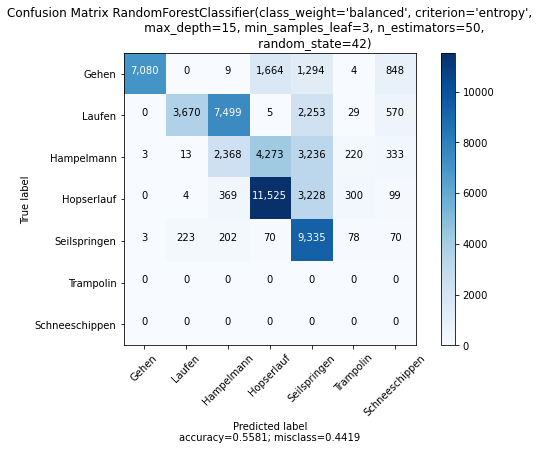

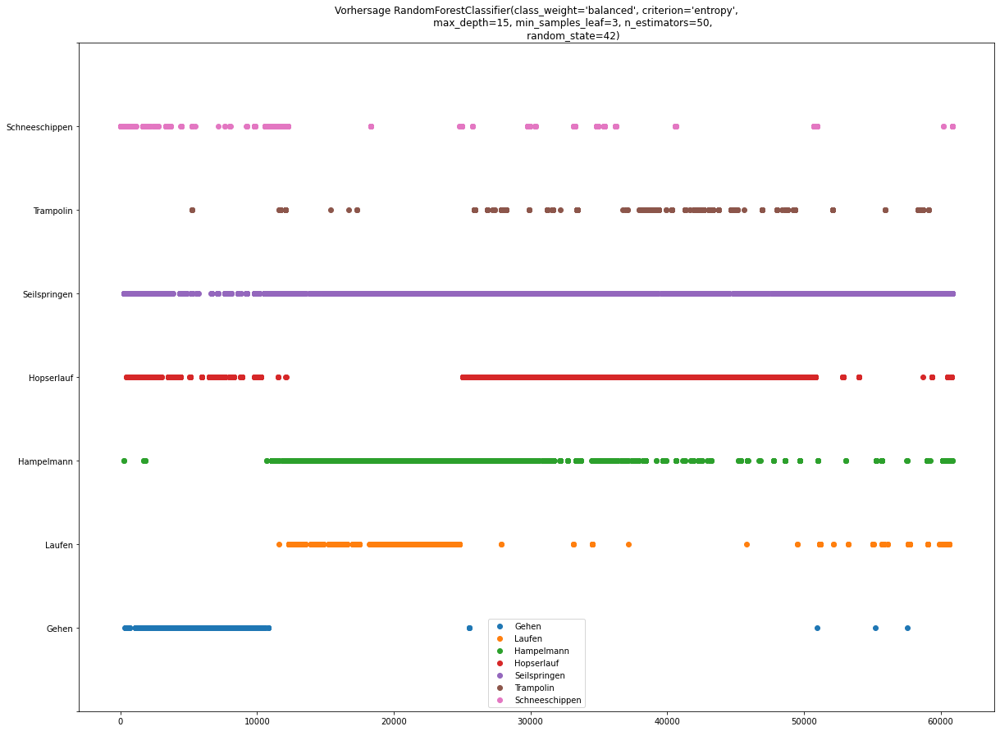

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       1.00      0.65      0.79     10899
        Laufen       0.94      0.26      0.41     14026
    Hampelmann       0.23      0.23      0.23     10446
    Hopserlauf       0.66      0.74      0.70     15525
  Seilspringen       0.48      0.94      0.64      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.56     60877
     macro avg       0.47      0.40      0.39     60877
  weighted avg       0.68      0.56      0.56     60877

clf:  SVC(cache_size=25000, class_weight='balanced', degree=1, random_state=42)
fitting
done


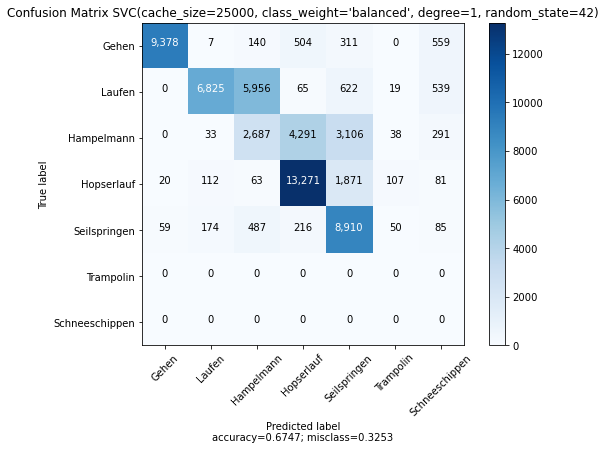

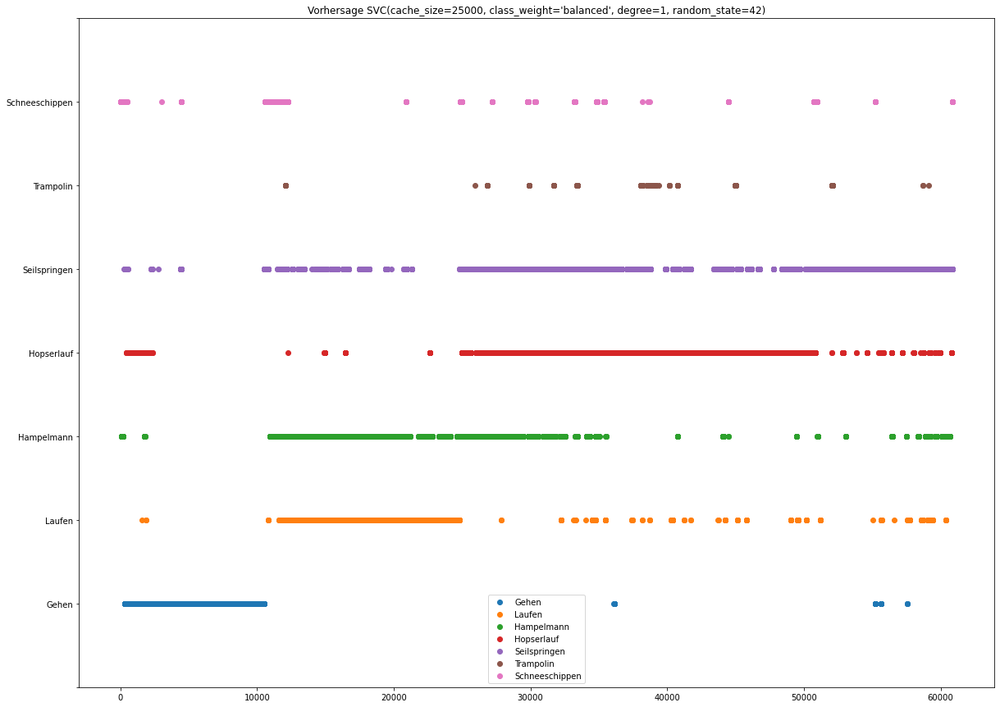

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       0.99      0.86      0.92     10899
        Laufen       0.95      0.49      0.64     14026
    Hampelmann       0.29      0.26      0.27     10446
    Hopserlauf       0.72      0.85      0.78     15525
  Seilspringen       0.60      0.89      0.72      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.67     60877
     macro avg       0.51      0.48      0.48     60877
  weighted avg       0.73      0.67      0.68     60877

clf:  LogisticRegression(class_weight='balanced', max_iter=250, random_state=42)
fitting


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


done


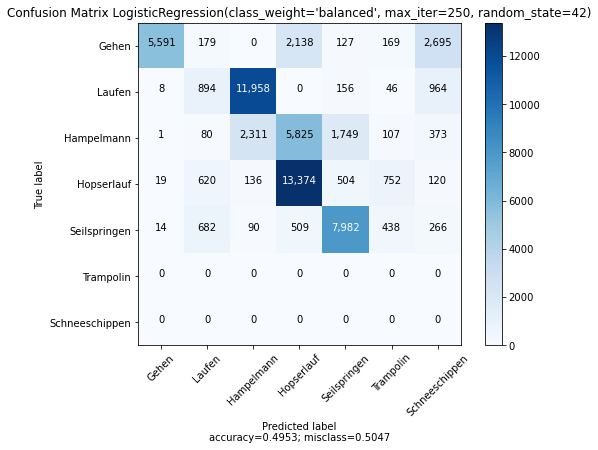

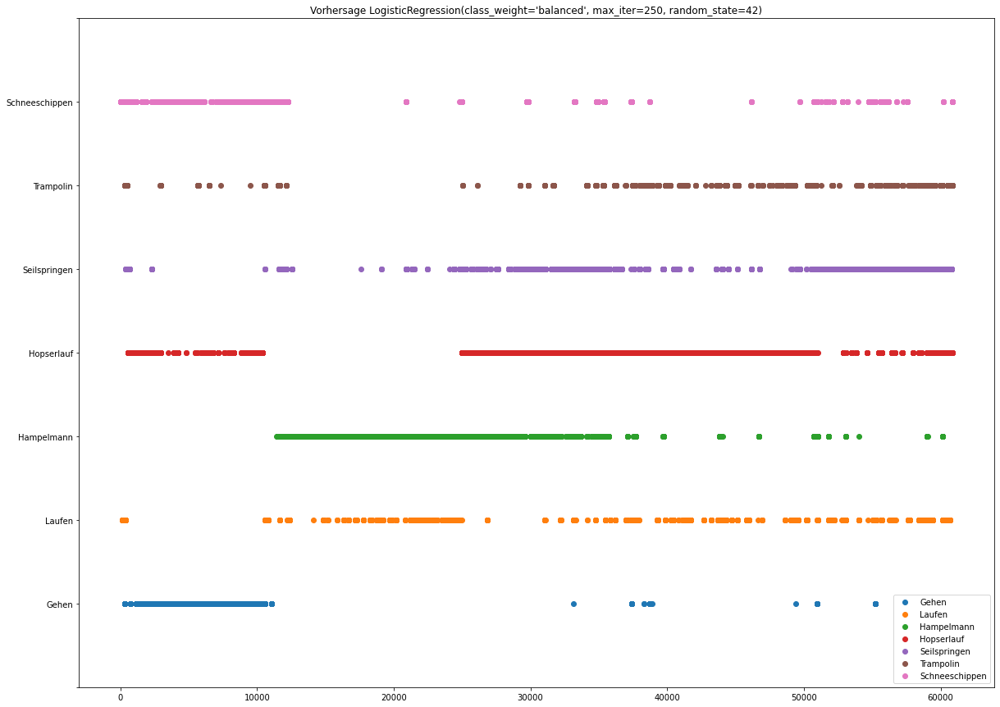

                precision    recall  f1-score   support

         Gehen       0.99      0.51      0.68     10899
        Laufen       0.36      0.06      0.11     14026
    Hampelmann       0.16      0.22      0.19     10446
    Hopserlauf       0.61      0.86      0.72     15525
  Seilspringen       0.76      0.80      0.78      9981
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.50     60877
     macro avg       0.41      0.35      0.35     60877
  weighted avg       0.57      0.50      0.49     60877



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [152]:
evaluateTest(classifiers, x_train, y_train, x_test_unknown_gruppe1, y_test_unknown_gruppe1, "grp1.png")

### Analyse der Ergebnisse Gruppe 1

Wir erreichen mit allen 3 Klassifizierern deutlich schlechtere Ergebnisse als auf unseren Daten:

* RandomForest: Accuracy: 58.8%, F1 (Macro-Avg.): 0.41, (Weighted-Avg.) 0.59
* SVC: Accuracy: 67.2%, F1 (Macro-Avg.): 0.48, (Weighted-Avg.) 0.68
* LR:  Accuracy: 48.7%, F1 (Macro-Avg.): 0.35, (Weighted-Avg.) 0.48


Die SVM performt am besten, auch da sind aber Accuracy und F1 weit weg von den Ergebnissen auf unseren Daten. 

Die SVM klassifiziert sowohl Hampelmann als auch den Hopserlauf öfters fälschlich als Seilspringen. Der Hampelmann ist allgemein ein Problem, er wird öfter als Hopserlauf und als Seilspringen erkannt als tatsächlich als Hampelmann, der Recall liegt nur bei 0.28, der F1-Score bei 0.27. Der höchste F1-Scores wird beim Gehen erreicht, was logisch erscheint. Schließlich unterscheidet sich die Gehbewegung zwischen verschiedenen Menschen gefühlt geringfügiger. 

Der RandomForest klassifiziert insgesamt oft fälschlich als Seilspringen (Precision 0.49, Recall 0.94), die LogisticRegression interessanterweise nicht (Precision 0.6, Recall 0.89). 

Die LR hat dafür mit dem Gehen deutlich mehr Probleme als die anderen Klassifizierer ( Precision 0.99 Recall 0.49 F1 0.65 ) und predicted dafür Schneeschippen und Hopserlauf. Der größte Fehler ist bei LR erkennbar beim Laufen, das wurde nahezu vollständig dem Hampelmann zugeordnet.

Der F1-Score für Hampelmann ist bei allen Klassifizieren sehr schlecht (grob 0.2) 

<a href="#top">Nach oben</a>
### Gruppe 2

### Ab hier gleiches Prinzip wie für Gruppe 1 nur mit nochmals anderen Daten

In [153]:
df_unbekannt_gruppe2 = pd.read_csv("data/vergleich/gruppe2/combined_gruppe2.csv", sep=";", decimal=",")

In [154]:
# df_unbekannt_gruppe2[df_unbekannt_gruppe2.time < 0.1]

In [155]:
df_unbekannt_gruppe2["label"] = -1

In [156]:
#WINDOW_SIZE = getWindowSize(df_unbekannt_gruppe2, 10000)
print(WINDOW_SIZE)

50


In [157]:
df_unbekannt_gruppe2.loc[0:17351, "label"] = 0
df_unbekannt_gruppe2.loc[17351:34064, "label"] = 1
df_unbekannt_gruppe2.loc[34064:45613, "label"] = 2
df_unbekannt_gruppe2.loc[45613:62791, "label"] = 3
df_unbekannt_gruppe2.loc[62791:, "label"] = 4

In [158]:
df_unbekannt_gruppe2["label"].value_counts()

0    17351
3    17178
1    16713
2    11549
4    11400
Name: label, dtype: int64

In [159]:
df_unbekannt_gruppe2.drop(columns="P", inplace=True)

In [160]:
dataset_Test_unknown_2 = generateBestDataset(df_unbekannt_gruppe2)

windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000
at index  65000
at index  70000


In [161]:
dataset_Test_unknown_2.shape

(74141, 205)

In [162]:
x_test_unknown = dataset_Test_unknown_2[:,:-1].astype("float32")
y_test_unknown = dataset_Test_unknown_2[:,-1].astype("int")

In [163]:
x_test_unknown.shape

(74141, 204)

In [164]:
x_test_unknown = impute(x_test_unknown)

In [165]:
x_test_unknown = StandardScaler().fit_transform(x_test_unknown)

In [166]:
x_test_unknown.shape

(74141, 204)

In [167]:
pca.n_components

35

In [168]:
x_test_unknown = pca.transform(x_test_unknown)

In [169]:
variances = []
for i in range(x_test_unknown.shape[-1]):
    print(x_test_unknown[:,i].var())
    variances.append(x_test_unknown[:,i].var())
variances = np.array(variances)

35.744022
5.32865
7.0573034
6.7274766
4.265313
6.4708023
5.36941
4.03363
3.3185716
2.851241
3.8356986
2.1918974
2.186774
1.5399916
2.2840552
1.844684
2.512179
3.3060455
2.0795708
2.0718305
2.103742
1.8176534
1.6032954
1.309
3.1953325
1.6823088
1.1992406
1.8157824
1.7835277
1.4494666
2.2235305
1.9962797
2.4425797
1.6764425
1.192506


In [180]:
variances.mean(), np.median(variances), variances.std()

(3.7859955, 2.1918974, 5.7048035)

clf:  RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, min_samples_leaf=3, n_estimators=50,
                       random_state=42)
fitting
done


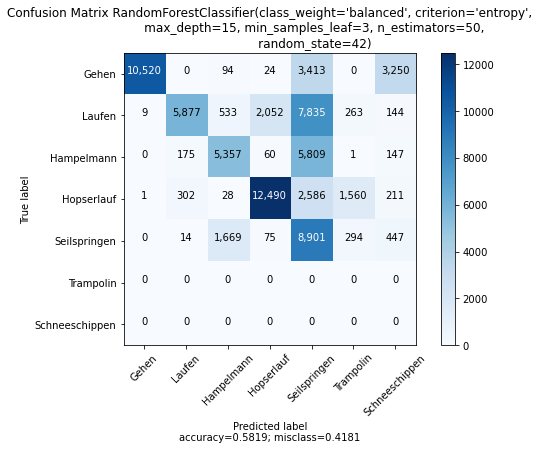

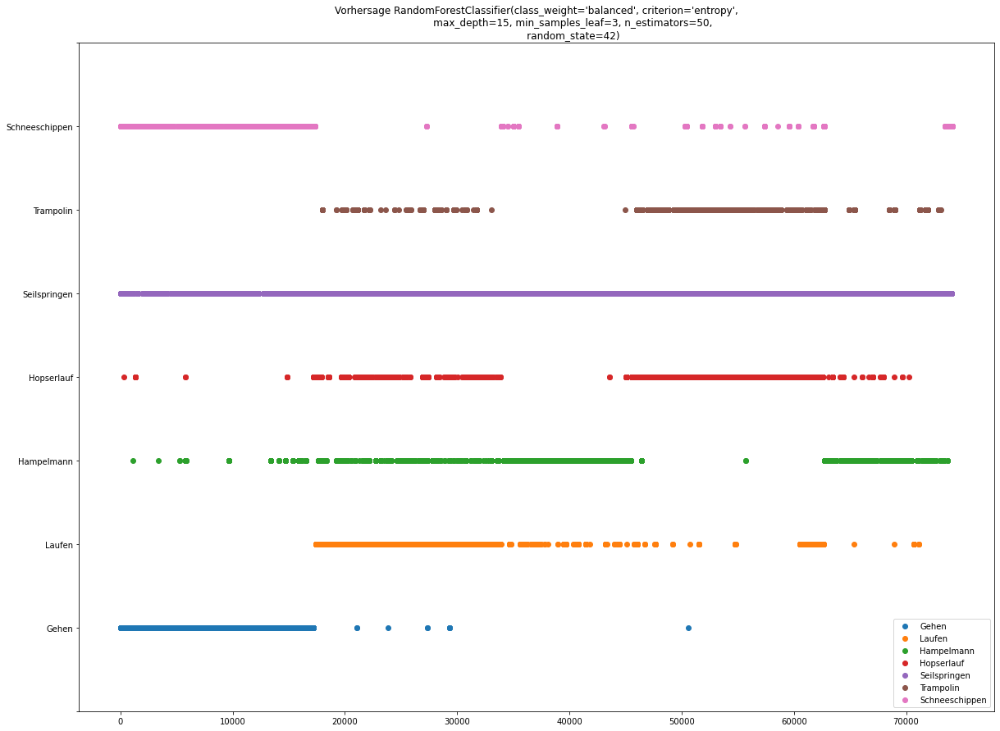

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       1.00      0.61      0.76     17301
        Laufen       0.92      0.35      0.51     16713
    Hampelmann       0.70      0.46      0.56     11549
    Hopserlauf       0.85      0.73      0.78     17178
  Seilspringen       0.31      0.78      0.45     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.58     74141
     macro avg       0.54      0.42      0.44     74141
  weighted avg       0.79      0.58      0.63     74141

clf:  SVC(cache_size=25000, class_weight='balanced', degree=1, random_state=42)
fitting
done


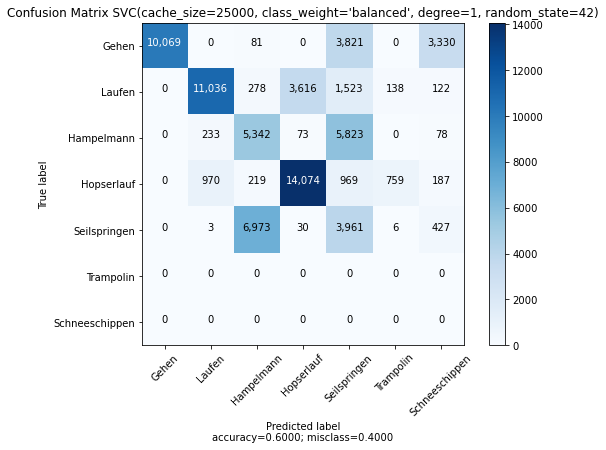

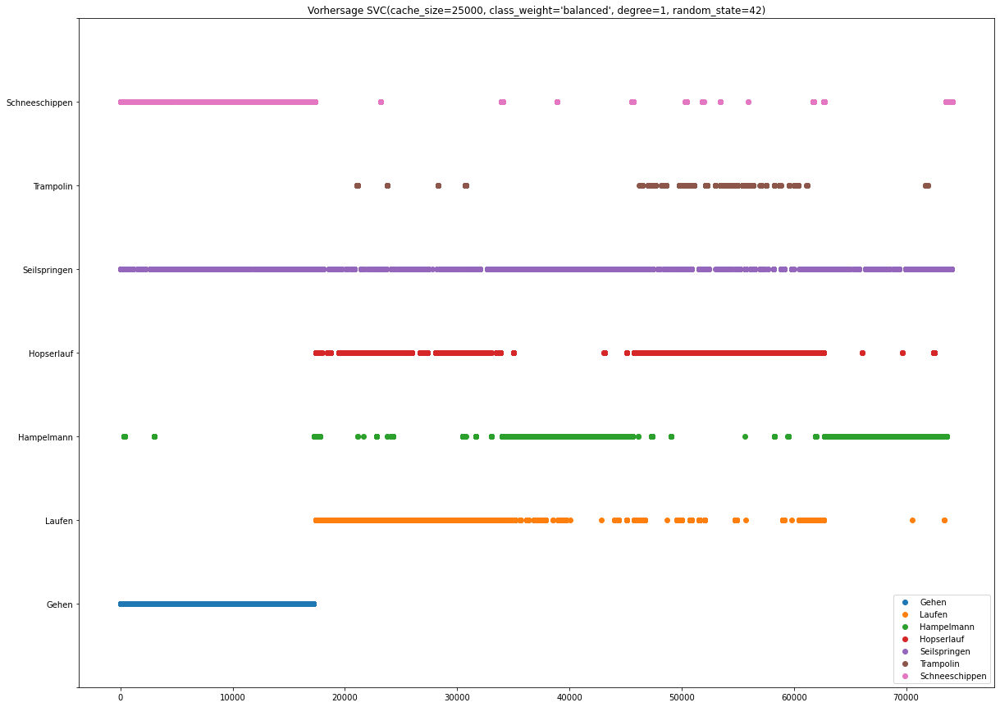

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                precision    recall  f1-score   support

         Gehen       1.00      0.58      0.74     17301
        Laufen       0.90      0.66      0.76     16713
    Hampelmann       0.41      0.46      0.44     11549
    Hopserlauf       0.79      0.82      0.80     17178
  Seilspringen       0.25      0.35      0.29     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.60     74141
     macro avg       0.48      0.41      0.43     74141
  weighted avg       0.72      0.60      0.64     74141

clf:  LogisticRegression(class_weight='balanced', max_iter=250, random_state=42)
fitting


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


done


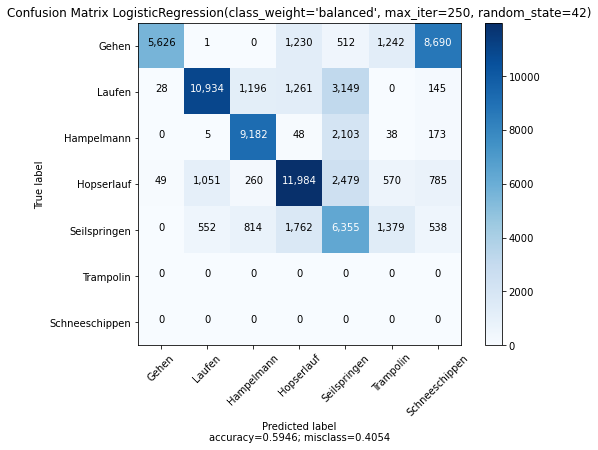

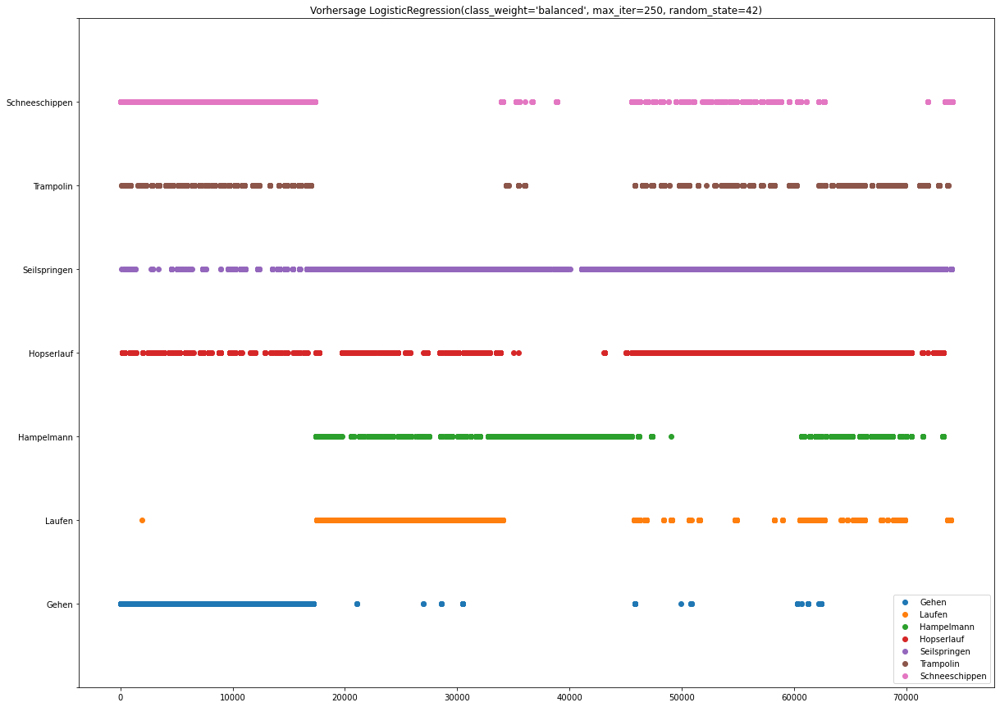

                precision    recall  f1-score   support

         Gehen       0.99      0.33      0.49     17301
        Laufen       0.87      0.65      0.75     16713
    Hampelmann       0.80      0.80      0.80     11549
    Hopserlauf       0.74      0.70      0.72     17178
  Seilspringen       0.44      0.56      0.49     11400
     Trampolin       0.00      0.00      0.00         0
Schneeschippen       0.00      0.00      0.00         0

      accuracy                           0.59     74141
     macro avg       0.55      0.43      0.46     74141
  weighted avg       0.79      0.59      0.65     74141



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [171]:
evaluateTest(classifiers, x_train, y_train, x_test_unknown, y_test_unknown, fileName="grp2.png")

Bei der LogisticRegression können wir uns die Koeffizienten anschauen

### Analyse der Ergebnisse Gruppe 2

Wir erreichen erneut mit allen 3 Klassifizierern deutlich schlechtere Ergebnisse als auf unseren Daten:
**TODO AKTUALISIEREN**
* RandomForest: Accuracy: 58.9%, F1 (Macro-Avg.): 0.41, (Weighted-Avg.) 0.59
* SVC: Accuracy: 59.6%, F1 (Macro-Avg.): 0.48, (Weighted-Avg.) 0.68
* LR:  Accuracy: 59.3%, F1 (Macro-Avg.): 0.35, (Weighted-Avg.) 0.48


Grundsätzlich zeigt sich ein ähnliches Bild wie bei Gruppe 1. Allerdings wird hier noch öfter das Gehen als Schneeschippen klassifiziert, was aufgrund der ähnlichen Bewegungen aber durchaus nachvollziehbar ist. Würde man alleine diese Klassifikation korrigieren und alle Schneeräumen-Klassifikationen als Gehen werten, wäre erstaunlicherweise sogar die LR der Klassifizierer mit der höchsten Accuracy.   
Ansonsten liegen hier alle drei nah beieinander. 
Erneut werden Bewegungen oft fälschlich als Seilspringen erkannt, bei Gruppe 1 passierte dies etwas seltener.
Auch der Hampelmann macht erneut Probleme und wird von der SVC zur Hälfte als Seilspringen klassifiziert. Andersrum wird dafür das Seilspringen oft als Hampelmann predicted. Hier liegt also offensichtlich eine starke Ähnlichkeit der Bewegungen innerhalb unserer und der Vergleichsgruppe vor. 

Insgesamt legen die Ergebnisse aus den letzten Vergleichen auch nahe, dass unsere Daten zum Seilspringen eventuell nicht besonders gut sind. Tatsächlich kam es bei der Aufnahme immer wieder zum Hängenbleiben im Seil, was zu den Problemen beitragen könnte.

In [172]:
classifiers[2].coef_

array([[-1.46253154,  0.33295029,  1.86258537, -0.71126893,  2.26596966,
        -0.23169069,  0.06027297, -0.12574809, -0.00524345,  0.42386357,
         0.37086862,  1.15946921,  0.27111068, -1.29058495, -0.419242  ,
        -0.09395195, -1.1417753 , -0.81015847, -1.10627867, -0.09823955,
         0.14955379,  0.31470812,  0.09782566, -0.41185645,  0.18574044,
        -0.11743478, -0.24788112,  0.20763057, -0.15135696,  0.07681728,
         0.31713131, -0.69550934, -0.10463465,  0.13691305,  0.82782396],
       [-0.08816279, -0.50885459, -2.07349223, -1.08108804,  3.02166477,
         0.99746947,  1.80472769,  0.64662842, -0.01506664,  0.61573373,
        -0.44793328, -0.49538128, -0.37903332,  1.02732138,  0.70392073,
         1.12242425,  0.1066096 , -0.48796522,  0.01658593, -1.62106865,
         0.6268706 ,  0.68030263,  0.81117996, -1.58897585,  0.56801974,
         0.22489755, -2.34910536,  1.04170021,  1.23041495, -1.12106735,
         1.4901436 , -0.82043966,  0.64406875,  0.

In [173]:
classifiers[2].intercept_

array([-2.90621407,  1.51847177, -4.68359084,  9.02469769,  9.35518762,
       -4.61377099, -7.69478118])

Außerdem erlaubt die LR nicht nur das Vorhersagen der Klasse, sondern man kann sich auch gleichzeitig die Wahrscheinlichkeit dafür anzeigen lassen

In [174]:
probaX_train = classifiers[2].predict_proba(x_train)

In [175]:
np.argmax(probaX_train[:,:], axis=1)

array([0, 0, 0, ..., 6, 6, 6])

In [176]:
probaX_train[:100, 0]

array([0.99881134, 0.99900428, 0.99949843, 0.99994194, 0.99996818,
       0.99998303, 0.9999931 , 0.99999514, 0.99999514, 0.9999932 ,
       0.99999764, 0.99999746, 0.99999672, 0.99999861, 0.99999927,
       0.99999933, 0.9999993 , 0.99999925, 0.99999898, 0.99999881,
       0.99999862, 0.99999878, 0.99999717, 0.99999735, 0.99999657,
       0.99999438, 0.99999165, 0.99999415, 0.99997524, 0.99984688,
       0.99984005, 0.99990354, 0.99973471, 0.99940463, 0.99884183,
       0.99868531, 0.99798492, 0.99661092, 0.99295887, 0.98985967,
       0.98222499, 0.98001045, 0.96448963, 0.97781032, 0.98685121,
       0.98474857, 0.98330347, 0.98421665, 0.98641052, 0.9899622 ,
       0.99104874, 0.99249733, 0.99392139, 0.99527159, 0.99594415,
       0.99623877, 0.99667075, 0.99799814, 0.99851888, 0.99944441,
       0.99974458, 0.99987987, 0.99985915, 0.99990927, 0.99994985,
       0.99996174, 0.99995425, 0.99995789, 0.99997611, 0.9999836 ,
       0.99998401, 0.99999635, 0.99999598, 0.99999605, 0.99999

In [177]:
probaX_train[:100, 1]

array([1.18866174e-03, 9.95717946e-04, 5.01567644e-04, 5.80537776e-05,
       3.18201892e-05, 1.69638484e-05, 6.89447058e-06, 4.85652472e-06,
       4.84995017e-06, 6.79145668e-06, 2.35688526e-06, 2.53257407e-06,
       3.27285344e-06, 1.37561536e-06, 7.25695588e-07, 6.68022394e-07,
       6.99306543e-07, 7.49199111e-07, 1.01993353e-06, 1.18660760e-06,
       1.37765373e-06, 1.21886737e-06, 2.82326406e-06, 2.64591120e-06,
       3.40760155e-06, 5.59798296e-06, 8.32841813e-06, 5.82414179e-06,
       2.45401512e-05, 1.49946631e-04, 1.55626191e-04, 8.98242721e-05,
       2.49443009e-04, 5.85087745e-04, 1.14829630e-03, 1.30341565e-03,
       1.98954669e-03, 3.36414107e-03, 7.02238764e-03, 1.01337032e-02,
       1.77574171e-02, 1.99730055e-02, 3.55058605e-02, 2.21893816e-02,
       1.31486035e-02, 1.52512645e-02, 1.66963840e-02, 1.57832124e-02,
       1.35893551e-02, 1.00376705e-02, 8.95114114e-03, 7.50257348e-03,
       6.07852118e-03, 4.72832844e-03, 4.05576891e-03, 3.76115366e-03,
      

In [178]:
probaX_train[12000:12100, 1]

array([0.99999821, 0.99999761, 0.99999782, 0.99999641, 0.99999605,
       0.99999557, 0.99999641, 0.99999674, 0.99999859, 0.99999818,
       0.99999828, 0.99999672, 0.99999509, 0.99998445, 0.99998448,
       0.99997463, 0.99997813, 0.9999892 , 0.99998155, 0.99996417,
       0.99997411, 0.99997239, 0.99995602, 0.9999738 , 0.99998848,
       0.99998885, 0.99998114, 0.99998112, 0.99998158, 0.99999071,
       0.99996913, 0.99998235, 0.9999687 , 0.99998803, 0.99995192,
       0.99998468, 0.99993568, 0.99997045, 0.99998484, 0.99995507,
       0.99994278, 0.99997066, 0.99998837, 0.99999219, 0.99999407,
       0.99999675, 0.9999892 , 0.99998038, 0.99997291, 0.99998004,
       0.99990202, 0.9998215 , 0.9999384 , 0.99997979, 0.99999016,
       0.9999944 , 0.99999496, 0.99999782, 0.99999518, 0.99999645,
       0.99999313, 0.99998549, 0.9999822 , 0.99998925, 0.99999343,
       0.99999688, 0.9999968 , 0.99999742, 0.99999651, 0.99999864,
       0.99999772, 0.99999936, 0.99999915, 0.99999907, 0.99999

Dieser kurze Überblick zeigt, dass sich die LR auf den Trainingsdaten auch sehr "sicher" ist bei ihren Entscheidungen, die Wahrscheinlichkeit ist sehr hoch

In [181]:
probaX_test_unknown = classifiers[2].predict_proba(x_test_unknown)

In [192]:
probaX_test_unknown[:100, 0]

array([1.43508687e-19, 3.90962821e-20, 6.51609161e-20, 1.07782718e-18,
       2.84498148e-18, 3.45056629e-18, 6.80223644e-18, 7.18646286e-18,
       8.99905489e-18, 1.32888137e-17, 2.06693755e-17, 8.15086477e-17,
       1.33619720e-16, 1.87995348e-16, 3.49460174e-16, 1.30398369e-15,
       2.87767927e-15, 2.64132392e-15, 7.05110623e-15, 1.65517198e-14,
       3.49615033e-14, 5.95621601e-14, 3.98916839e-13, 6.94202361e-13,
       4.28624715e-13, 2.93749640e-12, 1.51975889e-10, 2.78968123e-10,
       8.18234249e-10, 1.35116492e-09, 1.55747640e-09, 3.75111878e-09,
       6.62201025e-09, 1.48577413e-08, 2.19295207e-08, 1.25184943e-07,
       6.46259645e-07, 3.96900856e-06, 2.00136108e-05, 5.34165293e-05,
       1.48520537e-04, 4.04117887e-04, 1.36771510e-03, 4.26556632e-03,
       8.68585443e-03, 6.33428416e-03, 2.60509069e-03, 7.78688814e-03,
       2.72820181e-02, 3.57305645e-02, 1.08094140e-01, 2.21080426e-01,
       3.00139065e-01, 3.92694335e-01, 5.15452967e-01, 6.17570691e-01,
      

In [190]:
probaX_test_unknown[:100, 6]

array([9.99420820e-01, 9.99717363e-01, 9.99652060e-01, 9.99624913e-01,
       9.99393366e-01, 9.98962412e-01, 9.97454274e-01, 9.97765182e-01,
       9.97675304e-01, 9.97631779e-01, 9.96970179e-01, 9.93957464e-01,
       9.91453309e-01, 9.91087807e-01, 9.88521203e-01, 9.88787782e-01,
       9.83359276e-01, 9.56735130e-01, 9.68842481e-01, 9.59679693e-01,
       9.42977071e-01, 9.41710196e-01, 9.34006222e-01, 9.55959475e-01,
       9.76845621e-01, 9.82541293e-01, 9.78446093e-01, 9.85390947e-01,
       9.79432692e-01, 9.96203961e-01, 9.98029568e-01, 9.98380112e-01,
       9.98829630e-01, 9.98996387e-01, 9.98825815e-01, 9.98805365e-01,
       9.97803822e-01, 9.96589890e-01, 9.96619733e-01, 9.94996202e-01,
       9.94642552e-01, 9.93727046e-01, 9.86516109e-01, 9.73546806e-01,
       9.26734442e-01, 9.57784549e-01, 9.85838079e-01, 9.64436410e-01,
       8.74189918e-01, 9.08529570e-01, 5.61880382e-01, 5.37840221e-01,
       4.67598200e-01, 4.03635414e-01, 1.81800069e-01, 9.43361602e-02,
      

Hier sieht man direkt dass die Ergebnisse schlechter sind und einige der Datenpunkte zu Schneeschippen (Label 6) zugeordnet werden - und zwar mit 99,9% Wahrscheinlichkeit - und nicht wie es richtig wäre zu Gehen (0). Genauso sieht man einige Datenpunkte bei denen die Wahrscheinlichkeiten nicht bei 99% liegen:

In [194]:
probaX_test_unknown[4*23:4*23+4, 0]

array([0.39118428, 0.4841657 , 0.61254302, 0.79567125])

Den ersten hätte er mit 39% richtig (zu Gehen) zu geordnet, mit 56% Wahrscheinlichkeit allerdings zu Label 5, also dem Trampolingspringen

In [202]:
np.argmax(probaX_test_unknown[4*23,:]), probaX_test_unknown[4*23,np.argmax(probaX_test_unknown[4*23,:])]

(5, 0.5666285983403199)

Diese Analysen der Wahrscheinlichkeiten könnte man noch viel weiter treiben, allerdings entscheiden wir uns aufgrund der insgesamt besten Vorhersageergebnisse für den **SVC** für unbekannte Daten

## Vorbereitung für unbekannte, ungelabelte Daten

In [12]:
df_unlabeled = pd.read_csv("data/demo.csv", sep=",", decimal=".")

### vorübergehend setzen wir einfach selbst die time spalte, da der temporär verwendete Datensatz aus Einzelstücken zussammengefügt ist

In [11]:
#new_time = np.arange(0, len(df_unlabeled), 1)
#df_unlabeled.time = new_time

Da unsere Funktion zum generieren eines Datensatzes eine Spalte label erwartet, umgehen wir das Problem und setzen ein fixes label

In [13]:
df_unlabeled["label"] = -1

In [14]:
dataset_unlabeled = generateBestDataset(df_unlabeled)

windowsize:  50
at index  5000


/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


at index  10000
at index  15000


In [30]:
clf = best_svc if best_svc != None else SVC(C=1.0, kernel="rbf",class_weight="balanced", random_state=RND_STATE,cache_size=25e3)

NameError: name 'best_svc' is not defined

In [15]:
clf = SVC(C=1.0, kernel="rbf",class_weight="balanced", random_state=RND_STATE,cache_size=25e3)

In [16]:
with open("PCAFittedTrain.pkl", "rb") as f:
    pca = pickle.load(f)

In [17]:
with open("combined_train_test.pkl", "rb") as f:
    x_train, y_train, x_test, y_test = pickle.load(f)

In [18]:
x_train.shape, x_test.shape

((56829, 35), (24324, 35))

In [19]:
concated_x = np.concatenate([x_train, x_test])
concated_y = np.concatenate([y_train, y_test])

In [20]:
clf.fit(concated_x, concated_y)

SVC(cache_size=25000.0, class_weight='balanced', random_state=42)

In [21]:
clf.score(concated_x, concated_y)

0.9989895629243528

In [22]:
dataset_unlabeled.shape

(18870, 205)

In [23]:
dataset_unlabeled_x = dataset_unlabeled[:,:-1]

In [24]:
scaler = StandardScaler()

In [25]:
dataset_unlabeled_x = scaler.fit_transform(dataset_unlabeled_x)

In [32]:
dataset_unlabeled_x = pca.transform(impute(dataset_unlabeled_x))

In [33]:
y_hat_unlabeled = clf.predict(dataset_unlabeled_x)

In [34]:
y_hat_unlabeled.shape

(18870,)

In [35]:
df_unlabeled.shape

(18920, 33)

Wir verlieren 50 (--> WindowSize) Zeitwerte am Anfang, die nehmen wir aus der Zeit weg:

In [36]:
xAxis = df_unlabeled.time[:-50]

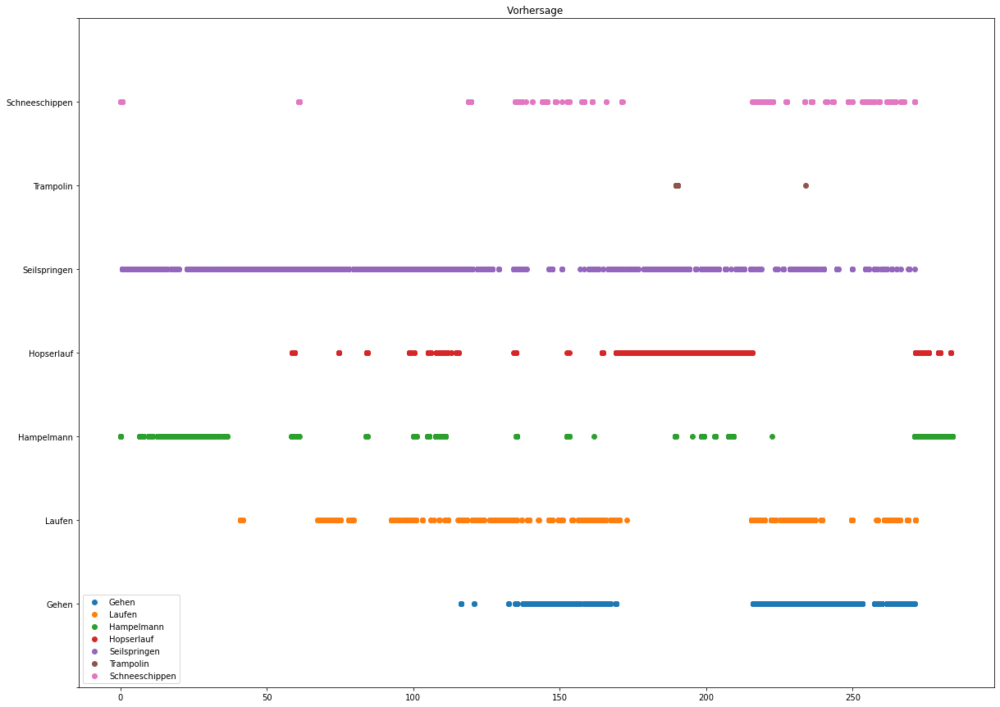

In [39]:
plotPrediction(y_hat_unlabeled, targetNames=targetNames, fileName=None, xAxis=xAxis)

In [77]:
printTextInterpretation(y_hat=y_hat_unlabeled, timeIndex=xAxis, targetNames=targetNames)

----------------------------------------------------------------------------------------------------
start:  0.023
end:  0.21100000000000002
label: Hampelmann
----------------------------------------------------------------------------------------------------
start:  0.212
end:  0.66
label: Schneeschippen
----------------------------------------------------------------------------------------------------
start:  0.6759999999999999
end:  6.611000000000001
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  6.667999999999999
end:  7.872999999999999
label: Hampelmann
----------------------------------------------------------------------------------------------------
start:  7.934
end:  9.706
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  9.708
end:  9.708
label: Hampelmann
------------------------------------------------------------

label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  115.205
end:  115.205
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  115.206
end:  115.206
label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  115.266
end:  115.32700000000001
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  115.329
end:  115.329
label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  115.33
end:  115.33
label: Laufen
----------------------------------------------------------------------------------------------------
start:  115.366
end:  115.39
label: Hopserlauf
--------------------------------------------------------------------------------

end:  210.55700000000002
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  210.55900000000003
end:  211.50599999999997
label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  211.507
end:  211.80700000000002
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  211.813
end:  212.766
label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  212.769
end:  212.829
label: Seilspringen
----------------------------------------------------------------------------------------------------
start:  212.886
end:  212.886
label: Hopserlauf
----------------------------------------------------------------------------------------------------
start:  212.888
end:  212.888
label: Seilspringen
----------------------

In [85]:
df_unlabeled.iloc[110:130]

,time,gFx,gFy,gFz,ax,ay,az,wx,wy,wz,...,z_ratio_a_w,gFx_lagged,gFy_lagged,gFz_lagged,ax_lagged,ay_lagged,az_lagged,wx_lagged,wy_lagged,wz_lagged
110,1.924,-2.00,0.63,0.40,-3.36,-9.78,-5.15,-2.71,1.83,-1.02,...,5.049020,-1.06,-0.36,-0.24,-4.42,-10.64,-5.56,0.61,-0.63,0.47
111,1.942,-2.00,0.63,0.40,-3.36,-9.78,-5.15,-2.71,1.83,-1.02,...,5.049020,-1.06,-0.36,-0.24,-4.42,-10.64,-5.56,-0.80,0.66,-0.03
112,1.984,-1.39,1.13,0.50,-3.36,-9.78,-5.15,-2.71,1.83,-1.02,...,5.049020,-1.06,-0.36,-0.24,-3.36,-9.78,-5.15,-0.80,0.66,-0.03
113,1.985,-1.39,1.13,0.50,-11.78,0.92,1.38,-2.71,1.83,-1.02,...,-1.352941,-1.06,-0.36,-0.24,-3.36,-9.78,-5.15,-2.71,1.83,-1.02
114,1.986,-1.39,1.13,0.50,-11.78,0.92,1.38,-2.15,2.69,-1.24,...,-1.112903,-2.00,0.63,0.40,-3.36,-9.78,-5.15,-2.71,1.83,-1.02
115,2.047,-0.79,0.91,0.77,-11.78,0.92,1.38,-2.15,2.69,-1.24,...,-1.112903,-2.00,0.63,0.40,-3.36,-9.78,-5.15,-2.71,1.83,-1.02
116,2.049,-0.79,0.91,0.77,0.96,4.72,5.74,-2.15,2.69,-1.24,...,-4.629032,-1.39,1.13,0.50,-3.36,-9.78,-5.15,-2.71,1.83,-1.02
117,2.050,-0.79,0.91,0.77,0.96,4.72,5.74,-2.13,2.80,-1.88,...,-3.053191,-1.39,1.13,0.50,-11.78,0.92,1.38,-2.71,1.83,-1.02
118,2.052,-0.79,0.91,0.77,0.96,4.72,5.74,-2.13,2.80,-1.88,...,-3.053191,-1.39,1.13,0.50,-11.78,0.92,1.38,-2.15,2.69,-1.24
119,2.111,-0.30,0.96,0.68,0.96,4.72,5.74,-2.13,2.80,-1.88,...,-3.053191,-0.79,0.91,0.77,-11.78,0.92,1.38,-2.15,2.69,-1.24


2 sekunden sind 120 werte

In [86]:
df_pred = pd.DataFrame()

In [87]:
df_pred["y_hat"] = y_hat_unlabeled
df_pred["time"] = xAxis

In [ ]:
from scipy.stats import mode

In [165]:
rollingPrediction = df_pred['y_hat'].rolling(window=120).apply(lambda x: mode(x)[0])

In [166]:
rollingPrediction.shape

(18870,)

In [167]:
rollingPrediction.dropna(inplace=True)

In [168]:
rollingPrediction.shape

(18751,)

In [169]:
rollingPrediction[0:2]

119    4.0
120    4.0
Name: y_hat, dtype: float64

In [170]:
rollingPrediction = rollingPrediction.astype("int")

In [171]:
rollingPrediction[:2]

119    4
120    4
Name: y_hat, dtype: int64

In [172]:
xAxisRolling = xAxis[len(xAxis)-rollingPrediction.shape[0]:]

In [173]:
xAxisRolling.shape, rollingPrediction.shape

((18751,), (18751,))

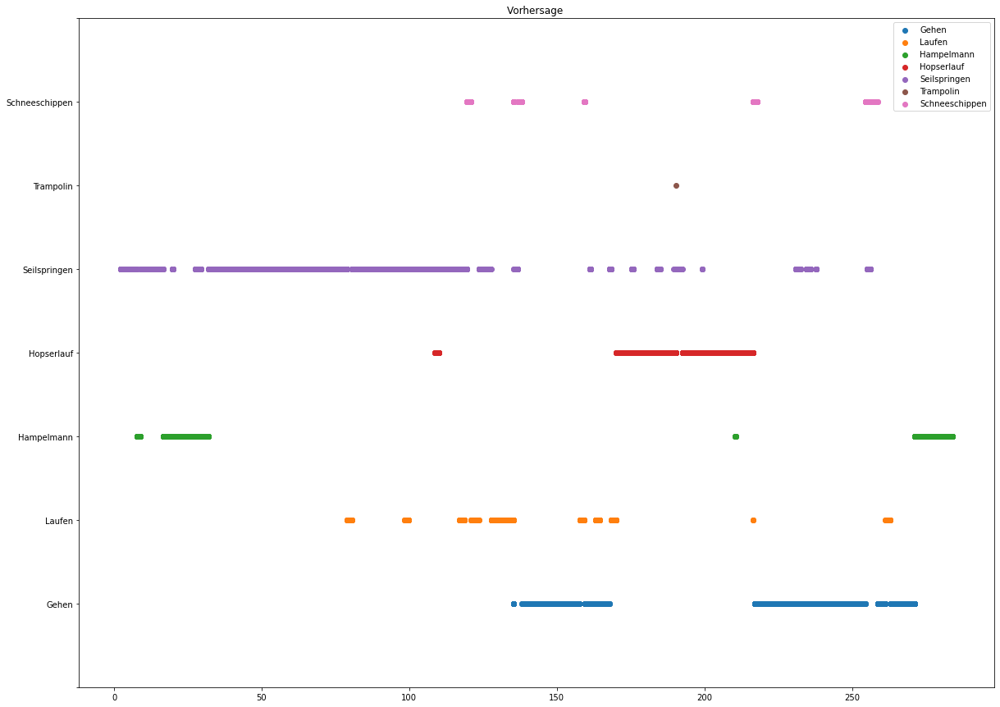

In [174]:
plotPrediction(rollingPrediction, targetNames=targetNames, fileName=None, xAxis=xAxisRolling)

<a href="#top">Nach oben</a>
# Aufgabe 3

<a id="3_preamble"></a>
## Achtung

Obwohl wir den random_state setzen, führte das Clustering bei uns nicht immer zu den gleichen Ergebnissen/Clusterzuordnungen. 
Vermutlich liegt das am Noise, den wir zu den Daten hinzufügen, der ja zufällig ist.


Daher wurden die Resultate als Markdown festgehalten und das mapping wird dynamisch vorgenommen. Die Resultate in den Markdowns müssen also nicht mit den prints übereinstimmen

<a href="#top">Nach oben</a>
<a id="3_cluster_sel"></a>
## Festlegen der Clusteranzahl

In [203]:
with open("combined_train_test.pkl", "rb") as f:
    x_train, y_train, x_test, y_test = pickle.load(f)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((56829, 35), (56829,), (24324, 35), (24324,))

In [204]:
unique, counts = np.unique(y_train, return_counts=True)
print(unique, counts)

[0 1 2 3 4 5 6] [10065  7859  7468  7859  7860  7859  7859]


In [205]:
n_clusters = len(unique)
n_clusters

7

In [206]:
km = KMeans(n_clusters=n_clusters, random_state=RND_STATE)

Da wir train und Test sowie X und y gesplittet geladen haben, fügen wir diese zunächst als DataFrame zusammen.

In [207]:
df_train = pd.DataFrame(x_train)
df_train["label"] = y_train

df_test = pd.DataFrame(x_test)
df_test["label"] = y_test

print(df_train.shape, df_test.shape)

(56829, 36) (24324, 36)


In [208]:
df_combined = df_train.append(df_test)
print(df_combined.shape)

(81153, 36)


Fitten auf alles außer die letzte Spalte, da dort das Label ist.

In [209]:
km.fit(df_combined.iloc[:,:-1])

KMeans(n_clusters=7, random_state=42)

In [210]:
y_hat = km.labels_

Überlick über die Label und deren Anzahl

In [211]:
unique, counts = np.unique(y_hat, return_counts=True)
print(unique, counts)

[0 1 2 3 4 5 6] [11805 14734   149 10154 20420 11261 12630]


Man sieht dass das Cluster 6 sehr selten vorkommt, hier wurde offensichtlich keine eigene Bewegung erkannt. Später wird man das genauer erkennen

In [212]:
df_combined["y_hat"] = y_hat

In [213]:
df_combined.head()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,label,y_hat
0,-8.805964,-2.449367,1.412809,-1.356696,2.290128,-1.787086,-0.156678,0.195944,0.277213,-1.891690,...,1.245255,0.009697,-2.840934,2.016853,-1.304388,1.117609,-1.011421,0.459339,0,1
1,-8.805941,-2.470840,1.431074,-1.384646,2.304119,-1.797294,-0.148354,0.216198,0.256595,-1.968193,...,1.196583,0.028103,-2.824690,2.038763,-1.304781,1.014423,-0.928129,0.493341,0,1
2,-8.747646,-2.583464,1.378303,-1.474172,2.174652,-1.783460,-0.212314,0.293317,0.269910,-2.046309,...,0.873008,-0.077684,-2.780121,1.867223,-1.464780,0.717381,-0.847044,0.290514,0,1
3,-8.760036,-2.776101,1.614600,-1.615328,2.417119,-1.888856,-0.062897,0.300414,0.178957,-2.171789,...,0.618986,-0.134822,-2.468670,1.467304,-1.413954,0.356423,-1.012932,0.257094,0,1
4,-8.764566,-2.782054,1.673488,-1.638842,2.407680,-1.840083,0.006463,0.344249,0.147671,-2.188597,...,0.522994,-0.149481,-2.485482,1.485986,-1.442570,0.258191,-0.948280,0.253974,0,1


In [214]:
np.unique(y_hat)

array([0, 1, 2, 3, 4, 5, 6], dtype=int32)

In [215]:
np.where(y_hat == 0)

(array([24315, 24531, 24532, ..., 74080, 74081, 74082]),)

In [216]:
np.where(df_combined.label==0)

(array([    0,     1,     2, ..., 61111, 61112, 61113]),)

In [217]:
np.where(y_hat==1)

(array([    0,     1,     2, ..., 74286, 74287, 77918]),)

<a href="#top">Nach oben</a>
<a id="3_groundTruth"></a>
## Ground truth: Label <--> Aktivität

Label 0 = Gehen  
Label 1 = Laufen  
Label 2 = Hampelmann  
Label 3 = Hopserlauf  
Label 4 = Seilspringen  
Label 5 = Trampolin  
Label 6 = Schneeräumen

<a href="#top">Nach oben</a>
<a id="3_labelexcemption"></a>
## Auswertung Label --> Cluster

In [218]:
label_0_pred=df_combined[df_combined.label == 0]["y_hat"].to_numpy()
label_1_pred=df_combined[df_combined.label == 1]["y_hat"].to_numpy()
label_2_pred=df_combined[df_combined.label == 2]["y_hat"].to_numpy()
label_3_pred=df_combined[df_combined.label == 3]["y_hat"].to_numpy()
label_4_pred=df_combined[df_combined.label == 4]["y_hat"].to_numpy()
label_5_pred=df_combined[df_combined.label == 5]["y_hat"].to_numpy()
label_6_pred=df_combined[df_combined.label == 6]["y_hat"].to_numpy()

In [219]:
label_predictions = [label_0_pred, label_1_pred, label_2_pred, label_3_pred, label_4_pred,label_5_pred,label_6_pred]

In [220]:
for idx, pred in enumerate(label_predictions):
    print("label: ", idx, "  ")
    unique, counts = np.unique(label_predictions[idx], return_counts=True)
    print("unique: ", unique, "  ")
    print("counts: ", counts, "  ")
    print("\n\n")

label:  0   
unique:  [1]   
counts:  [14350]   



label:  1   
unique:  [1 4 6]   
counts:  [   27 11189    10]   



label:  2   
unique:  [0 2 3 4 6]   
counts:  [   17   149 10081   162   259]   



label:  3   
unique:  [0 1 3 4 6]   
counts:  [11027    47    71    64    18]   



label:  4   
unique:  [0 1 3 4 5 6]   
counts:  [ 738  309    2 8973   22 1184]   



label:  5   
unique:  [0 4 5]   
counts:  [   23    32 11172]   



label:  6   
unique:  [1 5 6]   
counts:  [    1    67 11159]   





label:  0   
unique:  [5]   
counts:  [14350]   

Das Label 0 der Daten wird offensichtlich von KMeans als cluster 5 predicted. Das Label ist "rein".  

label:  1   
unique:  [1 3 5]   
counts:  [   10 11189    27]   

Das Label 1 der Daten wird überwiegend Cluster 3 zugeordnet. Auch hier ist das Ergebnis noch sehr eindeutig/rein.


label:  2   
unique:  [0 1 3 4 6]   
counts:  [   17   259   162 10081   149]   

Label 2 wird meistens dem Cluster 4 zugeordnet.

label:  3   
unique:  [0 1 3 4 5]   
counts:  [11027    20    62    71    47]   

Label 3 wird am Häufigsten dem Cluster 0 zugeordnet. 

label:  4   
unique:  [0 1 2 3 4 5]   
counts:  [ 737 1181   22 8977    2  309]   

Label 4 fiel am schlechtesten aus. Es wird meistens zu Cluster 3, oft zu 1 und ab und zu zu 0 zugeordnet. Auch hier bereitet uns das Seilspringen Probleme.

label:  5   
unique:  [0 2 3]   
counts:  [   23 11172    32]   

Label 5 wird eindeutig Cluster 2 zugeordnet.

label:  6   
unique:  [1 2 5]   
counts:  [11059    67     1]   

label 6 zu cluster 1


<a href="#top">Nach oben</a>
<a id="3_clusterexcemption"></a>
## Auswertung Cluster --> Label

In [221]:
pred_0_label=df_combined[df_combined.y_hat == 0]["label"].to_numpy()
pred_1_label=df_combined[df_combined.y_hat == 1]["label"].to_numpy()
pred_2_label=df_combined[df_combined.y_hat == 2]["label"].to_numpy()
pred_3_label=df_combined[df_combined.y_hat == 3]["label"].to_numpy()
pred_4_label=df_combined[df_combined.y_hat == 4]["label"].to_numpy()
pred_5_label=df_combined[df_combined.y_hat == 5]["label"].to_numpy()
pred_6_label=df_combined[df_combined.y_hat == 6]["label"].to_numpy()

In [222]:
predictions_to_label = [pred_0_label, pred_1_label, pred_2_label, pred_3_label, pred_4_label,pred_5_label,pred_6_label]

In [223]:
mappingDict = {} # cluster --> label

In [224]:
for idx, label in enumerate(predictions_to_label):
    print("cluster: ", idx, "  ")
    unique, counts = np.unique(predictions_to_label[idx], return_counts=True)
    print("unique: ", unique, "  ")
    print("counts: ", counts, "  ")
    mostCommonLabel = unique[np.argmax(counts)]
    print("mostCommonLabel: ", mostCommonLabel)
    mappingDict[idx] = mostCommonLabel
    print("\n\n")

cluster:  0   
unique:  [2 3 4 5]   
counts:  [   17 11027   738    23]   
mostCommonLabel:  3



cluster:  1   
unique:  [0 1 3 4 6]   
counts:  [14350    27    47   309     1]   
mostCommonLabel:  0



cluster:  2   
unique:  [2]   
counts:  [149]   
mostCommonLabel:  2



cluster:  3   
unique:  [2 3 4]   
counts:  [10081    71     2]   
mostCommonLabel:  2



cluster:  4   
unique:  [1 2 3 4 5]   
counts:  [11189   162    64  8973    32]   
mostCommonLabel:  1



cluster:  5   
unique:  [4 5 6]   
counts:  [   22 11172    67]   
mostCommonLabel:  5



cluster:  6   
unique:  [1 2 3 4 6]   
counts:  [   10   259    18  1184 11159]   
mostCommonLabel:  6





cluster:  0   
unique:  [2 3 4 5]   
counts:  [   17 11027   737    23]   

Cluster 0 entspricht meist  dem Label 3 also dem Hopserlauf

cluster:  1   
unique:  [1 2 3 4 6]   
counts:  [   10   259    20  1181 11059]   

Cluster 1 wird  Label 6 zugeordnet, also dem Schneeräumen.  

cluster:  2   
unique:  [4 5 6]   
counts:  [   22 11172    67]   

Cluster 2 wird  meistens Label 5 zugeordnet, also dem Trampolinspringen.

cluster:  3   
unique:  [1 2 3 4 5]   
counts:  [11189   162    62  8977    32]   

Cluster 3 wird meistens Label 1 und 4 zugeordnet, also dem Laufen und Seilspringen.  

cluster:  4   
unique:  [2 3 4]   
counts:  [10081    71     2]   

Cluster 4 wird meistens Label 2 zugeordnet, also dem Hampelmann.  

cluster:  5   
unique:  [0 1 3 4 6]   
counts:  [14350    27    47   309     1]   


Cluster 5 wird meistens Label 0 zugeordnet, also dem Gehen. 

cluster:  6   
unique:  [2]   
counts:  [149]   

Cluster 6 wird Label 2 zugeordnet, also dem Hampelmann, allerdings finden sich hier sehr wenige Datenpunkte. 

In [225]:
mappingDict # cluster zu label

{0: 3, 1: 0, 2: 2, 3: 2, 4: 1, 5: 5, 6: 6}

<a href="#top">Nach oben</a>
<a id="3_results"></a>
## Zwischenergebnis

Das Clustering würde sich generell nicht als erste Wahl für eine Klassifikation anbieten.
Zunächst erzielten wir Scores zwischen 0.4 und 0.6 (sowohl accuracy als auch weitere Metriken), das Featureengineering, durch das die Klassifizierung auf unbekannten Daten besser wurde, hat auch hier zu besseren Ergebnissen geführt. Die Accuracy beträgt inzwischen 85%

Wenn Bewegungen mehreren Clustern zugeordnet werden, liegt unserer Auffassung nach hauptsächlich daran, dass die Bewegungsabläufe an sich nicht "rein" sind und es auch dort Überschneidungen gibt. Diese werden durch das Clustering deutlich. 

Cluster 6 enthält nur Daten vom Hampelmann, die aber zum größten Teil schon in Cluster 4 enthalten sind. Hier geht es also vielleicht um einige Datenpunkte, die die Hampelmann Bewegung nicht gut darstellen. Im Plot unten sieht man, dass die Daten sich trennen lassen, obwohl sie dem gleichen Label angehören. Mit solchen Informationen könnte man das Clustering als Klassifikationstool verbessern. 
Es ist dann nötig, die Clusteranzahl anders als die Label-Anzahl zu wählen und die Cluster anschließend wieder zusammenzuführen.
Genauso kann das Clustering nicht gut zwischen Laufen und Seilspringen unterscheiden.

Eine weitere Möglichkeit das Clustering  für eine Klassifikation zu nutzen: das Cluster als weiteres Feature in den Klassifizierer geben. Eventuell sollte man dann aber nicht versuchen die Gesamtbewegung zu klassifizieren, sondern Bewegungsmuster/-abläufe (siehe oben)

<a href="#top">Nach oben</a>
<a id="3_clustermetrrics"></a>
## Metriken zur Clustering-Güte

#### Mapping Cluster zu Label
Cluster 0 = Label 3  
Cluster 1 = Label 6  
Cluster 2 = Label 5  
Cluster 3 = Label 1 und Label 4, häufiger 1  
Cluster 4 = Label 2  
Cluster 5 = Label 0  
Cluster 6 = Label 2  

Zünachst verteilen wir die label nach dem, das am häufigsten vorkommt:

In [226]:
df_results = pd.DataFrame()
df_results["label"] = df_combined.label
df_results["cluster"] = df_combined.y_hat
df_results.head()

,label,cluster
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


In [227]:
df_results["mapping_mostCommon"] = 0

In [228]:
for cluster, label in mappingDict.items():
    df_results.loc[df_results["cluster"] == cluster,"mapping_mostCommon"] = label

In [229]:
df_results.head()

,label,cluster,mapping_mostCommon
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0


In [230]:
df_results.tail()

,label,cluster,mapping_mostCommon
24319,6,6,6
24320,6,6,6
24321,6,6,6
24322,6,6,6
24323,6,6,6


In [231]:
mappingDict

{0: 3, 1: 0, 2: 2, 3: 2, 4: 1, 5: 5, 6: 6}

Die accuracy ergibt sich dann als Quotient aus den Zeilen, in denen das mapping mit dem label übereinstimmt mit der Gesamtlänge:

In [232]:
len(df_results[df_results.label == df_results.mapping_mostCommon]) / len(df_results)

0.85181077717398

Die accuracy entspricht also knapp 85 %

Betrachten wir noch einige weitere Scores:

In [233]:
from sklearn.metrics import homogeneity_completeness_v_measure

Homogenität: das Cluster enthält nur die Label einer Klasse  
Vollständigkeit: das Cluster enthält alle Label einer Klasse  
V-Wert: harmonisches mittel zwischen Homogenität und Vollständigkeit  

Jeweils: Höherer Wert == Besseres Ergebnis, Wertebereich [0.0, 1.

In [234]:
print(homogeneity_completeness_v_measure(labels_true=df_results.label,labels_pred=df_results.mapping_mostCommon))


(0.8290174120464701, 0.9128755743109924, 0.8689279445556358)


In [235]:
print(homogeneity_completeness_v_measure(labels_true=df_results.label,labels_pred=km.labels_))


(0.8290241862041807, 0.907938747837196, 0.8666888242660034)


Wir sehen dass das zuordnen zu "mostCommon" die Metriken nicht sehr stark beeinflusst und wir durch die optimierte Featuregenerierung durchaus akzeptable Ergebnisse erzielen können.

In [236]:
def plot3dScatter(df, x, y, z, color, filename=None, dontPlot=False):

    fig = px.scatter_3d(df, x=x, y=y, z=z,
                  color=color,  symbol=color,  opacity=0.5)

    # xaxis.backgroundcolor is used to set background color
    fig.update_layout(scene = dict(
                        xaxis = dict(
                             backgroundcolor="rgb(200, 200, 230)",
                             gridcolor="white",
                             showbackground=True,
                             showspikes=False,
                             zerolinecolor="white",),
                        yaxis = dict(
                            backgroundcolor="rgb(230, 200,230)",
                            gridcolor="white",
                            showbackground=True,
                            showspikes=False,
                            zerolinecolor="white"),
                        zaxis = dict(
                            backgroundcolor="rgb(230, 230,200)",
                            gridcolor="white",
                            showbackground=True,
                            zerolinecolor="white",),),
                        width=700,
                        margin=dict(
                        r=10, l=10,
                        b=10, t=10),
                      )
    fig.update_coloraxes(showscale=False)
    if not dontPlot:
        fig.show()
    if filename:
        fig.write_html(filename)

In [237]:
df_combined.head()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,label,y_hat
0,-8.805964,-2.449367,1.412809,-1.356696,2.290128,-1.787086,-0.156678,0.195944,0.277213,-1.891690,...,1.245255,0.009697,-2.840934,2.016853,-1.304388,1.117609,-1.011421,0.459339,0,1
1,-8.805941,-2.470840,1.431074,-1.384646,2.304119,-1.797294,-0.148354,0.216198,0.256595,-1.968193,...,1.196583,0.028103,-2.824690,2.038763,-1.304781,1.014423,-0.928129,0.493341,0,1
2,-8.747646,-2.583464,1.378303,-1.474172,2.174652,-1.783460,-0.212314,0.293317,0.269910,-2.046309,...,0.873008,-0.077684,-2.780121,1.867223,-1.464780,0.717381,-0.847044,0.290514,0,1
3,-8.760036,-2.776101,1.614600,-1.615328,2.417119,-1.888856,-0.062897,0.300414,0.178957,-2.171789,...,0.618986,-0.134822,-2.468670,1.467304,-1.413954,0.356423,-1.012932,0.257094,0,1
4,-8.764566,-2.782054,1.673488,-1.638842,2.407680,-1.840083,0.006463,0.344249,0.147671,-2.188597,...,0.522994,-0.149481,-2.485482,1.485986,-1.442570,0.258191,-0.948280,0.253974,0,1


In [238]:
pca_3d = PCA(n_components=3)
pca_3d.fit(df_combined.iloc[:,:-2])
x_3d = pca_3d.transform(df_combined.iloc[:,:-2])

In [239]:
df_vis = pd.DataFrame(x_3d)
df_vis["cluster"] = km.labels_

In [240]:
df_vis

,0,1,2,cluster
0,-8.945464,2.497682,-0.866654,1
1,-8.946238,2.520398,-0.879204,1
2,-8.894929,2.617702,-0.938699,1
3,-8.919067,2.805939,-1.028146,1
4,-8.923427,2.812800,-1.046308,1
...,...,...,...,...
81148,-8.772436,2.206633,1.603880,6
81149,-8.733093,2.226449,1.560645,6
81150,-8.716103,2.261851,1.523265,6
81151,-8.691607,2.206892,1.551660,6


<a href="#top">Nach oben</a>
<a id="3_3dPlot"></a>
## Visualisierung der Cluster
**Alleine dieser Plot vergrößert das Notebook um 17 MB, daher auch als Datei gespeichert**

In [241]:
plot3dScatter(df_vis, x=0, y=1, z=2, color="cluster", filename="3d_kmeans.html", dontPlot=False)

<a href="#top">Nach oben</a>
<a href="3_interpretation"></a>
## Interpretation des 3d Plots

Man sieht, dass die Daten relativ gut separierbar sind was auch wegen den Scores zu erwarten war. Dadurch, dass der Plot interaktiv ist, lässt sich auch einfach z.B. ein paarweiser Vergleich durchführen.

Dabei ist dann zu erkennen, dass Beispielsweise Cluster 3 (=Label 3 = Hopserlauf) und Cluster 0(=Label 5=Trampolin) sehr gut trennbar sind, auch Cluster 1 und 6, die dem gleichen Label (Hampelmann) zugeordnet wurden, sind schön trennbar. Daher macht es Sinn, dass sie unterschiedlichen Clustern angehören, aber dem gleichen Label.

Cluster 2 und 4 dagegen lassen sich anscheinend nicht so gut unterscheiden, aber auch das lässt sich erklären: Cluster 2 wurde dem Label 0 (Gehen) zugeordnet und Cluster 4 dem Label 6 (Schneeräumen). Hier war also erwartbar, dass die Label aufgrund ihrer ähnlichen Bewegungsabläufe auch zu ähnlichen Ergebnissen führen sollten.

<a href="#top">Nach oben</a>
<a id="3_clusteringAAF"></a>
## Clustering-Ergebnis als zusätzliches Feature

In [242]:
svc = SVC(cache_size=30000)

In [243]:
label = df_combined.label.values
df_combined.drop(columns=["label"], inplace=True)

In [244]:
cross_val_score(svc, df_combined, label, cv=5)

array([0.9618631 , 0.98841723, 0.99685786, 0.96931608, 0.99340727])

In [245]:
df_combined.drop(columns=["y_hat"], inplace=True)

In [246]:
cross_val_score(svc, df_combined, label, cv=5)

array([0.96173988, 0.98878689, 0.99636498, 0.96913124, 0.99260628])

Man könnte argumentieren, dass es zu einer minimalen Verbesserung geführt hat, allerdings sind die Ergebnisse ohnehin sehr gut und die Verbesserung in diesem Fall aus unserer Sicht nicht relevant. Eventuell könnte dieses Prinzip jedoch bei unbekannten Daten (anderes Gerät) zu Verbesserungen führen.

<a href="#top">Nach oben</a>
# Aufgabe 4

Wir verwenden das gleiche Prinzip wie bei Aufgabe 2 auch hier

<a id="personLoadDfs"></a>
## Preprocessing

Einlesen der Daten

In [247]:
df_gehen1 = pd.read_csv("data/personErkennen/gehen/gehen_1.csv", sep=";", decimal=",")
df_gehen2 = pd.read_csv("data/personErkennen/gehen/gehen_2.csv", sep=",")
df_gehen3 = pd.read_csv("data/personErkennen/gehen/gehen_3.csv", sep=",")
df_gehen4 = pd.read_csv("data/personErkennen/gehen/gehen_4.csv", sep=";", decimal=",")
df_gehen5 = pd.read_csv("data/personErkennen/gehen/gehen_5.csv", sep=";", decimal=",")
df_gehen6 = pd.read_csv("data/personErkennen/gehen/gehen_6.csv", sep=";", decimal=",")
df_gehen7 = pd.read_csv("data/personErkennen/gehen/gehen_7.csv", sep=";", decimal=",")
df_gehen8 = pd.read_csv("data/personErkennen/gehen/gehen_8.csv", sep=",")

df_laufen1 = pd.read_csv("data/personErkennen/laufen/laufen_1.csv", sep=";", decimal=",")
df_laufen2 = pd.read_csv("data/personErkennen/laufen/laufen_2.csv", sep=",")
df_laufen3 = pd.read_csv("data/personErkennen/laufen/laufen_3.csv", sep=",")
df_laufen4 = pd.read_csv("data/personErkennen/laufen/laufen_4.csv", sep=",")
df_laufen5 = pd.read_csv("data/personErkennen/laufen/laufen_5.csv", sep=";", decimal=",")
df_laufen6 = pd.read_csv("data/personErkennen/laufen/laufen_6.csv", sep=";", decimal=",")
df_laufen7 = pd.read_csv("data/personErkennen/laufen/laufen_7.csv", sep=";", decimal=",")
df_laufen8 = pd.read_csv("data/personErkennen/laufen/laufen_8.csv", sep=",")

In [248]:
dataList = [
    df_gehen1,df_gehen2,df_gehen3,df_gehen4,df_gehen5,df_gehen6,df_gehen7,df_gehen8,
    df_laufen1,df_laufen2,df_laufen3,df_laufen4,df_laufen5,df_laufen6,df_laufen7,df_laufen8
    ]

In [249]:
for df in dataList:
    print(df.shape)

(17351, 11)
(54594, 11)
(54894, 11)
(15261, 11)
(83580, 11)
(41809, 11)
(10949, 11)
(14538, 10)
(16713, 11)
(55437, 11)
(54330, 11)
(13690, 11)
(82069, 11)
(25862, 11)
(14026, 11)
(88648, 10)


Man sieht, dass die Shapes sich stark unterscheiden. Einerseits gibt es je nach Dataframe zwischen knapp 10.000 und 88.000 Zeilen, und bei zwei Dataframes fehlt die Spalte "P" komplett. Das bestätigt uns in der Entscheidung diese Spalte von Anfang an zu droppen. 

In [250]:
cutToMaxSeconds(dataList)

(16806, 11)
(53500, 11)
(53517, 11)
(14539, 11)
(79379, 11)
(15425, 11)
(9773, 11)
(14538, 10)
(16713, 11)
(53517, 11)
(53511, 11)
(11226, 11)
(79374, 11)
(15426, 11)
(13094, 11)
(21082, 10)


Auch nachdem wir die Dataframes auf je maximal 3 Minuten zugeschnitten haben, sind die shapes immer noch stark unterschiedlich (bezüglich der Zeilenanzahl). Das liegt dann an der unterschiedlichen Abtastfrequenz der verschiedenen Geräte. Gruppe 5 hat tatsächlich mit knapp 400 Hz. aufgezeichnet. Bei uns wurden zwar auch 400 Hz. in der App angezeigt, die tatsächliche Abtastfrequenz in den Daten beträgt aber eher 60-80 Hz.

In [251]:
len(dataList)

16

Splitten in Gehen und Laufen, die erste Hälfte ist Gehen, die zweite Laufen

In [252]:
dataListGehen = dataList[:np.floor(len(dataList)/2).astype(np.int16)]
dataListLaufen = dataList[np.floor(len(dataList)/2).astype(np.int16):]

In [253]:
len(dataListGehen), len(dataListLaufen)

(8, 8)

<a id="4_gehen"></a>
## Gehen

In [254]:
data_Train, data_Test = customTrainTestSplit(dataListGehen)

Done with index  0
Done with index  1
Done with index  2
Done with index  3
Done with index  4
Done with index  5
Done with index  6
Done with index  7


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1783: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ret

Als Targetnames verwenden wir einfach "Pers " + einen Index, da wir nicht wissen welche Daten von welcher Gruppe sind

In [255]:
targetNames = ["Pers " + str(i) for i in range(1, len(dataListGehen) + 1)]

In [256]:
targetNames

['Pers 1',
 'Pers 2',
 'Pers 3',
 'Pers 4',
 'Pers 5',
 'Pers 6',
 'Pers 7',
 'Pers 8']

Datensatz generieren

In [257]:
dataset_train_gehen = generateBestDataset(data_Train)
dataset_test_gehen = generateBestDataset(data_Test)

windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000
at index  65000
at index  70000
at index  75000
at index  80000
at index  85000
at index  90000
at index  95000


/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning:

An input array is constant; the correlation coefficent is not defined.



at index  100000
at index  105000
at index  110000
at index  115000
at index  120000
at index  125000
at index  130000
at index  135000
at index  140000
at index  145000
at index  150000
at index  155000
at index  160000
at index  165000
at index  170000
at index  175000
at index  180000
windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000
at index  65000
at index  70000
at index  75000


Impute

In [258]:
dataset_train_gehen = impute(dataset_train_gehen.astype("float32"))
dataset_test_gehen = impute(dataset_test_gehen.astype("float32"))
dataset_train_gehen.shape, dataset_test_gehen.shape

((180188, 205), (77189, 205))

Skalieren

In [259]:
dataset_train_scaled, dataset_test_scaled, _ = standardize(dataset_train_gehen, dataset_test_gehen)

Erneut imputen (better safe than sorry)

In [260]:
x_train = impute(dataset_train_scaled[:, :-1].astype("float32"))
y_train = (dataset_train_scaled[:,-1].astype("int"))

x_test = impute(dataset_test_scaled[:,:-1].astype("float32"))
y_test = (dataset_test_scaled[:,-1].astype("int"))

In [261]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((180188, 204), (77189, 204), (180188,), (77189,))

Dimensionsreduktion mit PCA, zuerst herausfinden wie viele Feature wir verwenden sollten

In [262]:
pca = PCA()

In [263]:
pca.fit(x_train)

PCA()

In [264]:
print(np.sum(pca.explained_variance_ratio_[:20]))
print(np.sum(pca.explained_variance_ratio_[:30]))
print(np.sum(pca.explained_variance_ratio_[:40]))

0.7332049134784326
0.8252910450476815
0.8828252920479848


In [265]:
np.sum(pca.explained_variance_ratio_[:45])

0.9033572715652385

<a id="4_gehen_pca"></a>
### 45 components nötig für 90%

Also knapp 1/3 mehr als bei Aufgabe 2

In [266]:
pca = PCA(n_components=45)
pca.fit(x_train)
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

Entsprechend der Aufgabenstellung verwenden wir hier nur einen SVC als Klassifizierer

In [267]:
classifiers = [SVC(cache_size=50000)]

In [268]:
x_train.shape, x_test.shape

((180188, 45), (77189, 45))

5-fache CV

In [269]:
train_scores, val_scores = kFoldCrossVal(x_train=x_train,y_train=y_train,classifiers=classifiers,k=5)

fold:  1
clf:  SVC(cache_size=50000)
fitted
----------------------------------------------------------------------------------------------------
TRAIN
              precision    recall  f1-score   support

      Pers 1       1.00      1.00      1.00      9372
      Pers 2       1.00      1.00      1.00     29960
      Pers 3       1.00      1.00      1.00     29969
      Pers 4       1.00      1.00      1.00      8143
      Pers 5       1.00      1.00      1.00     44452
      Pers 6       1.00      1.00      1.00      8639
      Pers 7       1.00      1.00      1.00      5473
      Pers 8       1.00      1.00      1.00      8142

    accuracy                           1.00    144150
   macro avg       1.00      1.00      1.00    144150
weighted avg       1.00      1.00      1.00    144150

----------------------------------------------------------------------------------------------------
Validation
              precision    recall  f1-score   support

      Pers 1       0.99      0.

In [270]:
scoreMeanStd(train_scores, svc=classifiers[0], rndforest=None, lr=None)

SVC accuracy mean und std: 0.9997003133201849 , 0.00012311451705560245
SVC f1 mean und std: 0.9996750505830054 , 0.00014164405262322667
----------------------------------------------------------------------------------------------------


In [271]:
scoreMeanStd(val_scores, svc=classifiers[0], rndforest=None, lr=None)

SVC accuracy mean und std: 0.9603749741378197 , 0.0342864737108277
SVC f1 mean und std: 0.9539464748187022 , 0.039547537450217524
----------------------------------------------------------------------------------------------------


Die Trainingsdaten fitten wir nahezu perfekt, die Validierungsdaten lassen ein Testresultat von etwa 96% erwarten und sind damit auch sehr gut, die Standardabweichung von 0.03 zeigt aber, dass es durchaus leichte Unterschiede innerhalb der Splits gibt und damit der Ausschnitt der Daten nicht unbedeutend ist

<a id="4_gehen_hyper"></a>
### Hyperparam Tuning

In [275]:
params = {"C": [1.0,3.0,5.0], "kernel": ["rbf", "poly"], "degree": [1,3]}
gridSVC = GridSearchCV(SVC(cache_size=50000, class_weight="balanced"), params, cv=5)
gridSVC.fit(x_train,y_train)
print(gridSVC.best_params_, gridSVC.best_score_)
print(gridSVC.cv_results_)

{'C': 1.0, 'degree': 1, 'kernel': 'rbf'} 0.9601085900418284
{'mean_fit_time': array([20.4999084 , 25.83724537, 19.7923768 , 73.49540844, 15.4459692 ,
       21.69550605, 15.48878522, 45.41582289, 14.61907172, 20.6793087 ,
       14.67053185, 20.926513  ]), 'std_fit_time': array([ 2.47780371,  6.05736846,  2.37859359, 32.60597675,  1.7872202 ,
        5.99898399,  1.79061007, 15.8226337 ,  1.65783556,  6.17093948,
        1.6626879 , 14.79937408]), 'mean_score_time': array([ 7.54194646, 10.99859753,  7.29305058, 10.83478847,  5.47232571,
        8.48059273,  5.48774252,  6.39874148,  5.07735372,  7.78930006,
        5.07835584,  5.14624333]), 'std_score_time': array([0.84090731, 2.01475835, 0.81348766, 1.22448901, 0.55216721,
       2.01445314, 0.56514372, 0.73437434, 0.50123283, 1.99940625,
       0.49700545, 0.56234784]), 'param_C': masked_array(data=[1.0, 1.0, 1.0, 1.0, 3.0, 3.0, 3.0, 3.0, 5.0, 5.0, 5.0,
                   5.0],
             mask=[False, False, False, False, False, F

Best params: {'C': 1.0, 'class_weight': 'balanced', 'degree': 1, 'kernel': 'rbf'}

Wie auch in Aufgabe 2 hat das Hyperparameter-Tuning nicht wirklich etwas gebracht und die Unterschiede zwischen den Splits sind größer als die Unterschiede 

In [276]:
bestSvc = SVC(**gridSVC.best_params_)

In [277]:
classifiers= [bestSvc]

clf:  SVC(degree=1)
fitting
done


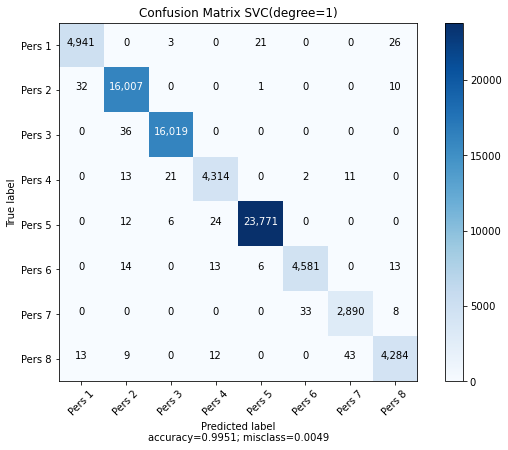

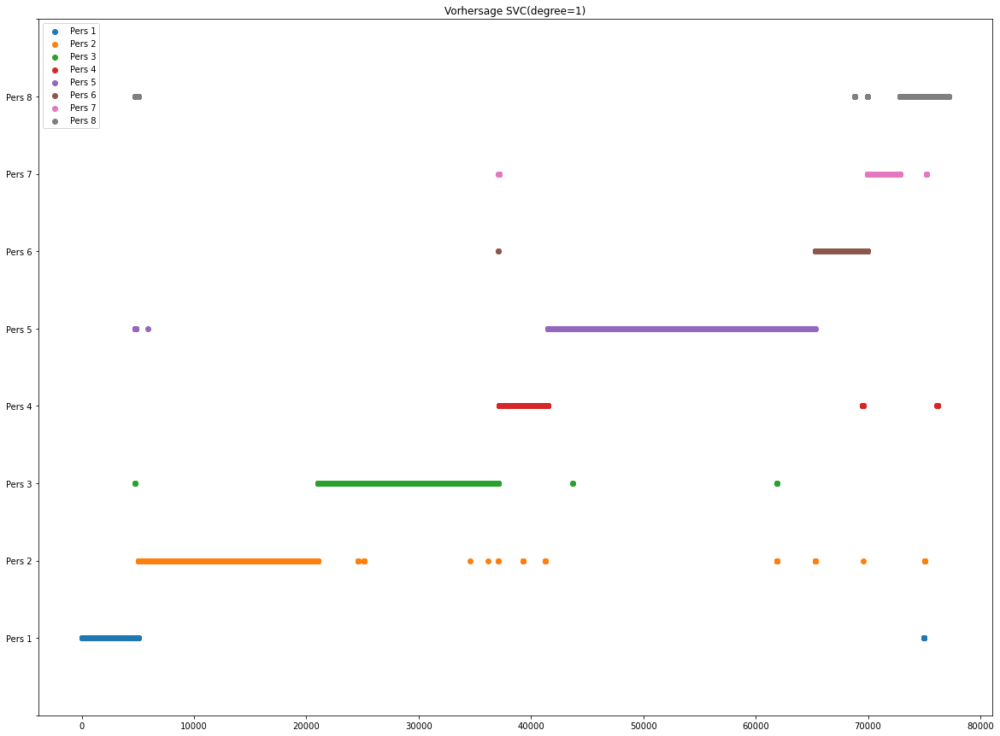

              precision    recall  f1-score   support

      Pers 1       0.99      0.99      0.99      4991
      Pers 2       0.99      1.00      1.00     16050
      Pers 3       1.00      1.00      1.00     16055
      Pers 4       0.99      0.99      0.99      4361
      Pers 5       1.00      1.00      1.00     23813
      Pers 6       0.99      0.99      0.99      4627
      Pers 7       0.98      0.99      0.98      2931
      Pers 8       0.99      0.98      0.98      4361

    accuracy                           1.00     77189
   macro avg       0.99      0.99      0.99     77189
weighted avg       1.00      1.00      1.00     77189



In [278]:
evaluateTest(classifiers, x_train, y_train, x_test, y_test, fileName="vergleich_Gehen.png")

Auf den Testdaten funktioniert das Erkennen der Person mit quasi perfekter Genauigkeit, auch wenn der Datensatz imbalanced ist, dadaurch, dass unterschiedliche Abtastraten verwendet wurden. daher gibt es hier auch nicht viel zu analysieren

In [279]:
print(datetime.datetime.now())

2021-01-24 18:05:25.070162


<a id="4_laufen"></a>
## Laufen

In [280]:
data_Train, data_Test = customTrainTestSplit(dataListLaufen)

Done with index  0
Done with index  1
Done with index  2
Done with index  3
Done with index  4
Done with index  5
Done with index  6
Done with index  7


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1783: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ret

In [281]:
dataset_train_laufen = generateBestDataset(data_Train)
dataset_test_laufen = generateBestDataset(data_Test)

windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000
at index  65000
at index  70000
at index  75000
at index  80000
at index  85000
at index  90000


/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning:

An input array is constant; the correlation coefficent is not defined.



at index  95000
at index  100000
at index  105000
at index  110000
at index  115000
at index  120000
at index  125000
at index  130000
at index  135000
at index  140000
at index  145000
at index  150000
at index  155000
at index  160000
at index  165000
at index  170000
at index  175000
at index  180000
windowsize:  50
at index  5000
at index  10000
at index  15000
at index  20000
at index  25000
at index  30000
at index  35000
at index  40000
at index  45000
at index  50000
at index  55000
at index  60000
at index  65000
at index  70000
at index  75000


In [282]:
dataset_train_laufen = impute(dataset_train_laufen.astype("float32"))
dataset_test_laufen = impute(dataset_test_laufen.astype("float32"))
dataset_train_laufen.shape, dataset_test_laufen.shape

((184714, 205), (79129, 205))

In [283]:
dataset_train_scaled, dataset_test_scaled, _ = standardize(dataset_train_laufen, dataset_test_laufen)

In [284]:
x_train = impute(dataset_train_scaled[:, :-1].astype("float32"))
y_train = (dataset_train_scaled[:,-1].astype("int"))

x_test = impute(dataset_test_scaled[:,:-1].astype("float32"))
y_test = (dataset_test_scaled[:,-1].astype("int"))

In [285]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((184714, 204), (79129, 204), (184714,), (79129,))

In [286]:
pca = PCA()

In [287]:
pca.fit(x_train)

PCA()

In [288]:
print(np.sum(pca.explained_variance_ratio_[:20]))
print(np.sum(pca.explained_variance_ratio_[:30]))
print(np.sum(pca.explained_variance_ratio_[:40]))

0.7600130483811935
0.8447008277824261
0.8962548762217333


In [289]:
np.sum(pca.explained_variance_ratio_[:45])

0.914184762392633

<a id="4_laufen_pca"></a>
### 45 Komponenten passen auch hier wieder

In [290]:
pca = PCA(n_components=45)
pca.fit(x_train)
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

In [291]:
classifiers = [SVC(cache_size=50000)]

In [292]:
x_train.shape, x_test.shape

((184714, 45), (79129, 45))

In [293]:
train_scores, val_scores = kFoldCrossVal(x_train=x_train,y_train=y_train,classifiers=classifiers,k=5)

fold:  1
clf:  SVC(cache_size=50000)
fitted
----------------------------------------------------------------------------------------------------
TRAIN
              precision    recall  f1-score   support

      Pers 1       1.00      1.00      1.00      9320
      Pers 2       1.00      1.00      1.00     29969
      Pers 3       1.00      1.00      1.00     29967
      Pers 4       1.00      1.00      1.00      6287
      Pers 5       1.00      1.00      1.00     44449
      Pers 6       1.00      1.00      1.00      8640
      Pers 7       1.00      1.00      1.00      7332
      Pers 8       1.00      1.00      1.00     11807

    accuracy                           1.00    147771
   macro avg       1.00      1.00      1.00    147771
weighted avg       1.00      1.00      1.00    147771

----------------------------------------------------------------------------------------------------
Validation
              precision    recall  f1-score   support

      Pers 1       0.94      0.

In [294]:
scoreMeanStd(train_scores, svc=classifiers[0], rndforest=None, lr=None)

SVC accuracy mean und std: 0.9999106726863483 , 5.0168889966426554e-05
SVC f1 mean und std: 0.9998728493552399 , 7.204104754339564e-05
----------------------------------------------------------------------------------------------------


In [295]:
scoreMeanStd(val_scores, svc=classifiers[0], rndforest=None, lr=None)

SVC accuracy mean und std: 0.9672034814015003 , 0.04191742119484577
SVC f1 mean und std: 0.954050650392754 , 0.06128229180422254
----------------------------------------------------------------------------------------------------


<a id="4_laufen_hyper"></a>
### Hyperparam Tuning

Da der rbf Kernel erfahrungsgemäß deutlich besser ist als der polynomiale verzichten wir hier darauf ihn erneut (mit bekanntem Ergebnis) zu testen

In [296]:
params = {"C": [1.0,3.0,5.0]}
gridSVC = GridSearchCV(SVC(kernel="rbf", class_weight="balanced", cache_size=50000), params, cv=5)
gridSVC.fit(x_train,y_train)
print(gridSVC.best_params_, gridSVC.best_score_)
print(gridSVC.cv_results_)

{'C': 1.0} 0.9672143109441602
{'mean_fit_time': array([20.8147871 , 15.74651136, 15.09780154]), 'std_fit_time': array([2.66006525, 1.13580506, 0.97472493]), 'mean_score_time': array([6.71435957, 5.03395219, 4.67636342]), 'std_score_time': array([0.91329604, 0.53865441, 0.44982657]), 'param_C': masked_array(data=[1.0, 3.0, 5.0],
             mask=[False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'C': 1.0}, {'C': 3.0}, {'C': 5.0}], 'split0_test_score': array([0.88338792, 0.88363154, 0.88403757]), 'split1_test_score': array([0.98551823, 0.98573478, 0.98551823]), 'split2_test_score': array([0.98784614, 0.98827924, 0.98773787]), 'split3_test_score': array([0.98787321, 0.98768373, 0.98787321]), 'split4_test_score': array([0.99144605, 0.9903362 , 0.99022792]), 'mean_test_score': array([0.96721431, 0.9671331 , 0.96707896]), 'std_test_score': array([0.04195602, 0.04177656, 0.04154743]), 'rank_test_score': array([1, 2, 3], dtype=int32)}


best params {'C': 1, 'kernel': 'rbf'} 0.9671512801337002

In [297]:
bestSvc = SVC(**gridSVC.best_params_)

In [298]:
print(datetime.datetime.now())

2021-01-24 18:38:23.410224


In [299]:
classifiers=[bestSvc]

clf:  SVC()
fitting
done


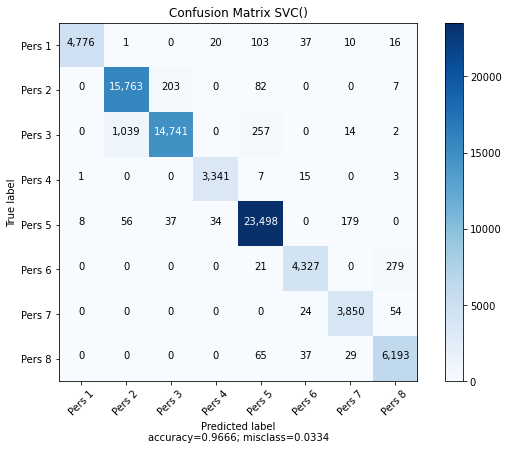

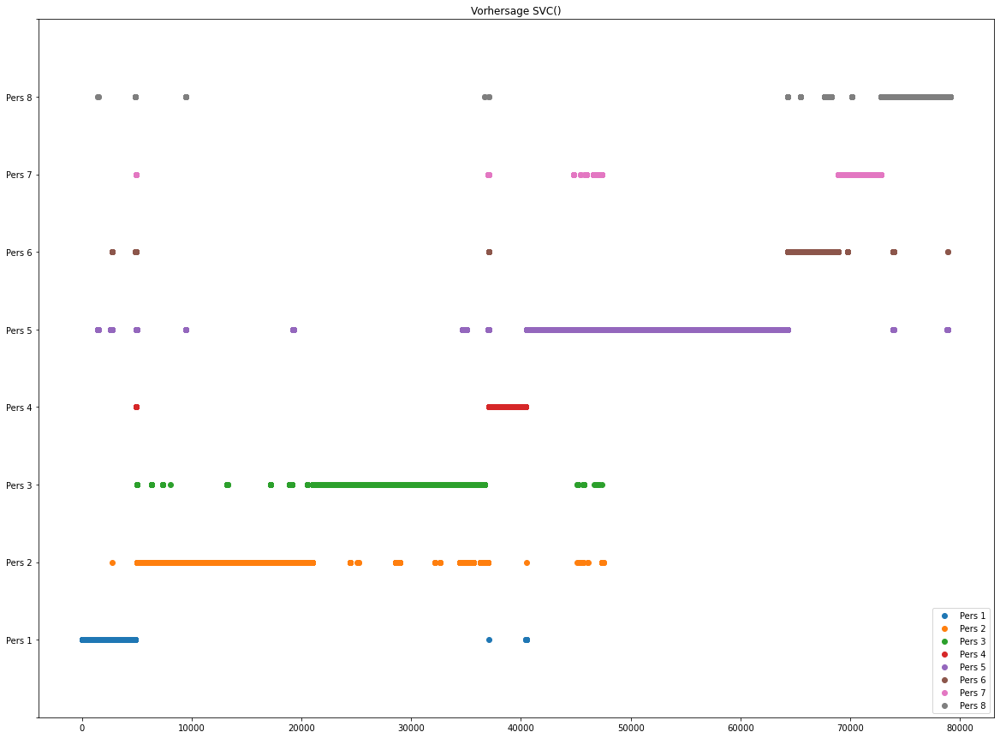

              precision    recall  f1-score   support

      Pers 1       1.00      0.96      0.98      4963
      Pers 2       0.93      0.98      0.96     16055
      Pers 3       0.98      0.92      0.95     16053
      Pers 4       0.98      0.99      0.99      3367
      Pers 5       0.98      0.99      0.98     23812
      Pers 6       0.97      0.94      0.95      4627
      Pers 7       0.94      0.98      0.96      3928
      Pers 8       0.94      0.98      0.96      6324

    accuracy                           0.97     79129
   macro avg       0.97      0.97      0.97     79129
weighted avg       0.97      0.97      0.97     79129



In [300]:
evaluateTest(classifiers, x_train, y_train, x_test, y_test, fileName="vergleich_Laufen.png")

Sehr ähnlich zum Gehen. Auch beim Laufen funktioniert das Erkennen der Person äußerst gut. Die einzige leichte Verwechslung findet bei Person 3 statt, die einige Male als Person 2 klassifiziert wurde. Insgesamt etwa 3 Prozentpunkte schlechter als beim Gehen. Man könnte also behaupten, dass es schwieriger ist anhand des Laufens Personen zu unterscheiden als anhand des Gehens. Das wirkt für uns allerdings eher kontraintuitiv, sodass wir vermuten, dass die Laufbewegung ungleichmäßiger ausgeführt wurde (da anstrengender) als das Gehen, weswegen mehr nicht-repräsentative Datenpunkte vorkommen, da die Personen sich zum Teil sozusagen selbst weniger ähneln als beim Gehen